# Install Libraries


In [1]:
%pip install torch torchvision torchaudio --quiet
%pip install tensorflow --quiet
%pip install plotly --quiet
%pip install --upgrade nbformat --quiet
%pip install --upgrade nbformat --user --quiet
%pip install ipykernel jupyter --quiet
%pip install tensorflow-addons --quiet

ERROR: Could not install packages due to an OSError: [Errno 30] Read-only file system: '/opt/conda/lib/python3.8/site-packages/nvidia/nvjitlink'

Note: you may need to restart the kernel to use updated packages.
ERROR: Could not install packages due to an OSError: [Errno 30] Read-only file system: '__init__.py'

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
ERROR: Could not install packages due to an OSError: [Errno 30] Read-only file system: '/opt/conda/lib/python3.8/site-packages/platformdirs'

Note: you may need to restart the kernel to use updated packages.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This be

# Classifer (Simple CNN)

In [2]:
import torch.nn as nn

# Define the CNN model
class SimpleCNN(nn.Module):
    def __init__(self, num_classes=10):  # 10 classes for MNIST digits (0-9)
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)  # Input channels = 1 for grayscale
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(64 * 7 * 7, 128)  # Adjusted input size for fc1 (7x7 after pooling)
        self.relu3 = nn.ReLU()
        self.fc2 = nn.Linear(128, num_classes)

    def forward(self, x):
        x = self.pool1(self.relu1(self.conv1(x)))
        x = self.pool2(self.relu2(self.conv2(x)))
        x = self.flatten(x)
        x = self.relu3(self.fc1(x))
        x = self.fc2(x)
        return x

/opt/conda/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Preprocess 5 Train - test dataset

In [ ]:
import torch
from torchvision import datasets, transforms
from collections import Counter
from sklearn.model_selection import KFold
import numpy as np
from sklearn.model_selection import StratifiedKFold
from collections import Counter
import random
# get imbalanced
def get_class_imabalnced(dataset, ratio):
  imbalanced_dataset = []
  for label in range(10):
    count = ratio[label]
    current_count = 0
    for data, target in dataset:
      if target == label and current_count < count:
        imbalanced_dataset.append((data, target))
        current_count += 1
  return imbalanced_dataset

def get_class_imabalnced2(dataset, ratio):
    imbalanced_dataset = []
    for label in range(10):
        count = ratio[label]
        current_count = 0

        # Shuffle data within the class:
        class_data = [(data, target) for data, target in dataset if target == label]
        random.shuffle(class_data)

        selected_indices = set()  # Keep track of selected indices

        for i, (data, target) in enumerate(class_data):  # Use enumerate
            if target == label and current_count < count and i not in selected_indices:
                imbalanced_dataset.append((data, target))
                current_count += 1
                selected_indices.add(i)
    return imbalanced_dataset

# Load dataset
mnist_dataset = datasets.CIFAR10(
  root="./data", 
  train=True, 
  download=True, 
  transform=transforms.Compose([
    transforms.Resize((28, 28)), 
    transforms.ToTensor()
])
)

# Prepare data for k-fold cross-validation
X = [data for data, _ in mnist_dataset]
y = [target for _, target in mnist_dataset]

# Initialize k-fold cross-validation
num_folds = 3
batch_size = 100

# Assuming 'y' is your target variable containing class labels
min_samples_per_class = min(Counter(y).values())
max_desired_count = min_samples_per_class // 5  # Dividing by 5 for 5-fold cross-validation

print(f"Minimum samples per class: {min_samples_per_class}")
print(f"Maximum allowed desired_count: {max_desired_count}")

# Create an imbalanced dataset
train_counts = {
  0: 3000,
  1: 2000,
  2: 1000,
  3: 750,
  4: 500,
  5: 12,
  6: 10,
  7: 8,
  8: 6,
  9: 4,
}

test_counts = {
    0: max_desired_count,
    1: max_desired_count,
    2: max_desired_count,
    3: max_desired_count,
    4: max_desired_count,
    5: max_desired_count,
    6: max_desired_count,
    7: max_desired_count,
    8: max_desired_count,
    9: max_desired_count,
}

imbalanced_train_dataset_list = []

kf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)
# Iterate over folds
folds_data = []
for fold, (train_index, test_index) in enumerate(kf.split(X,y)):
    print(f"Fold {fold + 1}")

    # Get the training data for this fold
    train_dataset_fold = [(X[i], y[i]) for i in train_index]

    # Apply the get_class_imabalnced function to enforce the desired distribution
    train_dataset = get_class_imabalnced2(train_dataset_fold, train_counts)

    imbalanced_train_dataset_list.append(train_dataset)

    # Create test dataset for this fold
    test_dataset_fold = [(X[i], y[i]) for i in test_index]
    test_dataset = get_class_imabalnced2(test_dataset_fold, test_counts)

    # Create datasets and dataloaders for this fold
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size , shuffle=True)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size , shuffle=True)

    folds_data.append([train_loader, test_loader])

    # Print class distribution for this fold
    class_counts_train = Counter([label for _, label in train_dataset])
    class_counts_test = Counter([label for _, label in test_dataset])
    print("Class distribution in Train dataset:", class_counts_train)
    print("Class distribution in Test dataset:", class_counts_test)

Files already downloaded and verified
Minimum samples per class: 5000
Maximum allowed desired_count: 1000
Fold 1
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})
Fold 2
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})
Fold 3
Class distribution in Train dataset: Counter({0: 3000, 1: 2000, 2: 1000, 3: 750, 4: 500, 5: 12, 6: 10, 7: 8, 8: 6, 9: 4})
Class distribution in Test dataset: Counter({0: 1000, 1: 1000, 2: 1000, 3: 1000, 4: 1000, 5: 1000, 6: 1000, 7: 1000, 8: 1000, 9: 1000})


In [4]:
for w in folds_data[0][0]:
    print(w[0][0].shape)
    break

torch.Size([3, 28, 28])


In [5]:
# save rawdata
import numpy as np
pathsave = '/home/s2522002/source_code/rawdata/train_test.npy'
np.save(pathsave,folds_data)

In [6]:
rank_acc,rank_pre,rank_rec,rank_f1 = [],[],[],[]

# CNN Imb Train-Test

In [7]:
# Create model, optimizer, and loss function
#check gpu
import torch.optim as optim
import torch.nn as nn
import statistics

from tqdm import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#set hyperparameter

num_epochs = 5
LR = 0.01
model = SimpleCNN().to(device) #ResNetMNIST().to(device)#SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.0, weight_decay=5e-4)

avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
cm_list = []
acsa_list = []

# Training loop
for datatset in folds_data:
    imbalanced_train_loader = datatset[0]
    for epoch in tqdm(range(num_epochs),desc='Loading...'):
        for batch_idx, (data, target) in enumerate(imbalanced_train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()

            output = model(data)

            loss = criterion(output, target)
            loss.backward()
            optimizer.step()

    print("Training finished!")

    # measure ACSA, GM, and FM from imbalanced_test_loader
    import numpy as np
    from sklearn.metrics import confusion_matrix

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode

    imbalanced_test_loader = datatset[1]
    true_labels = []
    predicted_labels = []

    with torch.no_grad():
        for data, target in imbalanced_test_loader:
            data = data.to(device)
            target = target.to(device)

            output = model(data)
            _, predicted = torch.max(output.data, 1)

            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())

    cm = confusion_matrix(true_labels, predicted_labels)
    cm_list.append(cm)

    ########################## Test ############################################
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []

    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn

      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0

      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)

    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)

    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0

    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2

    ## Keep ALL values to list
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))

print(cm_list)

Loading...: 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]


Training finished!
[0.8225200000000001]


Loading...: 100%|██████████| 5/5 [00:00<00:00,  7.87it/s]


Training finished!
[0.8225200000000001, 0.8318000000000001]


Loading...: 100%|██████████| 5/5 [00:00<00:00,  7.92it/s]


Training finished!
[0.8225200000000001, 0.8318000000000001, 0.8361600000000001]
Average Accuracy: 0.8301600000000001
Average Sensitivity: 0.1508
Average Specificity: 0.9056444444444445
Average Precision: 0.06259531734750107

G-mean: 0.36788012779453905
F-measure: 0.08770260709994025

ACSA: 0.4904800000000001
[array([[960,  40,   0,   0,   0,   0,   0,   0,   0,   0],
       [832, 166,   2,   0,   0,   0,   0,   0,   0,   0],
       [934,  66,   0,   0,   0,   0,   0,   0,   0,   0],
       [921,  78,   1,   0,   0,   0,   0,   0,   0,   0],
       [933,  61,   6,   0,   0,   0,   0,   0,   0,   0],
       [926,  74,   0,   0,   0,   0,   0,   0,   0,   0],
       [839, 158,   3,   0,   0,   0,   0,   0,   0,   0],
       [914,  84,   2,   0,   0,   0,   0,   0,   0,   0],
       [975,  25,   0,   0,   0,   0,   0,   0,   0,   0],
       [948,  52,   0,   0,   0,   0,   0,   0,   0,   0]]), array([[891,  93,  14,   2,   0,   0,   0,   0,   0,   0],
       [555, 388,  44,  13,   0,   0, 

In [8]:
rank_acc.append(avg_accuracy_list)
rank_pre.append(avg_precision_list)
rank_rec.append(avg_sensitivity_list)
rank_f1.append(f_measure_list)

# DeepCLSMOTE 

## Architecture

In [9]:
import torch
import torch.nn as nn
import numpy as np
from sklearn.neighbors import NearestNeighbors
import time
import torch.nn.functional as F

print(torch.version.cuda) 
t3 = time.time()
##############################################################################
"""args for AE"""

args = {}
args['dim_h'] = 64          # factor controlling size of hidden layers
args['n_channel'] = 3       # number of channels in the input data
args['n_z'] = 300           # number of dimensions in latent space.
args['sigma'] = 1.0         # variance in n_z
args['lambda'] = 0.01       # hyper param for weight of discriminator loss
args['lr'] = 0.0002         # learning rate for Adam optimizer .000
#args['epochs'] = 10        # how many epochs to run for (original used 200)
args['batch_size'] = 100    # batch size for SGD
args['save'] = True         # save weights at each epoch of training if True
args['train'] = True        # train networks if True, else load networks from
args['dataset'] = 'mnist'   #'fmnist' # specify which dataset to use
args['num_class'] = 10

##############################################################################



## create encoder model and decoder model
class Encoder(nn.Module):
    def __init__(self, args):
        super(Encoder, self).__init__()

        self.n_channel = args['n_channel']
        self.dim_h = args['dim_h']
        self.n_z = args['n_z']

        # convolutional filters, work excellent with image data
        self.conv = nn.Sequential(
            nn.Conv2d(self.n_channel, self.dim_h, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h, self.dim_h * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h * 2, self.dim_h * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(self.dim_h * 4, self.dim_h * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(self.dim_h * 8), 
            nn.LeakyReLU(0.2, inplace=True) )

        # final layer is fully connected
        self.fc = nn.Linear(self.dim_h * (2 ** 3), self.n_z)
        
    def forward(self, x, labsn):

        x = self.conv(x)

        # Class images Bagging
        train_list = [[] for _ in range(args['num_class'])]
        list_class_latent = [[] for _ in range(args['num_class'])]
        for i, label in enumerate(labsn):
          train_list[label].append(torch.tensor(x[i].cpu().detach().numpy()))
        
        #print(labsn)
        # For each class, we will get the latent representation
        for i, label in enumerate(labsn):
          class_sample = torch.stack(train_list[label])
          class_sample =  class_sample.squeeze().to(device) # Move x0 to the same device as self.fc
          class_sample_linear = self.fc(class_sample)
          
          if len(class_sample_linear.shape) == 1:
              class_sample_linear = class_sample_linear.unsqueeze(0)
          list_class_latent[label] = class_sample_linear

        # Mixed Class (For main reconstruction loss)
        x = x.squeeze()
        x = self.fc(x)

        #sys.exit(1)
        return x, list_class_latent


class Decoder(nn.Module):
    def __init__(self, args):
        super(Decoder, self).__init__()

        self.n_channel = args['n_channel']
        self.dim_h = args['dim_h']
        self.n_z = args['n_z']

        # first layer is fully connected
        self.fc = nn.Sequential(
            nn.Linear(self.n_z, self.dim_h * 8 * 7 * 7),
            nn.ReLU())

        # deconvolutional filters, essentially inverse of convolutional filters
        self.deconv = nn.Sequential(
            nn.ConvTranspose2d(self.dim_h * 8, self.dim_h * 4, 4),
            nn.BatchNorm2d(self.dim_h * 4),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.dim_h * 4, self.dim_h * 2, 4),
            nn.BatchNorm2d(self.dim_h * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d(self.dim_h * 2, args['n_channel'], 4, stride=2),
            nn.Tanh())

    def forward(self, x):
        x = self.fc(x)
        x = x.view(-1, self.dim_h * 8, 7, 7)
        x = self.deconv(x)
        return x

##############################################################################
"""set models, loss functions"""
# control which parameters are frozen / free for optimization
def free_params(module: nn.Module):
    for p in module.parameters():
        p.requires_grad = True

def frozen_params(module: nn.Module):
    for p in module.parameters():
        p.requires_grad = False

##############################################################################
"""functions to create SMOTE images"""

def biased_get_class1(c,data,target):

    xbeg = data[target == c]  # Filter data based on target value
    ybeg = target[target == c]  # Filter target based on target value

    return xbeg ,ybeg

def Generate_SMOTE(X, y,n_to_sample,cl):
    # fitting the model
    n_neigh = min(5 + 1,len(X))
    nn = NearestNeighbors(n_neighbors=n_neigh, n_jobs=1)
    nn.fit(X)
    dist, ind = nn.kneighbors(X)

    # generating samples
    base_indices = np.random.choice(list(range(len(X))),n_to_sample)
    neighbor_indices = np.random.choice(list(range(1, n_neigh)),n_to_sample)

    X_base = X[base_indices]
    X_neighbor = X[ind[base_indices, neighbor_indices]]
    samples = X_base + np.multiply(np.random.rand(n_to_sample,1),
            X_neighbor - X_base)


    #use 10 as label because 0 to 9 real classes and 1 fake/smoted = 10
    return samples, [cl]*n_to_sample

###############################################################################


11.8


## Contrastive Loss

In [10]:
def calculate_diffs(z):
    """
    Calculate the differences between elements in the input list 'z'
    and return the total sum of all differences for each original element.

    Args:
        z (list): A list of lists containing numerical values.

    Returns:
        list: A list containing the total sum of differences for each original element in 'z'.
    """
    all_diffs_list = []  # List to store lists of differences
    for i, arr1 in enumerate(z):
        diffs_for_arr1 = []  # Store differences for this arr1
        for j, arr2 in enumerate(z):
            if i != j:  # Skip comparing with itself
                diffs = []  # Store diffs for this pair of arr1, arr2
                for el1 in arr1:
                    # Calculate the sum of Euclidean distances between el1 and all elements in arr2
                    diff_for_el1 = sum(np.linalg.norm(np.array([el1.cpu().detach().numpy()]) - np.array([el2.cpu().detach().numpy()])) for el2 in arr2)
                    diffs.append(diff_for_el1)  # Append diff for el1 to diffs
                diffs_for_arr1.append(diffs)  # Append the diffs list for the current arr2
        all_diffs_list.append(diffs_for_arr1)  # Append the diffs_for_arr1

    # Sum all elements within each array to get a single total sum
    total_sums = [sum(sum(inner_list) for inner_list in outer_list) for outer_list in all_diffs_list]

    return total_sums


In [11]:
class NTXentLoss(nn.Module):
    def __init__(self, temperature=0.5):
        super().__init__()
        self.temperature = temperature

    def forward(self, z_i, z_j):
        z = torch.cat([z_i, z_j], dim=0)
        z = F.normalize(z, dim=1)

        similarity = torch.matmul(z, z.T)
        N = z_i.shape[0]

        mask = (~torch.eye(2*N, dtype=bool)).to(z.device)
        sim = similarity / self.temperature
        exp_sim = torch.exp(sim) * mask

        positive_sim = torch.exp(F.cosine_similarity(z_i, z_j) / self.temperature)
        positives = torch.cat([positive_sim, positive_sim], dim=0)

        denominator = exp_sim.sum(dim=1)
        loss = -torch.log(positives / denominator)
        return loss.mean()

In [12]:
"""
Author: Yonglong Tian (yonglong@mit.edu)
Date: May 07, 2020
"""
from __future__ import print_function

import torch
import torch.nn as nn


class SupConLoss(nn.Module):
    """Supervised Contrastive Learning: https://arxiv.org/pdf/2004.11362.pdf.
    It also supports the unsupervised contrastive loss in SimCLR"""
    def __init__(self, contrast_mode='all',
                 base_temperature=0.15):
        super(SupConLoss, self).__init__()
        #self.temperature = temperature
        self.contrast_mode = contrast_mode
        self.base_temperature = base_temperature

    def forward(self, features, temperature, labels=None, mask=None):
        """Compute loss for model. If both `labels` and `mask` are None,
        it degenerates to SimCLR unsupervised loss:
        https://arxiv.org/pdf/2002.05709.pdf

        Args:
            features: hidden vector of shape [bsz, n_views, ...].
            labels: ground truth of shape [bsz].
            mask: contrastive mask of shape [bsz, bsz], mask_{i,j}=1 if sample j
                has the same class as sample i. Can be asymmetric.
        Returns:
            A loss scalar.
        """
        self.temperature = temperature
        
        device = (torch.device('cuda')
                  if features.is_cuda
                  else torch.device('cpu'))

        if len(features.shape) < 3:
            raise ValueError('`features` needs to be [bsz, n_views, ...],'
                             'at least 3 dimensions are required')
        if len(features.shape) > 3:
            features = features.view(features.shape[0], features.shape[1], -1)

        batch_size = features.shape[0]
        if labels is not None and mask is not None:
            raise ValueError('Cannot define both `labels` and `mask`')
        elif labels is None and mask is None:
            mask = torch.eye(batch_size, dtype=torch.float32).to(device)
        elif labels is not None:
            labels = labels.contiguous().view(-1, 1)
            if labels.shape[0] != batch_size:
                raise ValueError('Num of labels does not match num of features')
            mask = torch.eq(labels, labels.T).float().to(device)
        else:
            mask = mask.float().to(device)

        contrast_count = features.shape[1]
        contrast_feature = torch.cat(torch.unbind(features, dim=1), dim=0)
        if self.contrast_mode == 'one':
            anchor_feature = features[:, 0]
            anchor_count = 1
        elif self.contrast_mode == 'all':
            anchor_feature = contrast_feature
            anchor_count = contrast_count
        else:
            raise ValueError('Unknown mode: {}'.format(self.contrast_mode))

        # compute logits
        anchor_dot_contrast = torch.div(
            torch.matmul(anchor_feature, contrast_feature.T),
            self.temperature)
        # for numerical stability
        logits_max, _ = torch.max(anchor_dot_contrast, dim=1, keepdim=True)
        logits = anchor_dot_contrast - logits_max.detach()

        # tile mask
        mask = mask.repeat(anchor_count, contrast_count)
        # mask-out self-contrast cases
        logits_mask = torch.scatter(
            torch.ones_like(mask),
            1,
            torch.arange(batch_size * anchor_count).view(-1, 1).to(device),
            0
        )
        mask = mask * logits_mask

        # compute log_prob
        exp_logits = torch.exp(logits) * logits_mask
        log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True))

        # compute mean of log-likelihood over positive
        # modified to handle edge cases when there is no positive pair
        # for an anchor point. 
        # Edge case e.g.:- 
        # features of shape: [4,1,...]
        # labels:            [0,1,1,2]
        # loss before mean:  [nan, ..., ..., nan] 
        mask_pos_pairs = mask.sum(1)
        mask_pos_pairs = torch.where(mask_pos_pairs < 1e-6, 1, mask_pos_pairs)
        mean_log_prob_pos = (mask * log_prob).sum(1) / mask_pos_pairs

        # loss
        loss = - (self.temperature / self.base_temperature) * mean_log_prob_pos
        loss = loss.view(anchor_count, batch_size).mean()

        return loss

## Traning - Gen - Evalution (SubCon)


Start...
cuda


Loading...:   0%|          | 0/73 [00:00<?, ?it/s]/JOBs/tmpdir/pbs.13809618.spcc-adm1/ipykernel_3456018/2772195971.py:103: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at /opt/pytorch/pytorch/torch/csrc/utils/tensor_new.cpp:230.)
  z_hat_to_concat.append(torch.tensor(tensor).to(device))
Loading...: 100%|██████████| 73/73 [00:03<00:00, 21.68it/s]


Epoch 0: MSE: 0.1175, Contrastive: 4.2697, Combined: 2.1936


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.04it/s]


Epoch 1: MSE: 0.0376, Contrastive: 3.6425, Combined: 1.8400


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.12it/s]


Epoch 2: MSE: 0.0248, Contrastive: 3.5813, Combined: 1.8031


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.34it/s]


Epoch 3: MSE: 0.0203, Contrastive: 3.5516, Combined: 1.7859


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.02it/s]


Epoch 4: MSE: 0.0172, Contrastive: 3.5420, Combined: 1.7796


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 5: MSE: 0.0151, Contrastive: 3.5348, Combined: 1.7750


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.14it/s]


Epoch 6: MSE: 0.0141, Contrastive: 3.5329, Combined: 1.7735


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.39it/s]


Epoch 7: MSE: 0.0133, Contrastive: 3.5295, Combined: 1.7714


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.57it/s]


Epoch 8: MSE: 0.0124, Contrastive: 3.5286, Combined: 1.7705


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.66it/s]


Epoch 9: MSE: 0.0115, Contrastive: 3.5267, Combined: 1.7691


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 10: MSE: 0.0113, Contrastive: 3.5266, Combined: 1.7689


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 11: MSE: 0.0105, Contrastive: 3.5253, Combined: 1.7679


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 12: MSE: 0.0100, Contrastive: 3.5245, Combined: 1.7673


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.49it/s]


Epoch 13: MSE: 0.0096, Contrastive: 3.5241, Combined: 1.7668


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.21it/s]


Epoch 14: MSE: 0.0094, Contrastive: 3.5243, Combined: 1.7668


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.49it/s]


Epoch 15: MSE: 0.0089, Contrastive: 3.5243, Combined: 1.7666


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 16: MSE: 0.0089, Contrastive: 3.5237, Combined: 1.7663


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.48it/s]


Epoch 17: MSE: 0.0087, Contrastive: 3.5235, Combined: 1.7661


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.26it/s]


Epoch 18: MSE: 0.0085, Contrastive: 3.5233, Combined: 1.7659


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.39it/s]


Epoch 19: MSE: 0.0084, Contrastive: 3.5237, Combined: 1.7661


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.37it/s]


Epoch 20: MSE: 0.0079, Contrastive: 3.5231, Combined: 1.7655


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.40it/s]


Epoch 21: MSE: 0.0077, Contrastive: 3.5227, Combined: 1.7652


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.34it/s]


Epoch 22: MSE: 0.0076, Contrastive: 3.5222, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 23: MSE: 0.0075, Contrastive: 3.5224, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.57it/s]


Epoch 24: MSE: 0.0073, Contrastive: 3.5226, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 25: MSE: 0.0074, Contrastive: 3.5224, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.10it/s]


Epoch 26: MSE: 0.0071, Contrastive: 3.5223, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.11it/s]


Epoch 27: MSE: 0.0070, Contrastive: 3.5221, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.76it/s]


Epoch 28: MSE: 0.0069, Contrastive: 3.5214, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 29: MSE: 0.0068, Contrastive: 3.5218, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.67it/s]


Epoch 30: MSE: 0.0066, Contrastive: 3.5215, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.25it/s]


Epoch 31: MSE: 0.0066, Contrastive: 3.5218, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 32: MSE: 0.0067, Contrastive: 3.5219, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.20it/s]


Epoch 33: MSE: 0.0064, Contrastive: 3.5214, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 34: MSE: 0.0063, Contrastive: 3.5218, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 35: MSE: 0.0061, Contrastive: 3.5216, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.64it/s]


Epoch 36: MSE: 0.0061, Contrastive: 3.5212, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.29it/s]


Epoch 37: MSE: 0.0060, Contrastive: 3.5215, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.72it/s]


Epoch 38: MSE: 0.0060, Contrastive: 3.5211, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.17it/s]


Epoch 39: MSE: 0.0060, Contrastive: 3.5209, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.64it/s]


Epoch 40: MSE: 0.0059, Contrastive: 3.5210, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 41: MSE: 0.0057, Contrastive: 3.5212, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.44it/s]


Epoch 42: MSE: 0.0058, Contrastive: 3.5207, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.55it/s]


Epoch 43: MSE: 0.0057, Contrastive: 3.5212, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 44: MSE: 0.0056, Contrastive: 3.5202, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.05it/s]


Epoch 45: MSE: 0.0055, Contrastive: 3.5200, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.49it/s]


Epoch 46: MSE: 0.0054, Contrastive: 3.5200, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 47: MSE: 0.0054, Contrastive: 3.5207, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.98it/s]


Epoch 48: MSE: 0.0053, Contrastive: 3.5202, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.49it/s]


Epoch 49: MSE: 0.0054, Contrastive: 3.5201, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.44it/s]


Epoch 50: MSE: 0.0053, Contrastive: 3.5202, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 51: MSE: 0.0053, Contrastive: 3.5199, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 52: MSE: 0.0051, Contrastive: 3.5199, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 53: MSE: 0.0051, Contrastive: 3.5195, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.66it/s]


Epoch 54: MSE: 0.0050, Contrastive: 3.5195, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.92it/s]


Epoch 55: MSE: 0.0053, Contrastive: 3.5196, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.66it/s]


Epoch 56: MSE: 0.0052, Contrastive: 3.5198, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.24it/s]


Epoch 57: MSE: 0.0053, Contrastive: 3.5193, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.69it/s]


Epoch 58: MSE: 0.0048, Contrastive: 3.5196, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.55it/s]


Epoch 59: MSE: 0.0050, Contrastive: 3.5196, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.39it/s]


Epoch 60: MSE: 0.0049, Contrastive: 3.5198, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.09it/s]


Epoch 61: MSE: 0.0049, Contrastive: 3.5193, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.46it/s]


Epoch 62: MSE: 0.0047, Contrastive: 3.5194, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.49it/s]


Epoch 63: MSE: 0.0047, Contrastive: 3.5197, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.10it/s]


Epoch 64: MSE: 0.0047, Contrastive: 3.5198, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.71it/s]


Epoch 65: MSE: 0.0046, Contrastive: 3.5193, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.25it/s]


Epoch 66: MSE: 0.0044, Contrastive: 3.5196, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.14it/s]


Epoch 67: MSE: 0.0046, Contrastive: 3.5192, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.50it/s]


Epoch 68: MSE: 0.0045, Contrastive: 3.5195, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.73it/s]


Epoch 69: MSE: 0.0046, Contrastive: 3.5188, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.24it/s]


Epoch 70: MSE: 0.0046, Contrastive: 3.5189, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.30it/s]


Epoch 71: MSE: 0.0046, Contrastive: 3.5194, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.30it/s]


Epoch 72: MSE: 0.0044, Contrastive: 3.5193, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 73: MSE: 0.0045, Contrastive: 3.5194, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.62it/s]


Epoch 74: MSE: 0.0047, Contrastive: 3.5198, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.48it/s]


Epoch 75: MSE: 0.0046, Contrastive: 3.5190, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.58it/s]


Epoch 76: MSE: 0.0044, Contrastive: 3.5193, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.10it/s]


Epoch 77: MSE: 0.0043, Contrastive: 3.5194, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.97it/s]


Epoch 78: MSE: 0.0043, Contrastive: 3.5195, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.28it/s]


Epoch 79: MSE: 0.0042, Contrastive: 3.5192, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.39it/s]


Epoch 80: MSE: 0.0043, Contrastive: 3.5197, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.19it/s]


Epoch 81: MSE: 0.0042, Contrastive: 3.5190, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.02it/s]


Epoch 82: MSE: 0.0042, Contrastive: 3.5190, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 83: MSE: 0.0041, Contrastive: 3.5194, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.18it/s]


Epoch 84: MSE: 0.0042, Contrastive: 3.5189, Combined: 1.7615


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 85: MSE: 0.0042, Contrastive: 3.5199, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.68it/s]


Epoch 86: MSE: 0.0042, Contrastive: 3.5193, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.96it/s]


Epoch 87: MSE: 0.0042, Contrastive: 3.5193, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.67it/s]


Epoch 88: MSE: 0.0041, Contrastive: 3.5198, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 89: MSE: 0.0041, Contrastive: 3.5191, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.61it/s]


Epoch 90: MSE: 0.0042, Contrastive: 3.5187, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 91: MSE: 0.0042, Contrastive: 3.5195, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.41it/s]


Epoch 92: MSE: 0.0039, Contrastive: 3.5193, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.51it/s]


Epoch 93: MSE: 0.0041, Contrastive: 3.5201, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 94: MSE: 0.0040, Contrastive: 3.5194, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.88it/s]


Epoch 95: MSE: 0.0039, Contrastive: 3.5188, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.03it/s]


Epoch 96: MSE: 0.0039, Contrastive: 3.5192, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.43it/s]


Epoch 97: MSE: 0.0037, Contrastive: 3.5192, Combined: 1.7615


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.48it/s]


Epoch 98: MSE: 0.0039, Contrastive: 3.5194, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.30it/s]


Epoch 99: MSE: 0.0040, Contrastive: 3.5194, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.45it/s]


Epoch 100: MSE: 0.0039, Contrastive: 3.5195, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.23it/s]


Epoch 101: MSE: 0.0038, Contrastive: 3.5200, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 102: MSE: 0.0040, Contrastive: 3.5195, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.64it/s]


Epoch 103: MSE: 0.0039, Contrastive: 3.5200, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.80it/s]


Epoch 104: MSE: 0.0038, Contrastive: 3.5198, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.21it/s]


Epoch 105: MSE: 0.0038, Contrastive: 3.5198, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 106: MSE: 0.0037, Contrastive: 3.5194, Combined: 1.7616


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.34it/s]


Epoch 107: MSE: 0.0037, Contrastive: 3.5203, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.65it/s]


Epoch 108: MSE: 0.0035, Contrastive: 3.5191, Combined: 1.7613


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.24it/s]


Epoch 109: MSE: 0.0037, Contrastive: 3.5197, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.55it/s]


Epoch 110: MSE: 0.0036, Contrastive: 3.5199, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.28it/s]


Epoch 111: MSE: 0.0037, Contrastive: 3.5199, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.50it/s]


Epoch 112: MSE: 0.0039, Contrastive: 3.5215, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.29it/s]


Epoch 113: MSE: 0.0037, Contrastive: 3.5203, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 114: MSE: 0.0037, Contrastive: 3.5208, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.26it/s]


Epoch 115: MSE: 0.0037, Contrastive: 3.5200, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.13it/s]


Epoch 116: MSE: 0.0038, Contrastive: 3.5216, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 117: MSE: 0.0037, Contrastive: 3.5202, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.51it/s]


Epoch 118: MSE: 0.0036, Contrastive: 3.5208, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.55it/s]


Epoch 119: MSE: 0.0035, Contrastive: 3.5206, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.47it/s]


Epoch 120: MSE: 0.0037, Contrastive: 3.5209, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.50it/s]


Epoch 121: MSE: 0.0037, Contrastive: 3.5214, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.24it/s]


Epoch 122: MSE: 0.0037, Contrastive: 3.5214, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.00it/s]


Epoch 123: MSE: 0.0035, Contrastive: 3.5202, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.52it/s]


Epoch 124: MSE: 0.0036, Contrastive: 3.5216, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.58it/s]


Epoch 125: MSE: 0.0035, Contrastive: 3.5211, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.65it/s]


Epoch 126: MSE: 0.0036, Contrastive: 3.5212, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.29it/s]


Epoch 127: MSE: 0.0036, Contrastive: 3.5210, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.54it/s]


Epoch 128: MSE: 0.0035, Contrastive: 3.5219, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 129: MSE: 0.0034, Contrastive: 3.5216, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.34it/s]


Epoch 130: MSE: 0.0035, Contrastive: 3.5222, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.40it/s]


Epoch 131: MSE: 0.0036, Contrastive: 3.5234, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.64it/s]


Epoch 132: MSE: 0.0033, Contrastive: 3.5217, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.16it/s]


Epoch 133: MSE: 0.0035, Contrastive: 3.5232, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.35it/s]


Epoch 134: MSE: 0.0036, Contrastive: 3.5230, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.38it/s]


Epoch 135: MSE: 0.0035, Contrastive: 3.5225, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.56it/s]


Epoch 136: MSE: 0.0035, Contrastive: 3.5229, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.56it/s]


Epoch 137: MSE: 0.0034, Contrastive: 3.5222, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.80it/s]


Epoch 138: MSE: 0.0033, Contrastive: 3.5227, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.31it/s]


Epoch 139: MSE: 0.0035, Contrastive: 3.5232, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.68it/s]


Epoch 140: MSE: 0.0036, Contrastive: 3.5240, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.20it/s]


Epoch 141: MSE: 0.0034, Contrastive: 3.5240, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 142: MSE: 0.0036, Contrastive: 3.5250, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.55it/s]


Epoch 143: MSE: 0.0035, Contrastive: 3.5230, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.43it/s]


Epoch 144: MSE: 0.0033, Contrastive: 3.5226, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.32it/s]


Epoch 145: MSE: 0.0034, Contrastive: 3.5231, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.62it/s]


Epoch 146: MSE: 0.0034, Contrastive: 3.5235, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.18it/s]


Epoch 147: MSE: 0.0034, Contrastive: 3.5240, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.43it/s]


Epoch 148: MSE: 0.0033, Contrastive: 3.5240, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.47it/s]


Epoch 149: MSE: 0.0035, Contrastive: 3.5243, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.27it/s]


Epoch 150: MSE: 0.0041, Contrastive: 3.5547, Combined: 1.7794


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.67it/s]


Epoch 151: MSE: 0.0041, Contrastive: 3.5240, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 152: MSE: 0.0035, Contrastive: 3.5232, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.61it/s]


Epoch 153: MSE: 0.0035, Contrastive: 3.5227, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.33it/s]


Epoch 154: MSE: 0.0031, Contrastive: 3.5226, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.32it/s]


Epoch 155: MSE: 0.0032, Contrastive: 3.5224, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.33it/s]


Epoch 156: MSE: 0.0030, Contrastive: 3.5218, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.60it/s]


Epoch 157: MSE: 0.0032, Contrastive: 3.5232, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.46it/s]


Epoch 158: MSE: 0.0032, Contrastive: 3.5231, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.47it/s]


Epoch 159: MSE: 0.0031, Contrastive: 3.5234, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.38it/s]


Epoch 160: MSE: 0.0032, Contrastive: 3.5227, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.42it/s]


Epoch 161: MSE: 0.0034, Contrastive: 3.5238, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.34it/s]


Epoch 162: MSE: 0.0031, Contrastive: 3.5238, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.09it/s]


Epoch 163: MSE: 0.0032, Contrastive: 3.5237, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.40it/s]


Epoch 164: MSE: 0.0032, Contrastive: 3.5243, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.27it/s]


Epoch 165: MSE: 0.0033, Contrastive: 3.5244, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.30it/s]


Epoch 166: MSE: 0.0036, Contrastive: 3.5246, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.26it/s]


Epoch 167: MSE: 0.0034, Contrastive: 3.5257, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.45it/s]


Epoch 168: MSE: 0.0034, Contrastive: 3.5250, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.52it/s]


Epoch 169: MSE: 0.0033, Contrastive: 3.5247, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.09it/s]


Epoch 170: MSE: 0.0034, Contrastive: 3.5255, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.01it/s]


Epoch 171: MSE: 0.0034, Contrastive: 3.5258, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.03it/s]


Epoch 172: MSE: 0.0033, Contrastive: 3.5244, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.96it/s]


Epoch 173: MSE: 0.0033, Contrastive: 3.5248, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.33it/s]


Epoch 174: MSE: 0.0035, Contrastive: 3.5264, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.28it/s]


Epoch 175: MSE: 0.0034, Contrastive: 3.5252, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.97it/s]


Epoch 176: MSE: 0.0034, Contrastive: 3.5250, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.01it/s]


Epoch 177: MSE: 0.0033, Contrastive: 3.5250, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.98it/s]


Epoch 178: MSE: 0.0034, Contrastive: 3.5262, Combined: 1.7648


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.03it/s]


Epoch 179: MSE: 0.0034, Contrastive: 3.5285, Combined: 1.7659


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.27it/s]


Epoch 180: MSE: 0.0033, Contrastive: 3.5246, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.14it/s]


Epoch 181: MSE: 0.0033, Contrastive: 3.5250, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.63it/s]


Epoch 182: MSE: 0.0033, Contrastive: 3.5231, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.29it/s]


Epoch 183: MSE: 0.0033, Contrastive: 3.5244, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.47it/s]


Epoch 184: MSE: 0.0032, Contrastive: 3.5243, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.38it/s]


Epoch 185: MSE: 0.0032, Contrastive: 3.5245, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.62it/s]


Epoch 186: MSE: 0.0033, Contrastive: 3.5237, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.36it/s]


Epoch 187: MSE: 0.0033, Contrastive: 3.5239, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.68it/s]


Epoch 188: MSE: 0.0033, Contrastive: 3.5240, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.06it/s]


Epoch 189: MSE: 0.0032, Contrastive: 3.5240, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.45it/s]


Epoch 190: MSE: 0.0032, Contrastive: 3.5237, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.32it/s]


Epoch 191: MSE: 0.0031, Contrastive: 3.5242, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.51it/s]


Epoch 192: MSE: 0.0033, Contrastive: 3.5228, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.47it/s]


Epoch 193: MSE: 0.0032, Contrastive: 3.5233, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.60it/s]


Epoch 194: MSE: 0.0031, Contrastive: 3.5241, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.37it/s]


Epoch 195: MSE: 0.0031, Contrastive: 3.5222, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.53it/s]


Epoch 196: MSE: 0.0030, Contrastive: 3.5218, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.48it/s]


Epoch 197: MSE: 0.0030, Contrastive: 3.5224, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 40.57it/s]


Epoch 198: MSE: 0.0031, Contrastive: 3.5216, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.69it/s]


Epoch 199: MSE: 0.0030, Contrastive: 3.5218, Combined: 1.7624
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.08
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


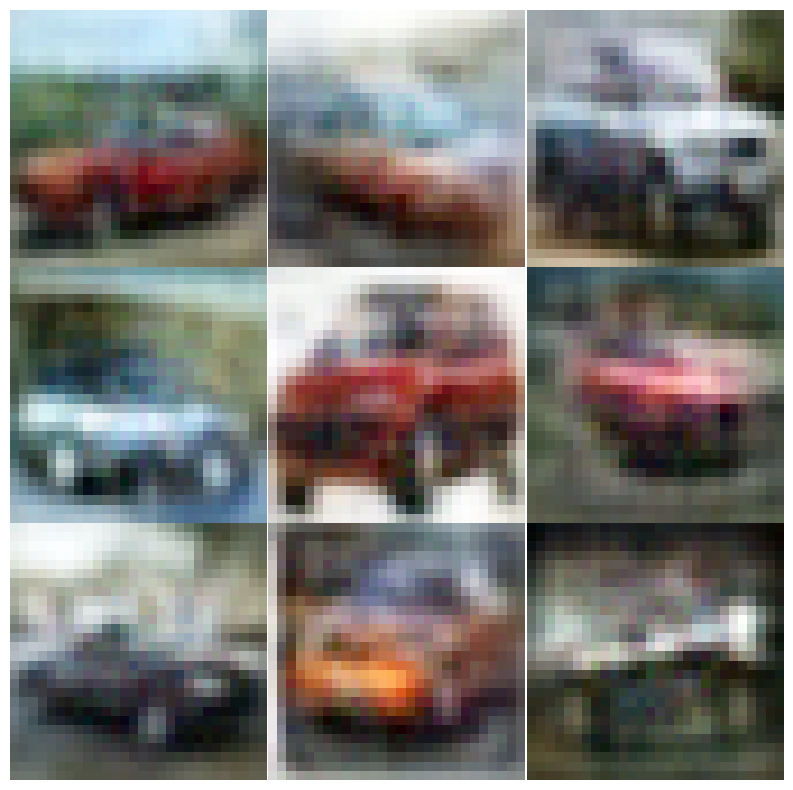

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


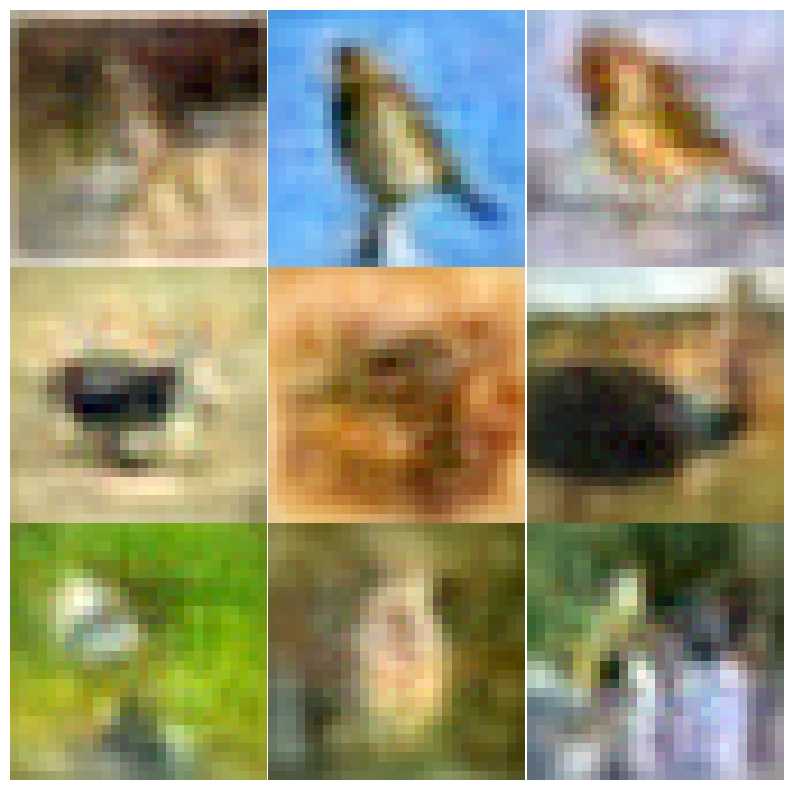

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


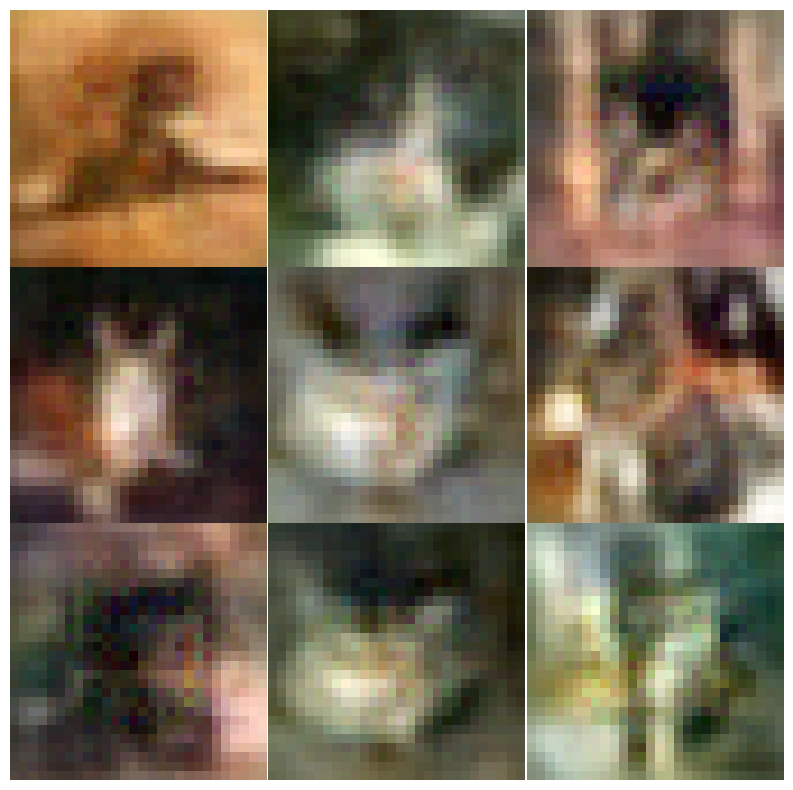

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


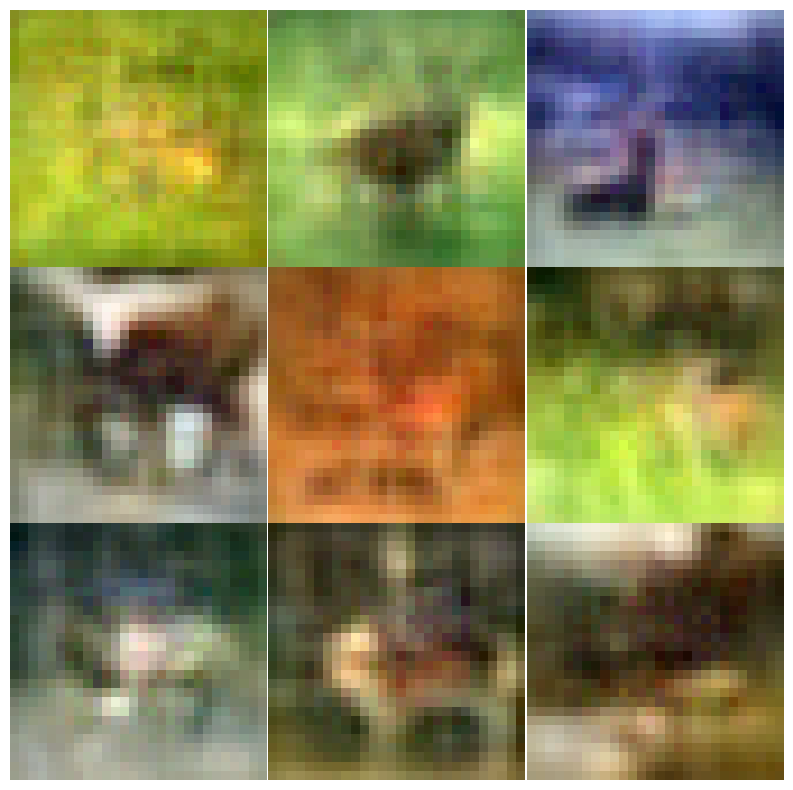

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


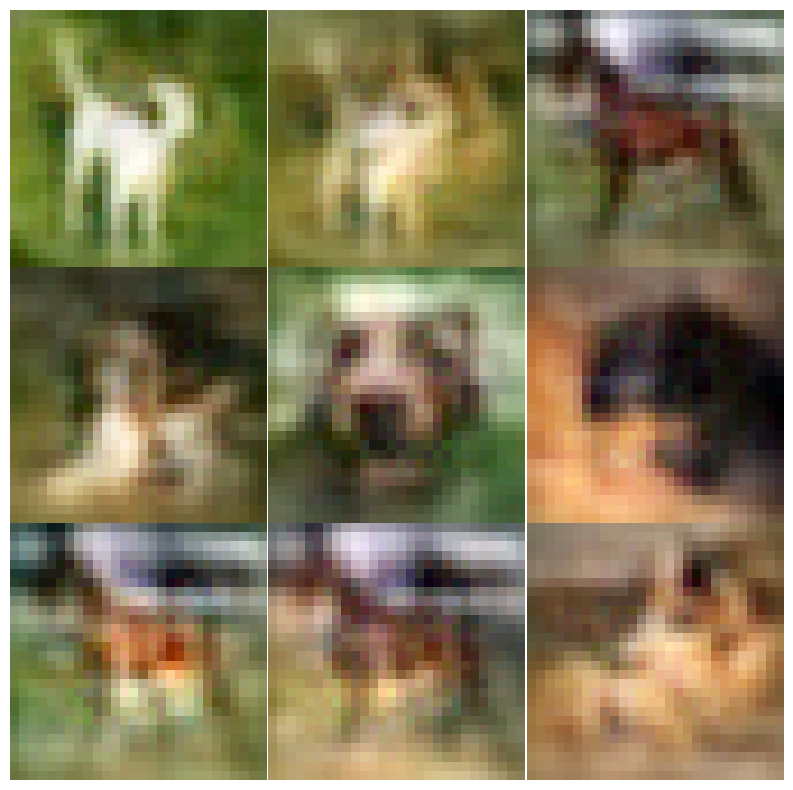

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


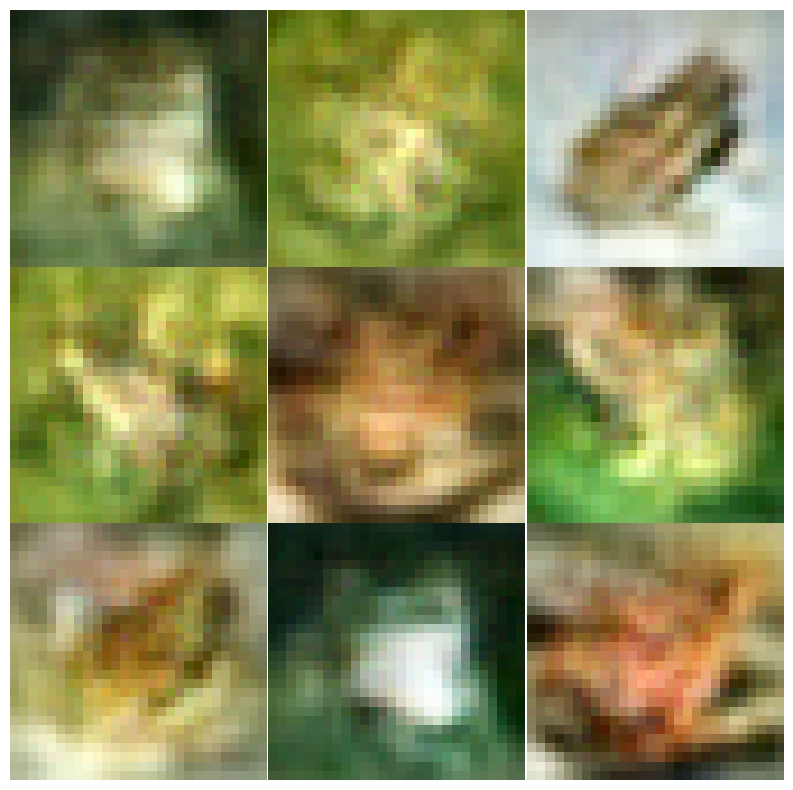

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


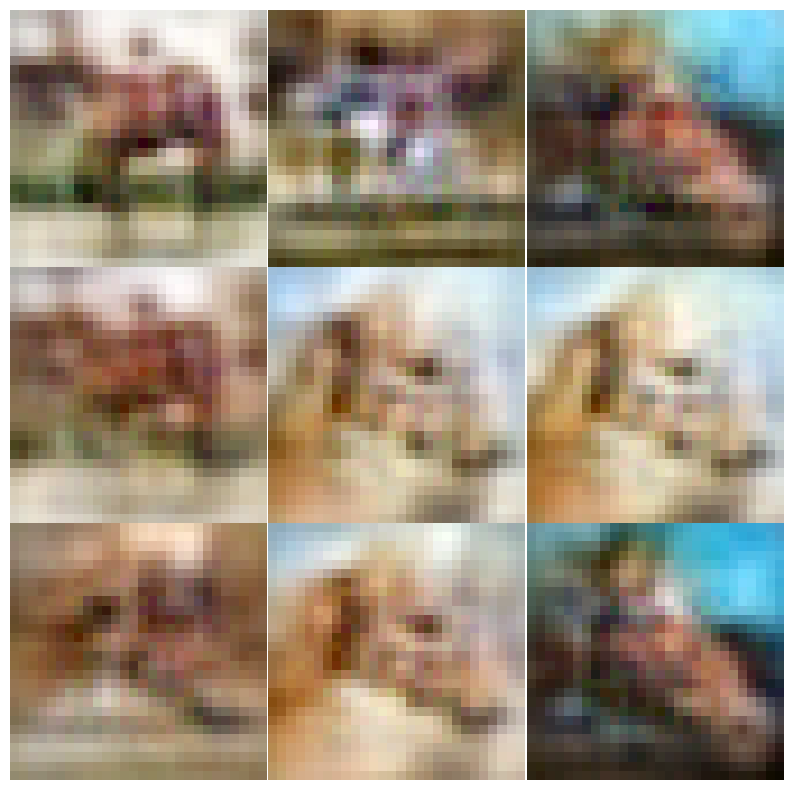

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


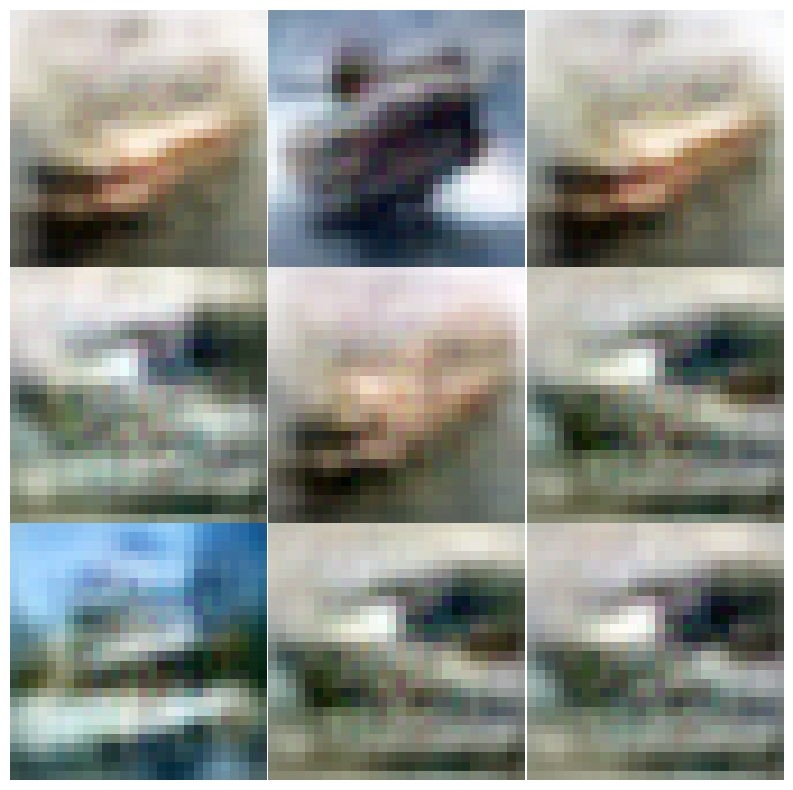

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


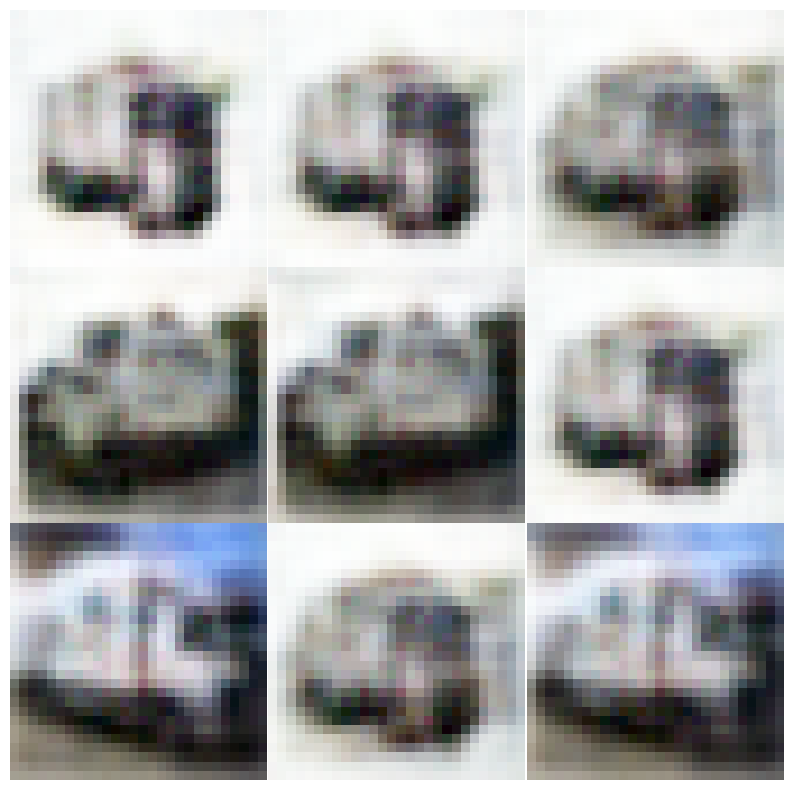

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.294490
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.273232
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.266377
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.176477
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.158078
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.073078
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.852272
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.759779
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.636454
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.662583
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.571479
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.532923
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.170635
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.234316
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.240816
Train Epoch: 1 [16000/30

Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 0: MSE: 0.1438, Contrastive: 4.5503, Combined: 2.3471


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.17it/s]


Epoch 1: MSE: 0.0400, Contrastive: 3.6132, Combined: 1.8266


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.19it/s]


Epoch 2: MSE: 0.0266, Contrastive: 3.5708, Combined: 1.7987


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.73it/s]


Epoch 3: MSE: 0.0212, Contrastive: 3.5674, Combined: 1.7943


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 4: MSE: 0.0185, Contrastive: 3.5559, Combined: 1.7872


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 5: MSE: 0.0161, Contrastive: 3.5435, Combined: 1.7798


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 6: MSE: 0.0154, Contrastive: 3.5410, Combined: 1.7782


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.02it/s]


Epoch 7: MSE: 0.0137, Contrastive: 3.5370, Combined: 1.7754


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 8: MSE: 0.0132, Contrastive: 3.5327, Combined: 1.7730


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.63it/s]


Epoch 9: MSE: 0.0127, Contrastive: 3.5314, Combined: 1.7720


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 10: MSE: 0.0117, Contrastive: 3.5300, Combined: 1.7708


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 11: MSE: 0.0114, Contrastive: 3.5301, Combined: 1.7707


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.53it/s]


Epoch 12: MSE: 0.0111, Contrastive: 3.5285, Combined: 1.7698


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 13: MSE: 0.0103, Contrastive: 3.5276, Combined: 1.7689


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.68it/s]


Epoch 14: MSE: 0.0101, Contrastive: 3.5261, Combined: 1.7681


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.85it/s]


Epoch 15: MSE: 0.0095, Contrastive: 3.5258, Combined: 1.7676


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.19it/s]


Epoch 16: MSE: 0.0093, Contrastive: 3.5260, Combined: 1.7676


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.30it/s]


Epoch 17: MSE: 0.0091, Contrastive: 3.5253, Combined: 1.7672


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 18: MSE: 0.0089, Contrastive: 3.5256, Combined: 1.7673


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.31it/s]


Epoch 19: MSE: 0.0087, Contrastive: 3.5250, Combined: 1.7669


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.40it/s]


Epoch 20: MSE: 0.0086, Contrastive: 3.5250, Combined: 1.7668


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 21: MSE: 0.0082, Contrastive: 3.5250, Combined: 1.7666


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.00it/s]


Epoch 22: MSE: 0.0079, Contrastive: 3.5244, Combined: 1.7662


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 23: MSE: 0.0080, Contrastive: 3.5244, Combined: 1.7662


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.34it/s]


Epoch 24: MSE: 0.0078, Contrastive: 3.5243, Combined: 1.7661


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.35it/s]


Epoch 25: MSE: 0.0075, Contrastive: 3.5241, Combined: 1.7658


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.20it/s]


Epoch 26: MSE: 0.0075, Contrastive: 3.5242, Combined: 1.7659


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.22it/s]


Epoch 27: MSE: 0.0074, Contrastive: 3.5238, Combined: 1.7656


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 28: MSE: 0.0072, Contrastive: 3.5237, Combined: 1.7655


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 29: MSE: 0.0071, Contrastive: 3.5230, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.28it/s]


Epoch 30: MSE: 0.0068, Contrastive: 3.5233, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.70it/s]


Epoch 31: MSE: 0.0068, Contrastive: 3.5230, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.24it/s]


Epoch 32: MSE: 0.0066, Contrastive: 3.5233, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.73it/s]


Epoch 33: MSE: 0.0068, Contrastive: 3.5230, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.35it/s]


Epoch 34: MSE: 0.0067, Contrastive: 3.5229, Combined: 1.7648


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.29it/s]


Epoch 35: MSE: 0.0064, Contrastive: 3.5229, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.30it/s]


Epoch 36: MSE: 0.0065, Contrastive: 3.5229, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 37: MSE: 0.0066, Contrastive: 3.5231, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 38: MSE: 0.0063, Contrastive: 3.5223, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.16it/s]


Epoch 39: MSE: 0.0060, Contrastive: 3.5224, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 40: MSE: 0.0060, Contrastive: 3.5221, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 41: MSE: 0.0059, Contrastive: 3.5221, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 42: MSE: 0.0058, Contrastive: 3.5223, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.00it/s]


Epoch 43: MSE: 0.0057, Contrastive: 3.5221, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 44: MSE: 0.0058, Contrastive: 3.5219, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 45: MSE: 0.0057, Contrastive: 3.5221, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.34it/s]


Epoch 46: MSE: 0.0057, Contrastive: 3.5220, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.20it/s]


Epoch 47: MSE: 0.0059, Contrastive: 3.5230, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.11it/s]


Epoch 48: MSE: 0.0056, Contrastive: 3.5223, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.42it/s]


Epoch 49: MSE: 0.0055, Contrastive: 3.5216, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.30it/s]


Epoch 50: MSE: 0.0054, Contrastive: 3.5224, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 51: MSE: 0.0054, Contrastive: 3.5224, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.39it/s]


Epoch 52: MSE: 0.0055, Contrastive: 3.5218, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.93it/s]


Epoch 53: MSE: 0.0054, Contrastive: 3.5226, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.17it/s]


Epoch 54: MSE: 0.0052, Contrastive: 3.5221, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 55: MSE: 0.0053, Contrastive: 3.5218, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.92it/s]


Epoch 56: MSE: 0.0051, Contrastive: 3.5221, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.95it/s]


Epoch 57: MSE: 0.0053, Contrastive: 3.5213, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.79it/s]


Epoch 58: MSE: 0.0051, Contrastive: 3.5216, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.94it/s]


Epoch 59: MSE: 0.0052, Contrastive: 3.5216, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 60: MSE: 0.0051, Contrastive: 3.5217, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 61: MSE: 0.0050, Contrastive: 3.5219, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.86it/s]


Epoch 62: MSE: 0.0049, Contrastive: 3.5218, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 63: MSE: 0.0049, Contrastive: 3.5217, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.00it/s]


Epoch 64: MSE: 0.0048, Contrastive: 3.5210, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.87it/s]


Epoch 65: MSE: 0.0048, Contrastive: 3.5223, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 66: MSE: 0.0048, Contrastive: 3.5213, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 67: MSE: 0.0049, Contrastive: 3.5217, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.98it/s]


Epoch 68: MSE: 0.0048, Contrastive: 3.5224, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 69: MSE: 0.0047, Contrastive: 3.5217, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 70: MSE: 0.0047, Contrastive: 3.5211, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.73it/s]


Epoch 71: MSE: 0.0047, Contrastive: 3.5216, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.76it/s]


Epoch 72: MSE: 0.0046, Contrastive: 3.5220, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 73: MSE: 0.0047, Contrastive: 3.5214, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 74: MSE: 0.0046, Contrastive: 3.5218, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.95it/s]


Epoch 75: MSE: 0.0047, Contrastive: 3.5220, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 76: MSE: 0.0047, Contrastive: 3.5222, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 77: MSE: 0.0045, Contrastive: 3.5223, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.74it/s]


Epoch 78: MSE: 0.0045, Contrastive: 3.5220, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.67it/s]


Epoch 79: MSE: 0.0043, Contrastive: 3.5219, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.57it/s]


Epoch 80: MSE: 0.0045, Contrastive: 3.5221, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.74it/s]


Epoch 81: MSE: 0.0047, Contrastive: 3.5222, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.65it/s]


Epoch 82: MSE: 0.0045, Contrastive: 3.5221, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 83: MSE: 0.0043, Contrastive: 3.5216, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 84: MSE: 0.0043, Contrastive: 3.5223, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.79it/s]


Epoch 85: MSE: 0.0044, Contrastive: 3.5224, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 86: MSE: 0.0044, Contrastive: 3.5222, Combined: 1.7633


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 87: MSE: 0.0044, Contrastive: 3.5228, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 88: MSE: 0.0044, Contrastive: 3.5226, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 89: MSE: 0.0044, Contrastive: 3.5228, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.26it/s]


Epoch 90: MSE: 0.0043, Contrastive: 3.5233, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.22it/s]


Epoch 91: MSE: 0.0042, Contrastive: 3.5230, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.40it/s]


Epoch 92: MSE: 0.0042, Contrastive: 3.5230, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 93: MSE: 0.0042, Contrastive: 3.5227, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.13it/s]


Epoch 94: MSE: 0.0041, Contrastive: 3.5230, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 95: MSE: 0.0042, Contrastive: 3.5234, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 96: MSE: 0.0043, Contrastive: 3.5233, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 97: MSE: 0.0041, Contrastive: 3.5241, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.68it/s]


Epoch 98: MSE: 0.0042, Contrastive: 3.5239, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.07it/s]


Epoch 99: MSE: 0.0042, Contrastive: 3.5239, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 100: MSE: 0.0041, Contrastive: 3.5239, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.94it/s]


Epoch 101: MSE: 0.0041, Contrastive: 3.5235, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.19it/s]


Epoch 102: MSE: 0.0042, Contrastive: 3.5269, Combined: 1.7656


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 103: MSE: 0.0044, Contrastive: 3.5253, Combined: 1.7648


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.43it/s]


Epoch 104: MSE: 0.0042, Contrastive: 3.5247, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.76it/s]


Epoch 105: MSE: 0.0041, Contrastive: 3.5246, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.89it/s]


Epoch 106: MSE: 0.0042, Contrastive: 3.5258, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 107: MSE: 0.0042, Contrastive: 3.5253, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 108: MSE: 0.0042, Contrastive: 3.5247, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 109: MSE: 0.0040, Contrastive: 3.5251, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.76it/s]


Epoch 110: MSE: 0.0041, Contrastive: 3.5281, Combined: 1.7661


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.81it/s]


Epoch 111: MSE: 0.0041, Contrastive: 3.5251, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 112: MSE: 0.0040, Contrastive: 3.5252, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 113: MSE: 0.0039, Contrastive: 3.5252, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.00it/s]


Epoch 114: MSE: 0.0053, Contrastive: 3.5922, Combined: 1.7988


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 115: MSE: 0.0058, Contrastive: 3.5270, Combined: 1.7664


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 116: MSE: 0.0046, Contrastive: 3.5254, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.02it/s]


Epoch 117: MSE: 0.0045, Contrastive: 3.5253, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 118: MSE: 0.0041, Contrastive: 3.5250, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 119: MSE: 0.0042, Contrastive: 3.5249, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 120: MSE: 0.0040, Contrastive: 3.5246, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.94it/s]


Epoch 121: MSE: 0.0039, Contrastive: 3.5243, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 122: MSE: 0.0038, Contrastive: 3.5243, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.75it/s]


Epoch 123: MSE: 0.0039, Contrastive: 3.5244, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 124: MSE: 0.0036, Contrastive: 3.5241, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.82it/s]


Epoch 125: MSE: 0.0037, Contrastive: 3.5241, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 126: MSE: 0.0035, Contrastive: 3.5238, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.29it/s]


Epoch 127: MSE: 0.0037, Contrastive: 3.5241, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 128: MSE: 0.0036, Contrastive: 3.5244, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.78it/s]


Epoch 129: MSE: 0.0036, Contrastive: 3.5249, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 130: MSE: 0.0036, Contrastive: 3.5250, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.57it/s]


Epoch 131: MSE: 0.0037, Contrastive: 3.5337, Combined: 1.7687


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.72it/s]


Epoch 132: MSE: 0.0040, Contrastive: 3.5273, Combined: 1.7656


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 133: MSE: 0.0038, Contrastive: 3.5241, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 134: MSE: 0.0037, Contrastive: 3.5247, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 135: MSE: 0.0037, Contrastive: 3.5246, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 136: MSE: 0.0037, Contrastive: 3.5254, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.73it/s]


Epoch 137: MSE: 0.0038, Contrastive: 3.5254, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.54it/s]


Epoch 138: MSE: 0.0039, Contrastive: 3.5275, Combined: 1.7657


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.61it/s]


Epoch 139: MSE: 0.0039, Contrastive: 3.5265, Combined: 1.7652


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 140: MSE: 0.0039, Contrastive: 3.5292, Combined: 1.7665


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 141: MSE: 0.0040, Contrastive: 3.5264, Combined: 1.7652


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.78it/s]


Epoch 142: MSE: 0.0042, Contrastive: 3.5514, Combined: 1.7778


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.68it/s]


Epoch 143: MSE: 0.0047, Contrastive: 3.5364, Combined: 1.7705


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.86it/s]


Epoch 144: MSE: 0.0040, Contrastive: 3.5267, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 145: MSE: 0.0037, Contrastive: 3.5242, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.61it/s]


Epoch 146: MSE: 0.0037, Contrastive: 3.5243, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.76it/s]


Epoch 147: MSE: 0.0035, Contrastive: 3.5241, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.93it/s]


Epoch 148: MSE: 0.0036, Contrastive: 3.5248, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 149: MSE: 0.0035, Contrastive: 3.5249, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.82it/s]


Epoch 150: MSE: 0.0035, Contrastive: 3.5251, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 151: MSE: 0.0036, Contrastive: 3.5250, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.72it/s]


Epoch 152: MSE: 0.0037, Contrastive: 3.5266, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 153: MSE: 0.0038, Contrastive: 3.5298, Combined: 1.7668


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.60it/s]


Epoch 154: MSE: 0.0039, Contrastive: 3.5287, Combined: 1.7663


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.24it/s]


Epoch 155: MSE: 0.0038, Contrastive: 3.5270, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.39it/s]


Epoch 156: MSE: 0.0038, Contrastive: 3.5273, Combined: 1.7655


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 157: MSE: 0.0039, Contrastive: 3.5281, Combined: 1.7660


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 158: MSE: 0.0040, Contrastive: 3.5373, Combined: 1.7707


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 159: MSE: 0.0040, Contrastive: 3.5258, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 160: MSE: 0.0037, Contrastive: 3.5261, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 161: MSE: 0.0037, Contrastive: 3.5271, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 162: MSE: 0.0039, Contrastive: 3.5268, Combined: 1.7653


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.39it/s]


Epoch 163: MSE: 0.0038, Contrastive: 3.5271, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 164: MSE: 0.0038, Contrastive: 3.5264, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 165: MSE: 0.0038, Contrastive: 3.5265, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.07it/s]


Epoch 166: MSE: 0.0038, Contrastive: 3.5259, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 167: MSE: 0.0037, Contrastive: 3.5268, Combined: 1.7653


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 168: MSE: 0.0038, Contrastive: 3.5259, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 169: MSE: 0.0038, Contrastive: 3.5249, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 170: MSE: 0.0038, Contrastive: 3.5254, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 171: MSE: 0.0036, Contrastive: 3.5254, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.81it/s]


Epoch 172: MSE: 0.0037, Contrastive: 3.5243, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.74it/s]


Epoch 173: MSE: 0.0037, Contrastive: 3.5249, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 174: MSE: 0.0037, Contrastive: 3.5244, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.06it/s]


Epoch 175: MSE: 0.0036, Contrastive: 3.5256, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.85it/s]


Epoch 176: MSE: 0.0038, Contrastive: 3.5308, Combined: 1.7673


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 177: MSE: 0.0035, Contrastive: 3.5225, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.98it/s]


Epoch 178: MSE: 0.0036, Contrastive: 3.5239, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.69it/s]


Epoch 179: MSE: 0.0034, Contrastive: 3.5224, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 180: MSE: 0.0034, Contrastive: 3.5221, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.20it/s]


Epoch 181: MSE: 0.0034, Contrastive: 3.5235, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 182: MSE: 0.0034, Contrastive: 3.5218, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 183: MSE: 0.0035, Contrastive: 3.5215, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 184: MSE: 0.0034, Contrastive: 3.5211, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.16it/s]


Epoch 185: MSE: 0.0034, Contrastive: 3.5206, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 186: MSE: 0.0033, Contrastive: 3.5212, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 187: MSE: 0.0033, Contrastive: 3.5207, Combined: 1.7620


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 188: MSE: 0.0032, Contrastive: 3.5202, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.20it/s]


Epoch 189: MSE: 0.0032, Contrastive: 3.5198, Combined: 1.7615


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.06it/s]


Epoch 190: MSE: 0.0032, Contrastive: 3.5204, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 191: MSE: 0.0033, Contrastive: 3.5204, Combined: 1.7618


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 192: MSE: 0.0033, Contrastive: 3.5200, Combined: 1.7617


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 193: MSE: 0.0033, Contrastive: 3.5196, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 194: MSE: 0.0032, Contrastive: 3.5196, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.37it/s]


Epoch 195: MSE: 0.0031, Contrastive: 3.5196, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 196: MSE: 0.0031, Contrastive: 3.5192, Combined: 1.7612


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.31it/s]


Epoch 197: MSE: 0.0032, Contrastive: 3.5193, Combined: 1.7612


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 198: MSE: 0.0032, Contrastive: 3.5188, Combined: 1.7610


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.31it/s]


Epoch 199: MSE: 0.0032, Contrastive: 3.5194, Combined: 1.7613
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.26
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


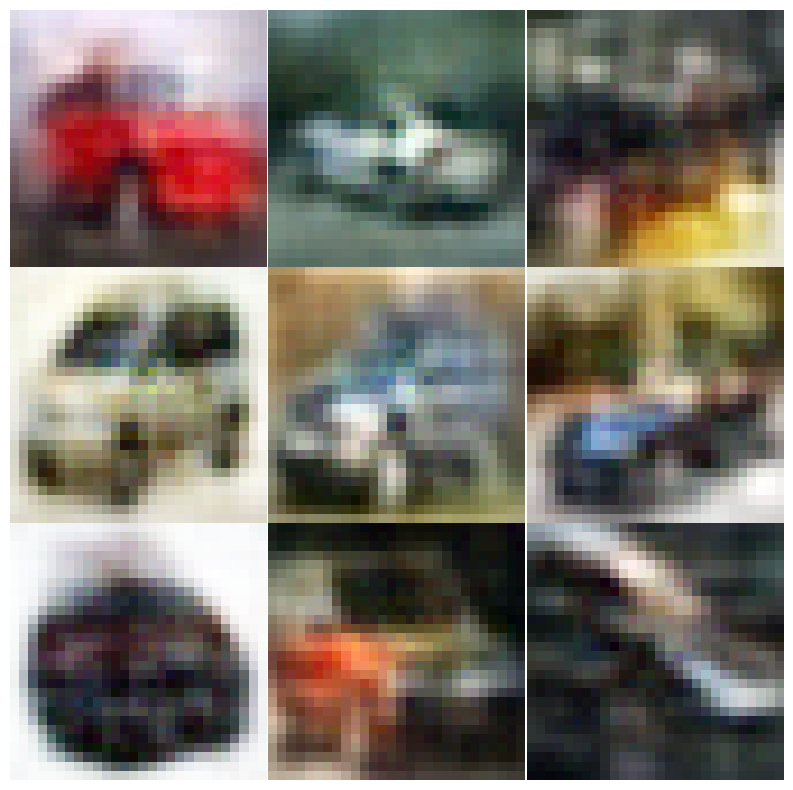

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


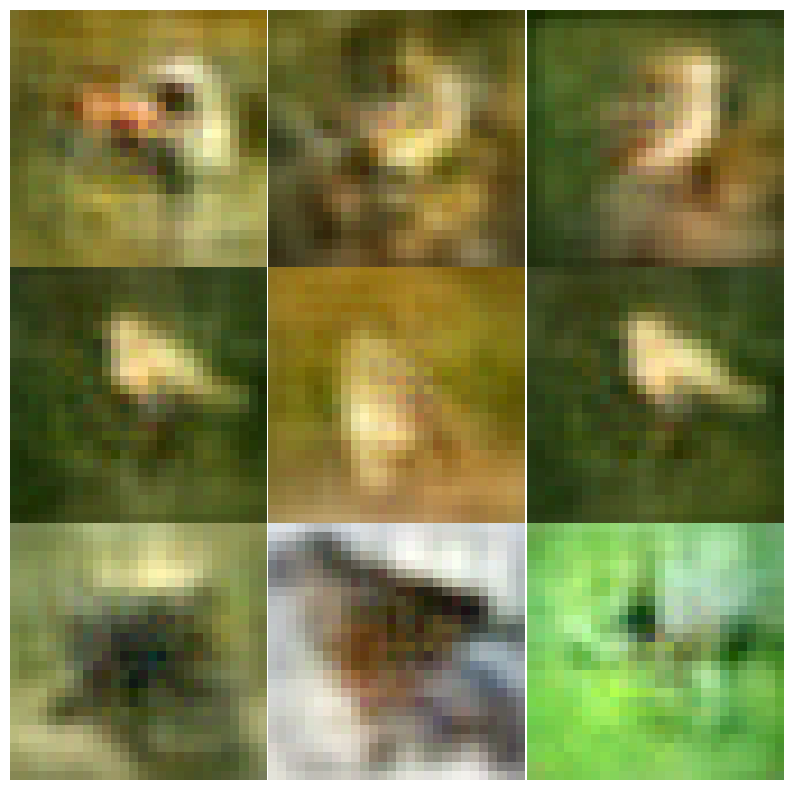

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


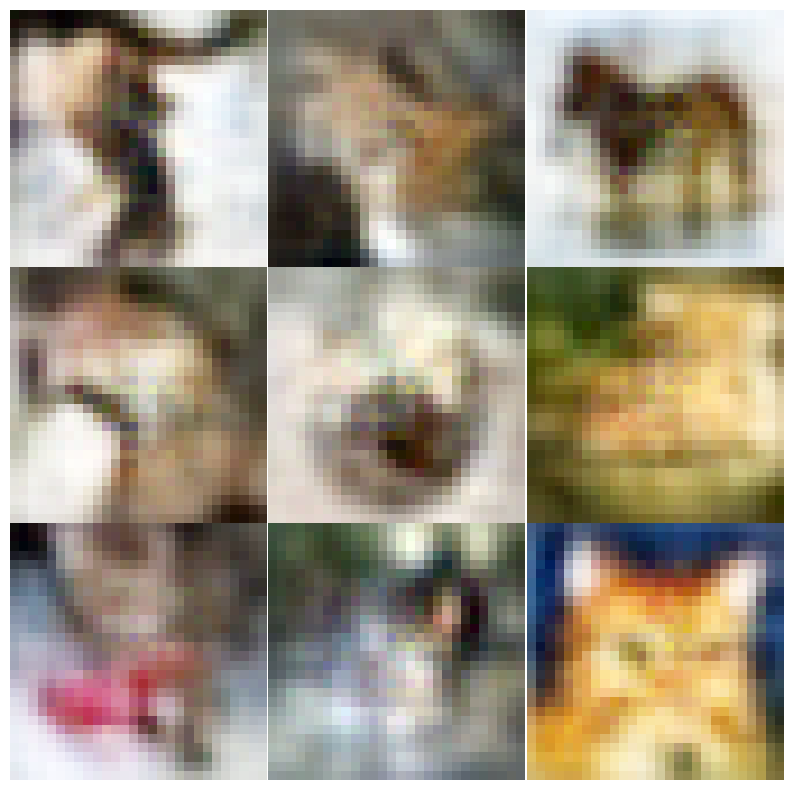

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


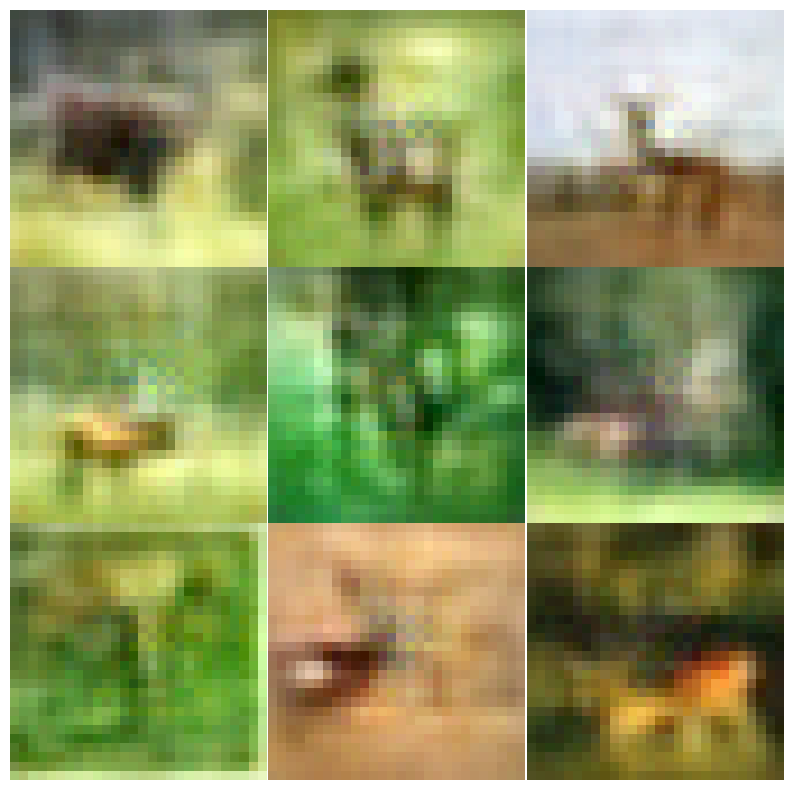

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


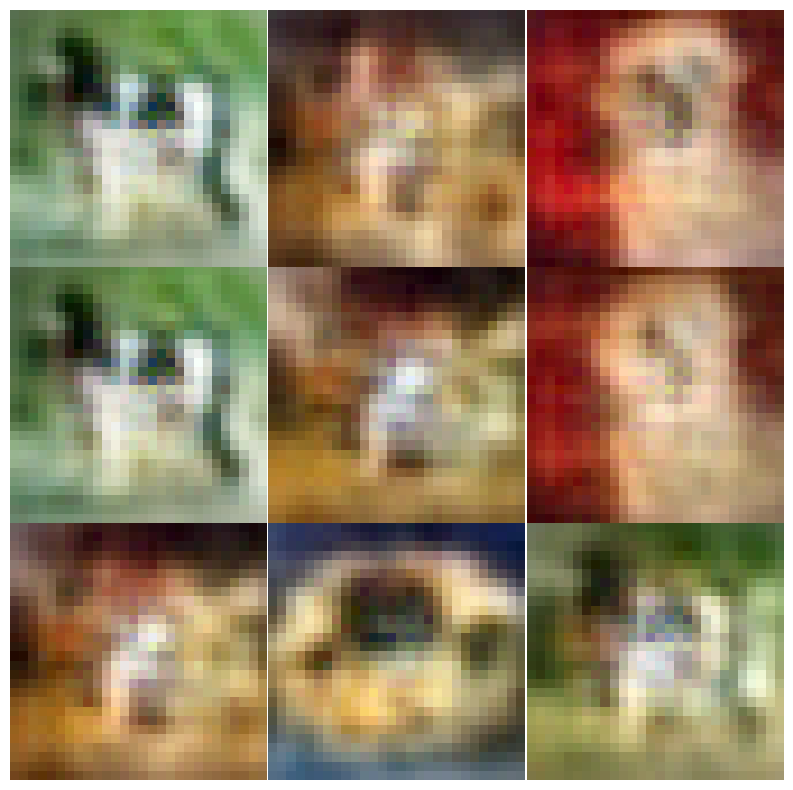

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


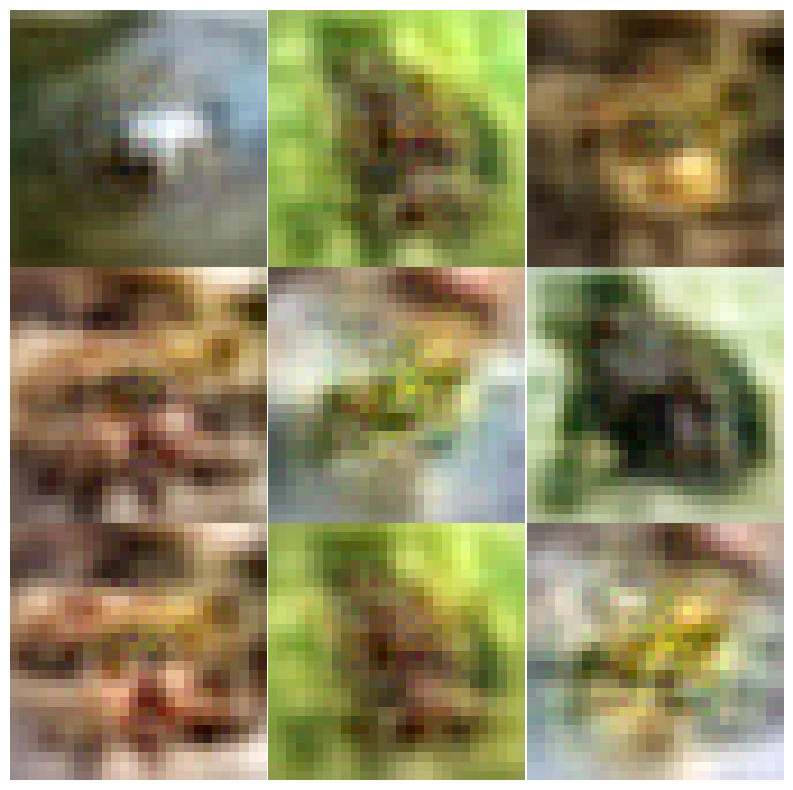

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


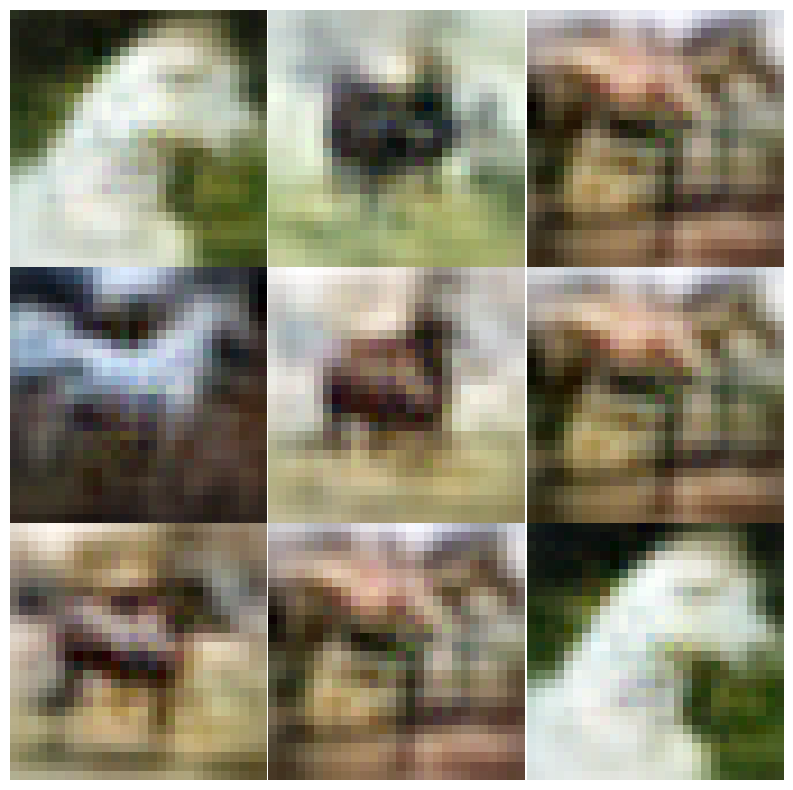

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


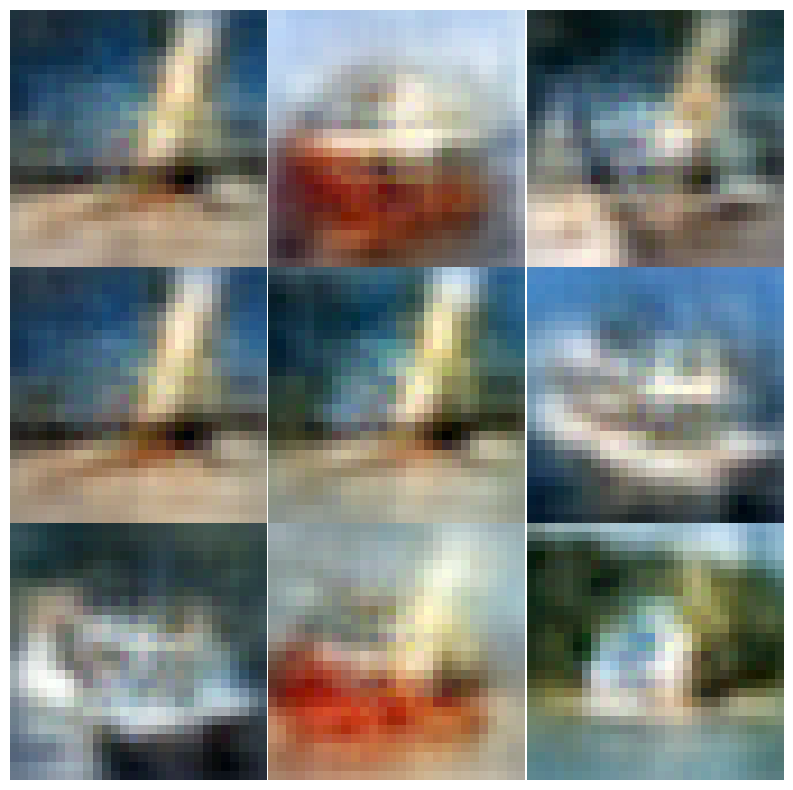

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


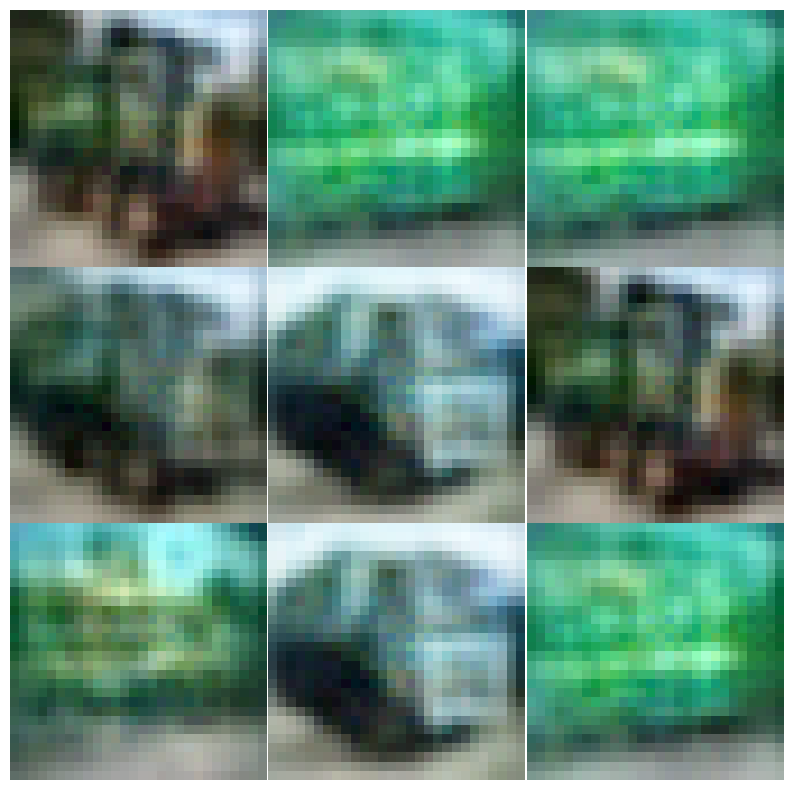

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.295337
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.289403
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.304495
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.274322
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.266654
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.229909
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.173504
Train Epoch: 1 [8000/30000 (27%)]	Loss: 2.143753
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.888945
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.813746
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.807845
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.536439
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.240746
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.270813
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.289140
Train Epoch: 1 [16000/30

Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 0: MSE: 0.1198, Contrastive: 4.2541, Combined: 2.1870


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.07it/s]


Epoch 1: MSE: 0.0373, Contrastive: 3.5980, Combined: 1.8177


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.38it/s]


Epoch 2: MSE: 0.0242, Contrastive: 3.5560, Combined: 1.7901


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.78it/s]


Epoch 3: MSE: 0.0202, Contrastive: 3.5483, Combined: 1.7843


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 4: MSE: 0.0173, Contrastive: 3.5399, Combined: 1.7786


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.77it/s]


Epoch 5: MSE: 0.0151, Contrastive: 3.5342, Combined: 1.7747


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 6: MSE: 0.0143, Contrastive: 3.5332, Combined: 1.7738


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 7: MSE: 0.0130, Contrastive: 3.5309, Combined: 1.7719


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.75it/s]


Epoch 8: MSE: 0.0120, Contrastive: 3.5287, Combined: 1.7704


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.22it/s]


Epoch 9: MSE: 0.0115, Contrastive: 3.5274, Combined: 1.7694


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 10: MSE: 0.0112, Contrastive: 3.5269, Combined: 1.7690


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.66it/s]


Epoch 11: MSE: 0.0105, Contrastive: 3.5265, Combined: 1.7685


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.59it/s]


Epoch 12: MSE: 0.0101, Contrastive: 3.5260, Combined: 1.7681


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 13: MSE: 0.0097, Contrastive: 3.5253, Combined: 1.7675


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.40it/s]


Epoch 14: MSE: 0.0092, Contrastive: 3.5247, Combined: 1.7670


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.42it/s]


Epoch 15: MSE: 0.0091, Contrastive: 3.5243, Combined: 1.7667


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.43it/s]


Epoch 16: MSE: 0.0089, Contrastive: 3.5243, Combined: 1.7666


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.82it/s]


Epoch 17: MSE: 0.0088, Contrastive: 3.5244, Combined: 1.7666


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.11it/s]


Epoch 18: MSE: 0.0086, Contrastive: 3.5238, Combined: 1.7662


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.13it/s]


Epoch 19: MSE: 0.0084, Contrastive: 3.5240, Combined: 1.7662


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.53it/s]


Epoch 20: MSE: 0.0080, Contrastive: 3.5234, Combined: 1.7657


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 21: MSE: 0.0081, Contrastive: 3.5241, Combined: 1.7661


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 22: MSE: 0.0076, Contrastive: 3.5231, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 23: MSE: 0.0075, Contrastive: 3.5225, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.78it/s]


Epoch 24: MSE: 0.0077, Contrastive: 3.5232, Combined: 1.7654


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.85it/s]


Epoch 25: MSE: 0.0072, Contrastive: 3.5229, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 26: MSE: 0.0073, Contrastive: 3.5225, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 27: MSE: 0.0070, Contrastive: 3.5227, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.68it/s]


Epoch 28: MSE: 0.0068, Contrastive: 3.5229, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.81it/s]


Epoch 29: MSE: 0.0068, Contrastive: 3.5225, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 30: MSE: 0.0065, Contrastive: 3.5221, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 31: MSE: 0.0064, Contrastive: 3.5218, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.22it/s]


Epoch 32: MSE: 0.0064, Contrastive: 3.5215, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.81it/s]


Epoch 33: MSE: 0.0063, Contrastive: 3.5213, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.82it/s]


Epoch 34: MSE: 0.0065, Contrastive: 3.5218, Combined: 1.7641


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 35: MSE: 0.0063, Contrastive: 3.5218, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 36: MSE: 0.0063, Contrastive: 3.5215, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.02it/s]


Epoch 37: MSE: 0.0061, Contrastive: 3.5215, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.86it/s]


Epoch 38: MSE: 0.0063, Contrastive: 3.5216, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.32it/s]


Epoch 39: MSE: 0.0059, Contrastive: 3.5216, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 40: MSE: 0.0059, Contrastive: 3.5212, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 41: MSE: 0.0059, Contrastive: 3.5211, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 42: MSE: 0.0058, Contrastive: 3.5210, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 43: MSE: 0.0057, Contrastive: 3.5205, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 44: MSE: 0.0056, Contrastive: 3.5205, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.87it/s]


Epoch 45: MSE: 0.0055, Contrastive: 3.5200, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 46: MSE: 0.0056, Contrastive: 3.5201, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.36it/s]


Epoch 47: MSE: 0.0056, Contrastive: 3.5205, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.74it/s]


Epoch 48: MSE: 0.0053, Contrastive: 3.5199, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.36it/s]


Epoch 49: MSE: 0.0053, Contrastive: 3.5198, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.11it/s]


Epoch 50: MSE: 0.0052, Contrastive: 3.5207, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.31it/s]


Epoch 51: MSE: 0.0054, Contrastive: 3.5200, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 52: MSE: 0.0055, Contrastive: 3.5202, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 53: MSE: 0.0053, Contrastive: 3.5210, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 54: MSE: 0.0052, Contrastive: 3.5204, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.95it/s]


Epoch 55: MSE: 0.0052, Contrastive: 3.5191, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 56: MSE: 0.0050, Contrastive: 3.5203, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 57: MSE: 0.0051, Contrastive: 3.5196, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.98it/s]


Epoch 58: MSE: 0.0050, Contrastive: 3.5199, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.80it/s]


Epoch 59: MSE: 0.0048, Contrastive: 3.5195, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.59it/s]


Epoch 60: MSE: 0.0049, Contrastive: 3.5195, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.32it/s]


Epoch 61: MSE: 0.0048, Contrastive: 3.5200, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.24it/s]


Epoch 62: MSE: 0.0048, Contrastive: 3.5196, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 63: MSE: 0.0049, Contrastive: 3.5202, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.34it/s]


Epoch 64: MSE: 0.0048, Contrastive: 3.5201, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 65: MSE: 0.0047, Contrastive: 3.5198, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 66: MSE: 0.0048, Contrastive: 3.5195, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.27it/s]


Epoch 67: MSE: 0.0049, Contrastive: 3.5204, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 68: MSE: 0.0049, Contrastive: 3.5200, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 69: MSE: 0.0047, Contrastive: 3.5202, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.59it/s]


Epoch 70: MSE: 0.0047, Contrastive: 3.5207, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.92it/s]


Epoch 71: MSE: 0.0047, Contrastive: 3.5200, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.64it/s]


Epoch 72: MSE: 0.0046, Contrastive: 3.5205, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.22it/s]


Epoch 73: MSE: 0.0048, Contrastive: 3.5200, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 74: MSE: 0.0046, Contrastive: 3.5200, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.89it/s]


Epoch 75: MSE: 0.0044, Contrastive: 3.5197, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 76: MSE: 0.0045, Contrastive: 3.5199, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.86it/s]


Epoch 77: MSE: 0.0044, Contrastive: 3.5204, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.46it/s]


Epoch 78: MSE: 0.0043, Contrastive: 3.5198, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.60it/s]


Epoch 79: MSE: 0.0044, Contrastive: 3.5203, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.02it/s]


Epoch 80: MSE: 0.0043, Contrastive: 3.5200, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.40it/s]


Epoch 81: MSE: 0.0041, Contrastive: 3.5201, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.39it/s]


Epoch 82: MSE: 0.0045, Contrastive: 3.5200, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 83: MSE: 0.0044, Contrastive: 3.5207, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.23it/s]


Epoch 84: MSE: 0.0043, Contrastive: 3.5195, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.46it/s]


Epoch 85: MSE: 0.0042, Contrastive: 3.5199, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.20it/s]


Epoch 86: MSE: 0.0043, Contrastive: 3.5202, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.29it/s]


Epoch 87: MSE: 0.0044, Contrastive: 3.5206, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.14it/s]


Epoch 88: MSE: 0.0041, Contrastive: 3.5202, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 89: MSE: 0.0043, Contrastive: 3.5207, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.37it/s]


Epoch 90: MSE: 0.0042, Contrastive: 3.5200, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.24it/s]


Epoch 91: MSE: 0.0040, Contrastive: 3.5202, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.35it/s]


Epoch 92: MSE: 0.0042, Contrastive: 3.5214, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 93: MSE: 0.0041, Contrastive: 3.5208, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.34it/s]


Epoch 94: MSE: 0.0040, Contrastive: 3.5205, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 95: MSE: 0.0040, Contrastive: 3.5203, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.45it/s]


Epoch 96: MSE: 0.0040, Contrastive: 3.5203, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.07it/s]


Epoch 97: MSE: 0.0040, Contrastive: 3.5213, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.73it/s]


Epoch 98: MSE: 0.0039, Contrastive: 3.5204, Combined: 1.7621


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 99: MSE: 0.0040, Contrastive: 3.5213, Combined: 1.7626


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.53it/s]


Epoch 100: MSE: 0.0041, Contrastive: 3.5214, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.78it/s]


Epoch 101: MSE: 0.0041, Contrastive: 3.5215, Combined: 1.7628


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.17it/s]


Epoch 102: MSE: 0.0039, Contrastive: 3.5206, Combined: 1.7623


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.98it/s]


Epoch 103: MSE: 0.0039, Contrastive: 3.5223, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 104: MSE: 0.0041, Contrastive: 3.5218, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 105: MSE: 0.0039, Contrastive: 3.5220, Combined: 1.7630


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.87it/s]


Epoch 106: MSE: 0.0039, Contrastive: 3.5225, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.91it/s]


Epoch 107: MSE: 0.0039, Contrastive: 3.5223, Combined: 1.7631


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.89it/s]


Epoch 108: MSE: 0.0041, Contrastive: 3.5230, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 109: MSE: 0.0039, Contrastive: 3.5229, Combined: 1.7634


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.03it/s]


Epoch 110: MSE: 0.0039, Contrastive: 3.5224, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.07it/s]


Epoch 111: MSE: 0.0040, Contrastive: 3.5234, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 112: MSE: 0.0039, Contrastive: 3.5235, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.87it/s]


Epoch 113: MSE: 0.0039, Contrastive: 3.5239, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 114: MSE: 0.0039, Contrastive: 3.5234, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.48it/s]


Epoch 115: MSE: 0.0039, Contrastive: 3.5232, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.33it/s]


Epoch 116: MSE: 0.0038, Contrastive: 3.5241, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 117: MSE: 0.0038, Contrastive: 3.5238, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 118: MSE: 0.0041, Contrastive: 3.5246, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.36it/s]


Epoch 119: MSE: 0.0040, Contrastive: 3.5252, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.13it/s]


Epoch 120: MSE: 0.0039, Contrastive: 3.5238, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.18it/s]


Epoch 121: MSE: 0.0040, Contrastive: 3.5250, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 122: MSE: 0.0038, Contrastive: 3.5248, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.93it/s]


Epoch 123: MSE: 0.0039, Contrastive: 3.5248, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.30it/s]


Epoch 124: MSE: 0.0038, Contrastive: 3.5240, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.33it/s]


Epoch 125: MSE: 0.0038, Contrastive: 3.5252, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.95it/s]


Epoch 126: MSE: 0.0039, Contrastive: 3.5252, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.13it/s]


Epoch 127: MSE: 0.0039, Contrastive: 3.5263, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.30it/s]


Epoch 128: MSE: 0.0039, Contrastive: 3.5262, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.96it/s]


Epoch 129: MSE: 0.0040, Contrastive: 3.5281, Combined: 1.7660


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 130: MSE: 0.0039, Contrastive: 3.5268, Combined: 1.7653


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 131: MSE: 0.0040, Contrastive: 3.5247, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.86it/s]


Epoch 132: MSE: 0.0039, Contrastive: 3.5261, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.56it/s]


Epoch 133: MSE: 0.0040, Contrastive: 3.5271, Combined: 1.7656


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 134: MSE: 0.0057, Contrastive: 3.5944, Combined: 1.8001


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.59it/s]


Epoch 135: MSE: 0.0051, Contrastive: 3.5274, Combined: 1.7663


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.74it/s]


Epoch 136: MSE: 0.0043, Contrastive: 3.5250, Combined: 1.7646


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.60it/s]


Epoch 137: MSE: 0.0040, Contrastive: 3.5245, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.60it/s]


Epoch 138: MSE: 0.0038, Contrastive: 3.5242, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.42it/s]


Epoch 139: MSE: 0.0038, Contrastive: 3.5241, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.62it/s]


Epoch 140: MSE: 0.0037, Contrastive: 3.5239, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.93it/s]


Epoch 141: MSE: 0.0036, Contrastive: 3.5240, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.06it/s]


Epoch 142: MSE: 0.0034, Contrastive: 3.5240, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 143: MSE: 0.0037, Contrastive: 3.5250, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 144: MSE: 0.0035, Contrastive: 3.5241, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 145: MSE: 0.0034, Contrastive: 3.5241, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.42it/s]


Epoch 146: MSE: 0.0034, Contrastive: 3.5240, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 147: MSE: 0.0033, Contrastive: 3.5244, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 148: MSE: 0.0033, Contrastive: 3.5241, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.95it/s]


Epoch 149: MSE: 0.0034, Contrastive: 3.5253, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.38it/s]


Epoch 150: MSE: 0.0035, Contrastive: 3.5250, Combined: 1.7642


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.16it/s]


Epoch 151: MSE: 0.0035, Contrastive: 3.5251, Combined: 1.7643


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.77it/s]


Epoch 152: MSE: 0.0035, Contrastive: 3.5252, Combined: 1.7644


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.68it/s]


Epoch 153: MSE: 0.0035, Contrastive: 3.5261, Combined: 1.7648


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 154: MSE: 0.0036, Contrastive: 3.5265, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.11it/s]


Epoch 155: MSE: 0.0036, Contrastive: 3.5270, Combined: 1.7653


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.99it/s]


Epoch 156: MSE: 0.0036, Contrastive: 3.5257, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.47it/s]


Epoch 157: MSE: 0.0038, Contrastive: 3.5262, Combined: 1.7650


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 158: MSE: 0.0036, Contrastive: 3.5267, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 159: MSE: 0.0037, Contrastive: 3.5258, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.08it/s]


Epoch 160: MSE: 0.0036, Contrastive: 3.5261, Combined: 1.7649


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.15it/s]


Epoch 161: MSE: 0.0036, Contrastive: 3.5265, Combined: 1.7651


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.77it/s]


Epoch 162: MSE: 0.0037, Contrastive: 3.5257, Combined: 1.7647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.09it/s]


Epoch 163: MSE: 0.0038, Contrastive: 3.5267, Combined: 1.7652


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 164: MSE: 0.0038, Contrastive: 3.5272, Combined: 1.7655


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.90it/s]


Epoch 165: MSE: 0.0036, Contrastive: 3.5260, Combined: 1.7648


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.98it/s]


Epoch 166: MSE: 0.0036, Contrastive: 3.5253, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.97it/s]


Epoch 167: MSE: 0.0035, Contrastive: 3.5256, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.94it/s]


Epoch 168: MSE: 0.0037, Contrastive: 3.5299, Combined: 1.7668


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.52it/s]


Epoch 169: MSE: 0.0037, Contrastive: 3.5252, Combined: 1.7645


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.34it/s]


Epoch 170: MSE: 0.0035, Contrastive: 3.5240, Combined: 1.7638


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.50it/s]


Epoch 171: MSE: 0.0035, Contrastive: 3.5245, Combined: 1.7640


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.69it/s]


Epoch 172: MSE: 0.0035, Contrastive: 3.5239, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.01it/s]


Epoch 173: MSE: 0.0035, Contrastive: 3.5239, Combined: 1.7637


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.10it/s]


Epoch 174: MSE: 0.0034, Contrastive: 3.5238, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.43it/s]


Epoch 175: MSE: 0.0034, Contrastive: 3.5235, Combined: 1.7635


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.75it/s]


Epoch 176: MSE: 0.0035, Contrastive: 3.5238, Combined: 1.7636


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.35it/s]


Epoch 177: MSE: 0.0036, Contrastive: 3.5242, Combined: 1.7639


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.28it/s]


Epoch 178: MSE: 0.0036, Contrastive: 3.5229, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.64it/s]


Epoch 179: MSE: 0.0037, Contrastive: 3.5227, Combined: 1.7632


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.56it/s]


Epoch 180: MSE: 0.0034, Contrastive: 3.5225, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.85it/s]


Epoch 181: MSE: 0.0034, Contrastive: 3.5225, Combined: 1.7629


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.00it/s]


Epoch 182: MSE: 0.0035, Contrastive: 3.5220, Combined: 1.7627


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.17it/s]


Epoch 183: MSE: 0.0034, Contrastive: 3.5215, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.89it/s]


Epoch 184: MSE: 0.0034, Contrastive: 3.5214, Combined: 1.7624


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.45it/s]


Epoch 185: MSE: 0.0032, Contrastive: 3.5211, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.55it/s]


Epoch 186: MSE: 0.0032, Contrastive: 3.5211, Combined: 1.7622


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.92it/s]


Epoch 187: MSE: 0.0033, Contrastive: 3.5217, Combined: 1.7625


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.84it/s]


Epoch 188: MSE: 0.0033, Contrastive: 3.5198, Combined: 1.7615


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 189: MSE: 0.0032, Contrastive: 3.5205, Combined: 1.7619


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.21it/s]


Epoch 190: MSE: 0.0032, Contrastive: 3.5195, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.12it/s]


Epoch 191: MSE: 0.0032, Contrastive: 3.5198, Combined: 1.7615


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.25it/s]


Epoch 192: MSE: 0.0033, Contrastive: 3.5195, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.04it/s]


Epoch 193: MSE: 0.0031, Contrastive: 3.5195, Combined: 1.7613


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.94it/s]


Epoch 194: MSE: 0.0031, Contrastive: 3.5189, Combined: 1.7610


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.88it/s]


Epoch 195: MSE: 0.0031, Contrastive: 3.5197, Combined: 1.7614


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.93it/s]


Epoch 196: MSE: 0.0031, Contrastive: 3.5188, Combined: 1.7609


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.83it/s]


Epoch 197: MSE: 0.0031, Contrastive: 3.5183, Combined: 1.7607


Loading...: 100%|██████████| 73/73 [00:01<00:00, 39.05it/s]


Epoch 198: MSE: 0.0031, Contrastive: 3.5181, Combined: 1.7606


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 199: MSE: 0.0031, Contrastive: 3.5184, Combined: 1.7608
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.26
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


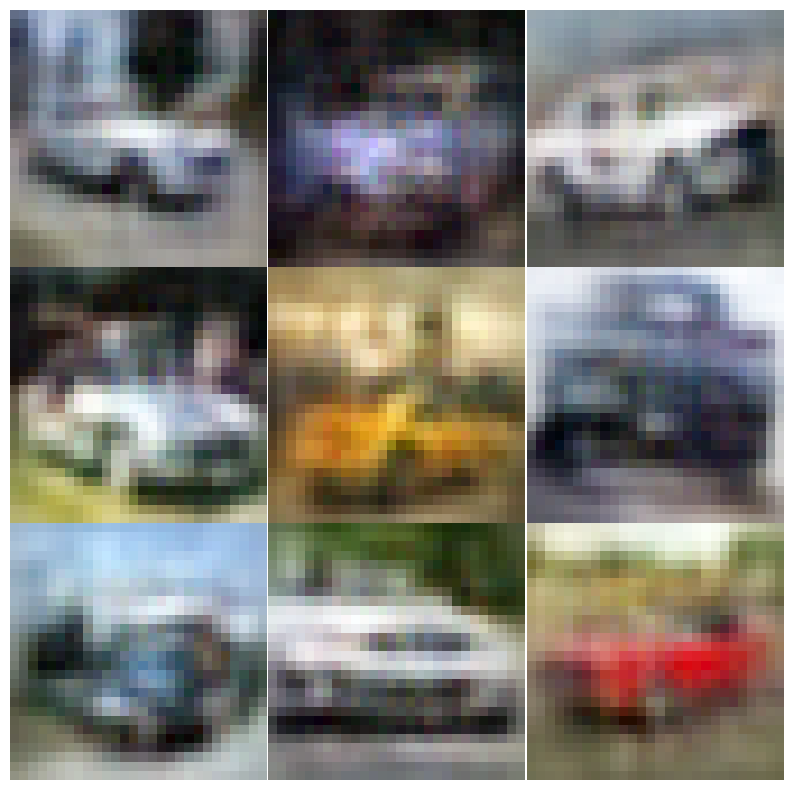

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


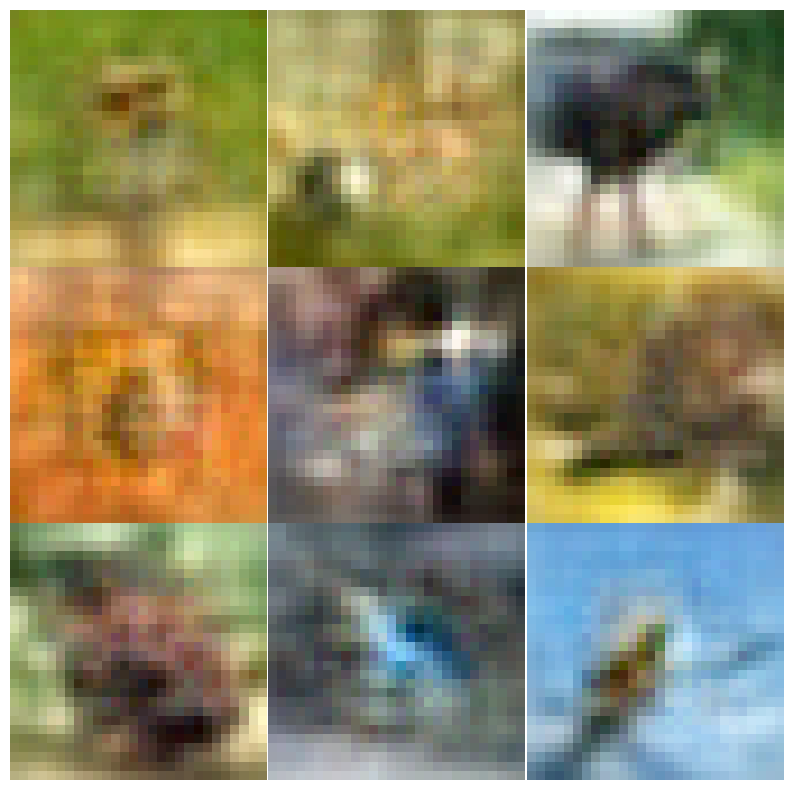

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


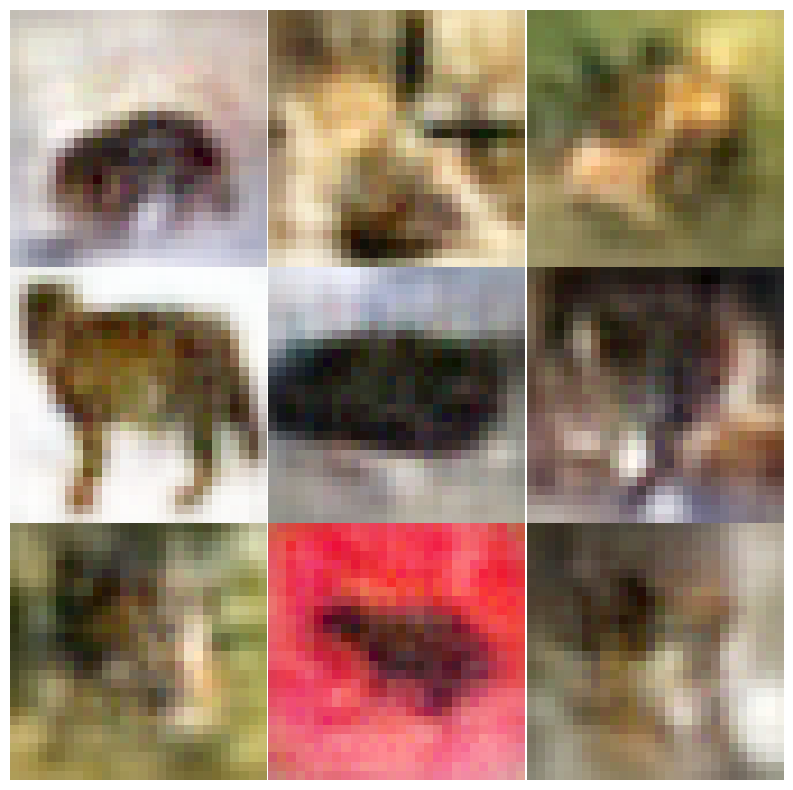

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


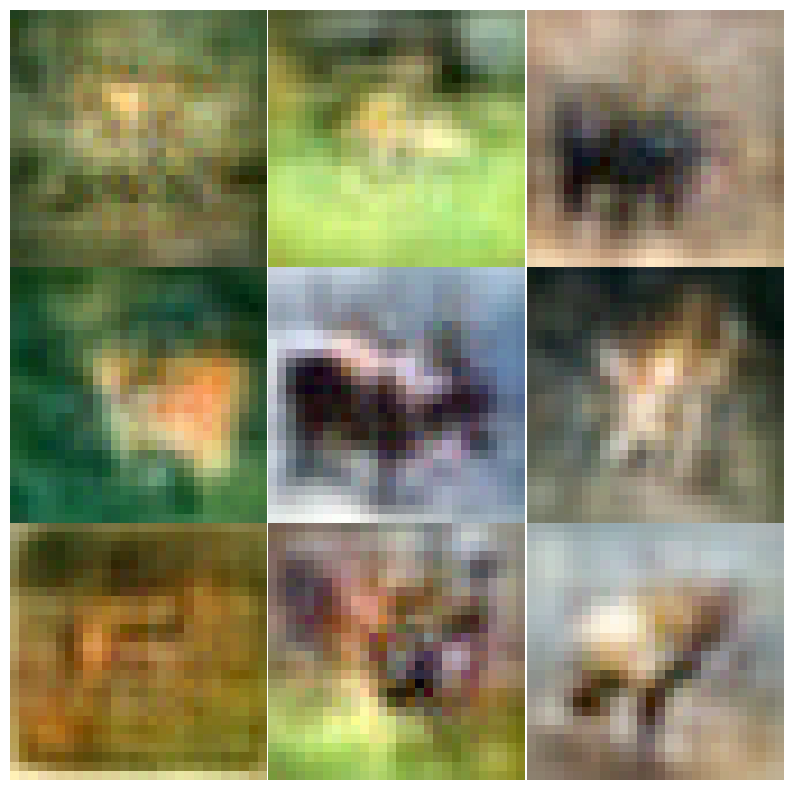

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


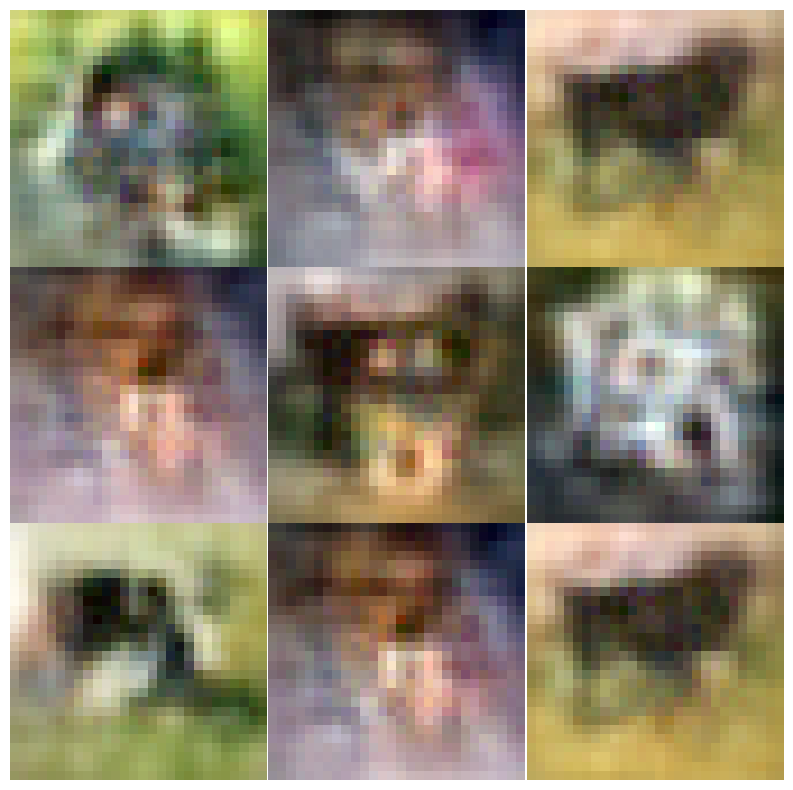

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


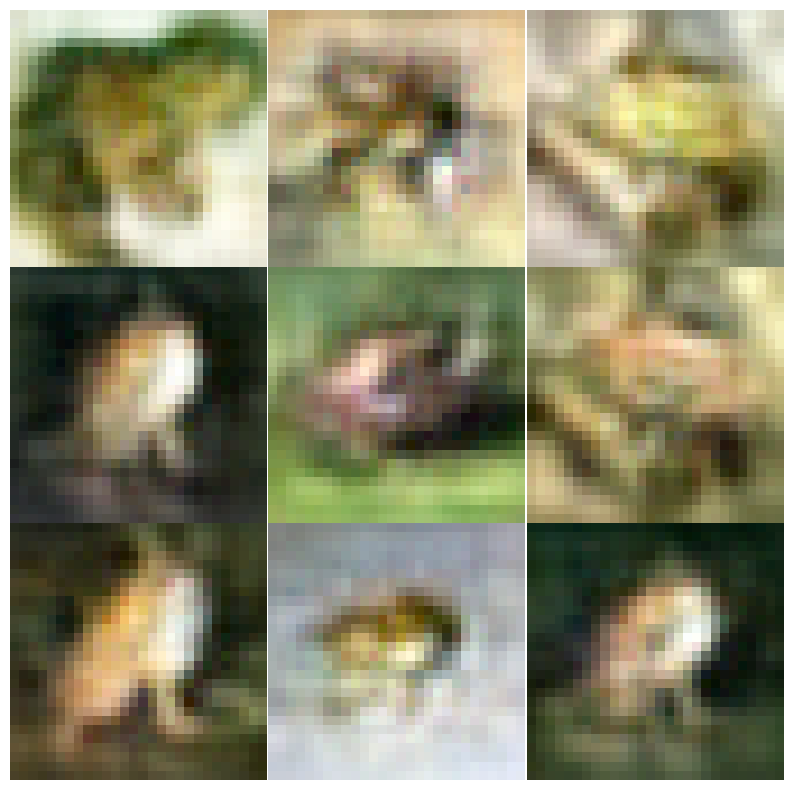

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


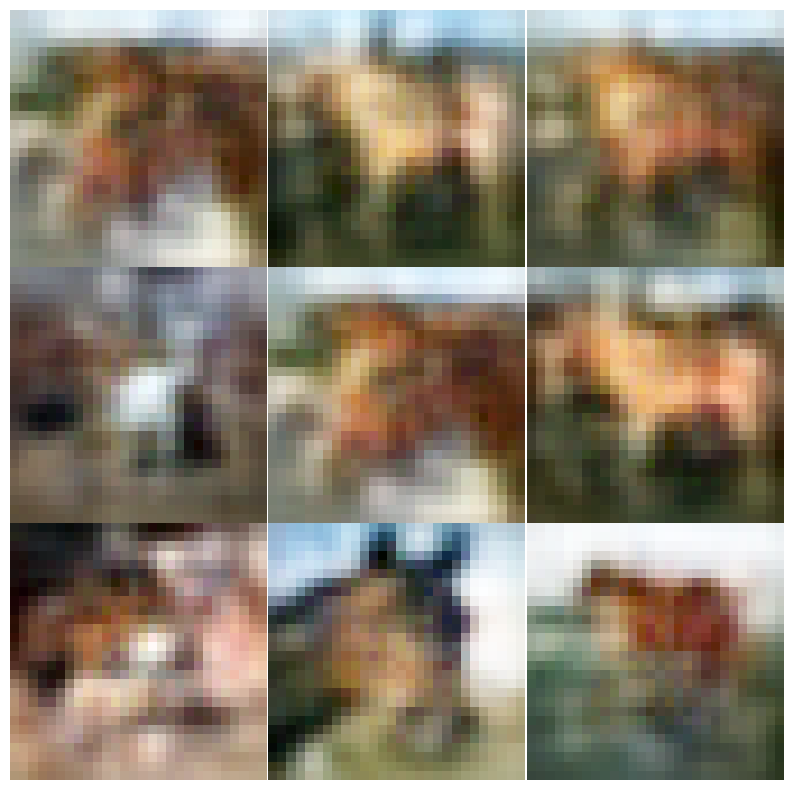

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


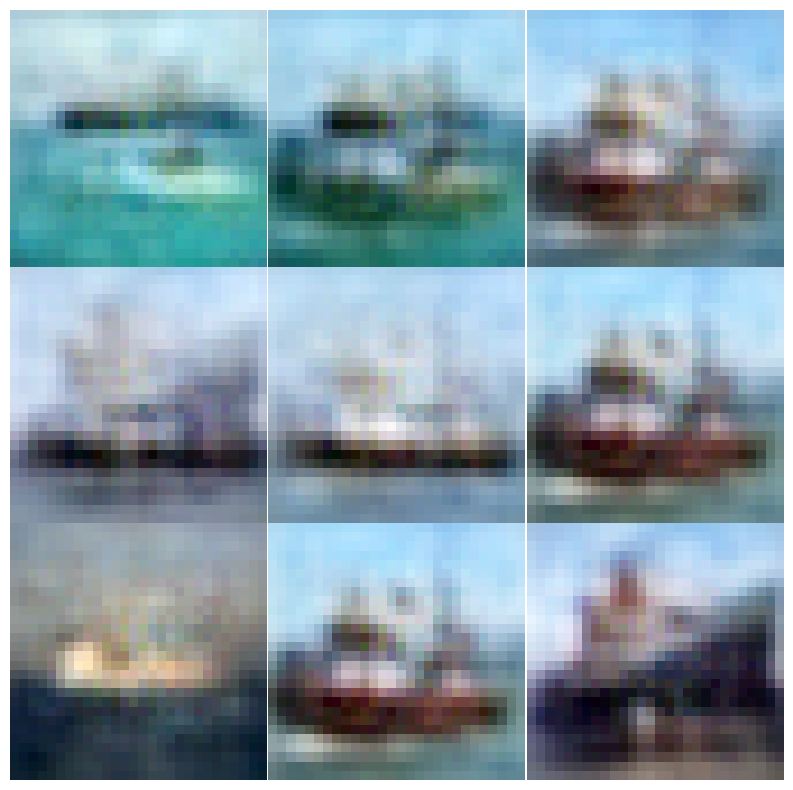

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


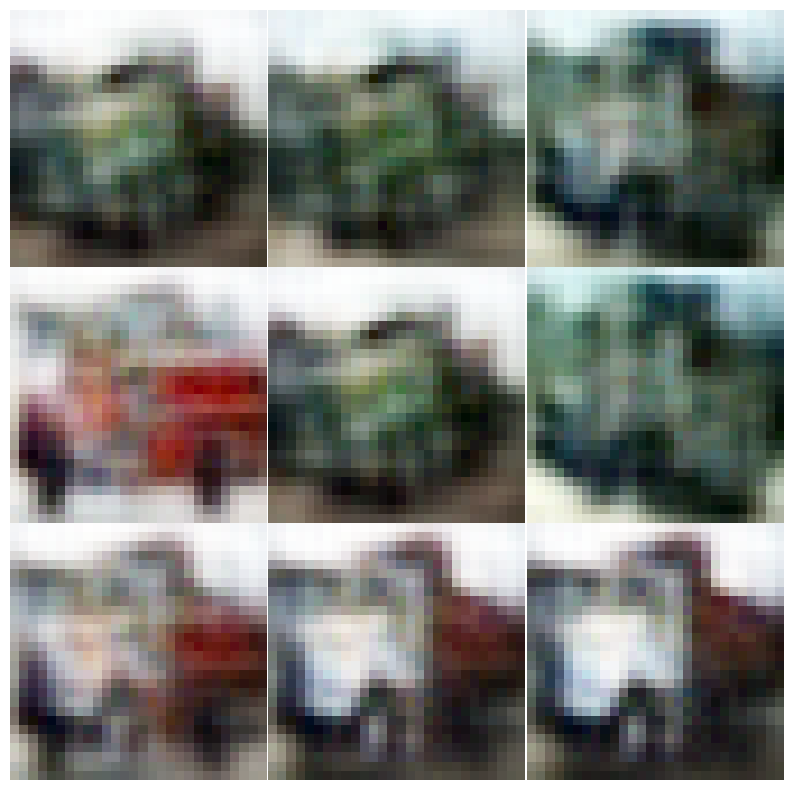

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.09
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.298474
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.287187
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.239763
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.185846
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.098977
Train Epoch: 1 [6000/30000 (20%)]	Loss: 1.923553
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.683285
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.621614
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.454144
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.502894
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.309927
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.467662
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.274549
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.276271
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.147844
Train Epoch: 1 [16000/30

In [13]:
args['epochs'] = 200 # how many epochs to run for (original used 200)

trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

# initial hyperparams
alpha_start = 0.95   # mostly MSE early
alpha_end   = 0.5    # balance later
tau_start   = 0.25   # soft early
tau_end     = 0.15   # sharper later
num_epochs  = 300    # example

def get_schedules(epoch):
    # linear scheduling
    alpha = alpha_start - (alpha_start - alpha_end) * (epoch / num_epochs)
    tau   = tau_start  - (tau_start  - tau_end)   * (epoch / num_epochs)
    return alpha, tau

temperature = 0.1      # SupCon temperature
alpha = 0.5

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)
    

    #criterion2 = NTXentLoss(temperature=0.5).to(device)
    criterion2 = SupConLoss().to(device)
    
    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0

            encoder.train()
            decoder.train()
            
            epoch_mse = 0.0
            epoch_contrast = 0.0
            #alpha = 1 - min(0.5, epoch / 200)             # weight for MSE vs contrastive loss (1-alpha)
            #alpha, tau = get_schedules(epoch)  # get schedules for alpha and tau
            #print(f"Alpha={alpha:.4f}, tau={tau:.4f}")
            
            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                images, labs = images.to(device), labs.to(device)
                labsn = labs.detach().cpu().numpy()

                # run images
                z_hat,class_hat = encoder(images,labsn)
                
                # sort z_hat and class_hat by labels
                sort_z_hat = [[] for _ in range(args['num_class'])]
                for i, label in enumerate(labsn):
                    sort_z_hat[label].append(z_hat[i].cpu().detach().numpy())

                # Check if sort_z_hat is empty
                z_hat_to_concat = []
                for tensor in sort_z_hat:
                    if len(tensor) != 0:
                        z_hat_to_concat.append(torch.tensor(tensor).to(device))
                        
                if z_hat_to_concat:
                    combined_z_hat = torch.cat(z_hat_to_concat, dim=0)
                    #print('combined_z_hat',combined_z_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_z_hat = torch.zeros((1, args['n_z'])).to(device)

                # Check if class_hat is empty
                class_hat_to_concat = []
                for tensor in class_hat:
                    if len(tensor) != 0:
                        class_hat_to_concat.append(tensor)
                if class_hat_to_concat:
                    combined_class_hat = torch.cat(class_hat_to_concat, dim=0)
                    #print('combined_class_hat',combined_class_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_class_hat = torch.zeros((1, args['n_z'])).to(device)

                # Combine the views using torch.stack()
                # `dim=1` places the new "views" dimension at the second position.
                
                # *Option* L2 normalization
                combined_z_hat = F.normalize(combined_z_hat, dim=1)
                combined_class_hat = F.normalize(combined_class_hat, dim=1)
                
                features = torch.stack([combined_z_hat, combined_class_hat], dim=1)
                # The new shape of the 'features' tensor is [100, 2, 300]
                #print(features.shape)
                
                mse2 = criterion2(features=features, labels=torch.from_numpy(labsn).long(), temperature=temperature)
                
                
                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                # --- MSE loss ---
                mse = criterion(x_hat, images)
     
                # --- Combined loss ---
                comb_loss = alpha * mse + (1 - alpha) * mse2
                comb_loss.backward()
                
                # --- Step optimizers ---
                enc_optim.step()
                dec_optim.step()
                
                # accumulate for logging
                epoch_mse += mse.item() * images.size(0)
                epoch_contrast += mse2.item() * images.size(0)         

            # --- Log epoch losses ---
            avg_mse = epoch_mse / len(train_loader.dataset)
            avg_contrast = epoch_contrast / len(train_loader.dataset)
            avg_comb = avg_mse * alpha + avg_contrast * (1-alpha)
            print(f"Epoch {epoch}: MSE: {avg_mse:.4f}, Contrastive: {avg_contrast:.4f}, Combined: {avg_comb:.4f}")
            trainingDataset_loss.append(train_loss)
            
        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    import numpy as np
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    print('------ Plot Latent Space ------')
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    print('------------------------------')
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    import time
    import os
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) 
            print('class',yclass[0]) 
    
            #encode xclass to feature space
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) 

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    from sklearn.manifold import TSNE
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    # Load the training images and labels
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    print('------ Plot Balanced Imgs ------')

    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(dec_x)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    fig.show()
    
    print('------------------------------')
    #  IMPORT BALANCED IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    ###########################  TRAIN CNN  ####################################################
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    #set hyperparameters
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    ########################### TEST CNN ####################################################
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))

### Avg via folders

In [14]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

Average Accuracy: 0.86236
Average Sensitivity: 0.31179999999999997
Average Specificity: 0.9235333333333333
Average Precision: 0.4125690902316638

G-mean: 0.5366003871676498
F-measure: 0.3551592840291581

ACSA: 0.58708
[array([[817,  62,  46,  47,  25,   1,   0,   1,   1,   0],
       [177, 746,  15,  50,  11,   0,   1,   0,   0,   0],
       [208,  24, 419, 211, 123,   6,   4,   3,   2,   0],
       [114,  39, 121, 665,  51,   6,   0,   2,   2,   0],
       [168,  21, 191, 242, 369,   4,   2,   1,   2,   0],
       [ 94,  40, 152, 626,  54,  28,   3,   1,   2,   0],
       [ 56,  29, 141, 605, 143,   6,  18,   2,   0,   0],
       [304,  36, 148, 294, 187,  24,   1,   4,   2,   0],
       [636, 226,  25,  89,  12,   1,   2,   1,   8,   0],
       [308, 485,  30, 139,  23,   2,   0,   4,   4,   5]]), array([[729, 117,  61,  50,  42,   0,   1,   0,   0,   0],
       [ 84, 849,  16,  37,  10,   0,   0,   1,   1,   2],
       [125,  60, 482, 187, 134,   4,   5,   1,   0,   2],
       [ 66,

## Traning - Gen - Evalution (SelfSubCon)


Start...
cuda


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.72it/s]


Epoch 0: MSE: 0.1250, Contrastive: 0.9913, Combined: 0.5582


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.55it/s]


Epoch 1: MSE: 0.0373, Contrastive: 0.4425, Combined: 0.2399


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 2: MSE: 0.0254, Contrastive: 0.3040, Combined: 0.1647


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 3: MSE: 0.0212, Contrastive: 0.2296, Combined: 0.1254


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 4: MSE: 0.0185, Contrastive: 0.1690, Combined: 0.0938


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 5: MSE: 0.0165, Contrastive: 0.1246, Combined: 0.0705


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.79it/s]


Epoch 6: MSE: 0.0151, Contrastive: 0.0912, Combined: 0.0532


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 7: MSE: 0.0139, Contrastive: 0.0758, Combined: 0.0449


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.37it/s]


Epoch 8: MSE: 0.0130, Contrastive: 0.0630, Combined: 0.0380


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.45it/s]


Epoch 9: MSE: 0.0125, Contrastive: 0.0559, Combined: 0.0342


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 10: MSE: 0.0114, Contrastive: 0.0485, Combined: 0.0299


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 11: MSE: 0.0111, Contrastive: 0.0449, Combined: 0.0280


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 12: MSE: 0.0103, Contrastive: 0.0406, Combined: 0.0254


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 13: MSE: 0.0101, Contrastive: 0.0385, Combined: 0.0243


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 14: MSE: 0.0097, Contrastive: 0.0351, Combined: 0.0224


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 15: MSE: 0.0093, Contrastive: 0.0325, Combined: 0.0209


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.91it/s]


Epoch 16: MSE: 0.0090, Contrastive: 0.0309, Combined: 0.0199


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 17: MSE: 0.0087, Contrastive: 0.0296, Combined: 0.0191


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 18: MSE: 0.0083, Contrastive: 0.0287, Combined: 0.0185


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 19: MSE: 0.0081, Contrastive: 0.0273, Combined: 0.0177


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 20: MSE: 0.0079, Contrastive: 0.0263, Combined: 0.0171


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.79it/s]


Epoch 21: MSE: 0.0076, Contrastive: 0.0254, Combined: 0.0165


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 22: MSE: 0.0077, Contrastive: 0.0239, Combined: 0.0158


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 23: MSE: 0.0074, Contrastive: 0.0236, Combined: 0.0155


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.47it/s]


Epoch 24: MSE: 0.0071, Contrastive: 0.0225, Combined: 0.0148


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 25: MSE: 0.0070, Contrastive: 0.0216, Combined: 0.0143


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 26: MSE: 0.0069, Contrastive: 0.0221, Combined: 0.0145


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 27: MSE: 0.0068, Contrastive: 0.0211, Combined: 0.0140


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.14it/s]


Epoch 28: MSE: 0.0066, Contrastive: 0.0205, Combined: 0.0136


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.11it/s]


Epoch 29: MSE: 0.0065, Contrastive: 0.0199, Combined: 0.0132


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 30: MSE: 0.0063, Contrastive: 0.0194, Combined: 0.0128


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 31: MSE: 0.0061, Contrastive: 0.0189, Combined: 0.0125


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 32: MSE: 0.0060, Contrastive: 0.0188, Combined: 0.0124


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 33: MSE: 0.0060, Contrastive: 0.0182, Combined: 0.0121


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.79it/s]


Epoch 34: MSE: 0.0056, Contrastive: 0.0181, Combined: 0.0119


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 35: MSE: 0.0059, Contrastive: 0.0176, Combined: 0.0117


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 36: MSE: 0.0055, Contrastive: 0.0176, Combined: 0.0116


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.23it/s]


Epoch 37: MSE: 0.0054, Contrastive: 0.0170, Combined: 0.0112


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 38: MSE: 0.0055, Contrastive: 0.0170, Combined: 0.0113


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.40it/s]


Epoch 39: MSE: 0.0054, Contrastive: 0.0172, Combined: 0.0113


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.53it/s]


Epoch 40: MSE: 0.0054, Contrastive: 0.0162, Combined: 0.0108


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.97it/s]


Epoch 41: MSE: 0.0054, Contrastive: 0.0160, Combined: 0.0107


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.98it/s]


Epoch 42: MSE: 0.0052, Contrastive: 0.0163, Combined: 0.0107


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 43: MSE: 0.0050, Contrastive: 0.0159, Combined: 0.0104


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.55it/s]


Epoch 44: MSE: 0.0051, Contrastive: 0.0157, Combined: 0.0104


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.14it/s]


Epoch 45: MSE: 0.0049, Contrastive: 0.0156, Combined: 0.0102


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.38it/s]


Epoch 46: MSE: 0.0047, Contrastive: 0.0152, Combined: 0.0100


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.87it/s]


Epoch 47: MSE: 0.0048, Contrastive: 0.0150, Combined: 0.0099


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.41it/s]


Epoch 48: MSE: 0.0049, Contrastive: 0.0150, Combined: 0.0099


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.21it/s]


Epoch 49: MSE: 0.0048, Contrastive: 0.0149, Combined: 0.0098


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.67it/s]


Epoch 50: MSE: 0.0044, Contrastive: 0.0149, Combined: 0.0096


Loading...: 100%|██████████| 73/73 [00:02<00:00, 33.96it/s]


Epoch 51: MSE: 0.0044, Contrastive: 0.0149, Combined: 0.0096


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.42it/s]


Epoch 52: MSE: 0.0043, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.31it/s]


Epoch 53: MSE: 0.0044, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 54: MSE: 0.0043, Contrastive: 0.0143, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 55: MSE: 0.0043, Contrastive: 0.0144, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 56: MSE: 0.0043, Contrastive: 0.0142, Combined: 0.0092


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 57: MSE: 0.0042, Contrastive: 0.0146, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.65it/s]


Epoch 58: MSE: 0.0040, Contrastive: 0.0141, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 59: MSE: 0.0041, Contrastive: 0.0139, Combined: 0.0090


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 60: MSE: 0.0040, Contrastive: 0.0141, Combined: 0.0090


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.15it/s]


Epoch 61: MSE: 0.0040, Contrastive: 0.0141, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.07it/s]


Epoch 62: MSE: 0.0040, Contrastive: 0.0136, Combined: 0.0088


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 63: MSE: 0.0039, Contrastive: 0.0138, Combined: 0.0088


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 64: MSE: 0.0039, Contrastive: 0.0134, Combined: 0.0086


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.30it/s]


Epoch 65: MSE: 0.0038, Contrastive: 0.0137, Combined: 0.0087


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 66: MSE: 0.0037, Contrastive: 0.0135, Combined: 0.0086


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.35it/s]


Epoch 67: MSE: 0.0037, Contrastive: 0.0134, Combined: 0.0086


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 68: MSE: 0.0036, Contrastive: 0.0131, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.02it/s]


Epoch 69: MSE: 0.0037, Contrastive: 0.0135, Combined: 0.0086


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.62it/s]


Epoch 70: MSE: 0.0038, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 71: MSE: 0.0036, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.94it/s]


Epoch 72: MSE: 0.0038, Contrastive: 0.0130, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 73: MSE: 0.0036, Contrastive: 0.0131, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 74: MSE: 0.0037, Contrastive: 0.0130, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 75: MSE: 0.0034, Contrastive: 0.0129, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 76: MSE: 0.0034, Contrastive: 0.0130, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 77: MSE: 0.0034, Contrastive: 0.0127, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.19it/s]


Epoch 78: MSE: 0.0034, Contrastive: 0.0128, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.05it/s]


Epoch 79: MSE: 0.0036, Contrastive: 0.0129, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.29it/s]


Epoch 80: MSE: 0.0033, Contrastive: 0.0126, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 81: MSE: 0.0034, Contrastive: 0.0127, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.25it/s]


Epoch 82: MSE: 0.0033, Contrastive: 0.0127, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.15it/s]


Epoch 83: MSE: 0.0031, Contrastive: 0.0125, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.66it/s]


Epoch 84: MSE: 0.0034, Contrastive: 0.0126, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 85: MSE: 0.0032, Contrastive: 0.0123, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.16it/s]


Epoch 86: MSE: 0.0032, Contrastive: 0.0126, Combined: 0.0079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.41it/s]


Epoch 87: MSE: 0.0030, Contrastive: 0.0122, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.04it/s]


Epoch 88: MSE: 0.0031, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 89: MSE: 0.0032, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.88it/s]


Epoch 90: MSE: 0.0033, Contrastive: 0.0127, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 91: MSE: 0.0031, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 92: MSE: 0.0030, Contrastive: 0.0121, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.56it/s]


Epoch 93: MSE: 0.0030, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.63it/s]


Epoch 94: MSE: 0.0030, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.21it/s]


Epoch 95: MSE: 0.0029, Contrastive: 0.0121, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.21it/s]


Epoch 96: MSE: 0.0031, Contrastive: 0.0120, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.40it/s]


Epoch 97: MSE: 0.0031, Contrastive: 0.0121, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 98: MSE: 0.0031, Contrastive: 0.0119, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 99: MSE: 0.0029, Contrastive: 0.0118, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.46it/s]


Epoch 100: MSE: 0.0029, Contrastive: 0.0119, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.15it/s]


Epoch 101: MSE: 0.0028, Contrastive: 0.0120, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 102: MSE: 0.0028, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.57it/s]


Epoch 103: MSE: 0.0028, Contrastive: 0.0121, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.04it/s]


Epoch 104: MSE: 0.0027, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.12it/s]


Epoch 105: MSE: 0.0027, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.35it/s]


Epoch 106: MSE: 0.0027, Contrastive: 0.0121, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.29it/s]


Epoch 107: MSE: 0.0027, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.40it/s]


Epoch 108: MSE: 0.0027, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.52it/s]


Epoch 109: MSE: 0.0026, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.31it/s]


Epoch 110: MSE: 0.0028, Contrastive: 0.0118, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.15it/s]


Epoch 111: MSE: 0.0027, Contrastive: 0.0116, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 112: MSE: 0.0027, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 113: MSE: 0.0026, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.13it/s]


Epoch 114: MSE: 0.0026, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 115: MSE: 0.0026, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:02<00:00, 34.60it/s]


Epoch 116: MSE: 0.0026, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 117: MSE: 0.0025, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 118: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 119: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.60it/s]


Epoch 120: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.89it/s]


Epoch 121: MSE: 0.0025, Contrastive: 0.0114, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.12it/s]


Epoch 122: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.88it/s]


Epoch 123: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 124: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 125: MSE: 0.0026, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.91it/s]


Epoch 126: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.62it/s]


Epoch 127: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.26it/s]


Epoch 128: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.43it/s]


Epoch 129: MSE: 0.0025, Contrastive: 0.0113, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 130: MSE: 0.0024, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 131: MSE: 0.0024, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.73it/s]


Epoch 132: MSE: 0.0023, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.90it/s]


Epoch 133: MSE: 0.0023, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 134: MSE: 0.0023, Contrastive: 0.0114, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 135: MSE: 0.0024, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.33it/s]


Epoch 136: MSE: 0.0022, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.43it/s]


Epoch 137: MSE: 0.0023, Contrastive: 0.0114, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 138: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.63it/s]


Epoch 139: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.26it/s]


Epoch 140: MSE: 0.0022, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.03it/s]


Epoch 141: MSE: 0.0023, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 142: MSE: 0.0022, Contrastive: 0.0115, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.51it/s]


Epoch 143: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.86it/s]


Epoch 144: MSE: 0.0021, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 145: MSE: 0.0022, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.04it/s]


Epoch 146: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 147: MSE: 0.0022, Contrastive: 0.0115, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 148: MSE: 0.0023, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.10it/s]


Epoch 149: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.11it/s]


Epoch 150: MSE: 0.0022, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 151: MSE: 0.0022, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.25it/s]


Epoch 152: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 153: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.37it/s]


Epoch 154: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.20it/s]


Epoch 155: MSE: 0.0020, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 156: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.18it/s]


Epoch 157: MSE: 0.0021, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.00it/s]


Epoch 158: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.93it/s]


Epoch 159: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 160: MSE: 0.0020, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.61it/s]


Epoch 161: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.85it/s]


Epoch 162: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.42it/s]


Epoch 163: MSE: 0.0021, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.27it/s]


Epoch 164: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 165: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 166: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.36it/s]


Epoch 167: MSE: 0.0021, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.28it/s]


Epoch 168: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 169: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 170: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 171: MSE: 0.0020, Contrastive: 0.0113, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 172: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.45it/s]


Epoch 173: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.08it/s]


Epoch 174: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.05it/s]


Epoch 175: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.09it/s]


Epoch 176: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.87it/s]


Epoch 177: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.29it/s]


Epoch 178: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.06it/s]


Epoch 179: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.90it/s]


Epoch 180: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 181: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 182: MSE: 0.0019, Contrastive: 0.0112, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 183: MSE: 0.0018, Contrastive: 0.0112, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.14it/s]


Epoch 184: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.06it/s]


Epoch 185: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 186: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 187: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.88it/s]


Epoch 188: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 189: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.22it/s]


Epoch 190: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.09it/s]


Epoch 191: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 192: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 193: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.36it/s]


Epoch 194: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.26it/s]


Epoch 195: MSE: 0.0017, Contrastive: 0.0107, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.16it/s]


Epoch 196: MSE: 0.0017, Contrastive: 0.0107, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.28it/s]


Epoch 197: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 198: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.91it/s]


Epoch 199: MSE: 0.0017, Contrastive: 0.0106, Combined: 0.0062
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.52
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


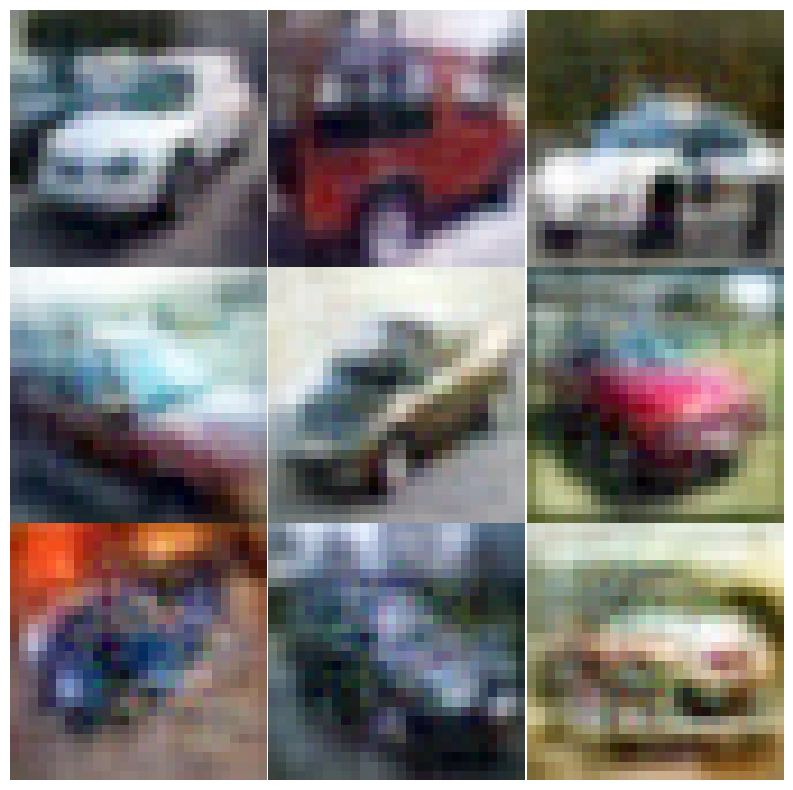

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


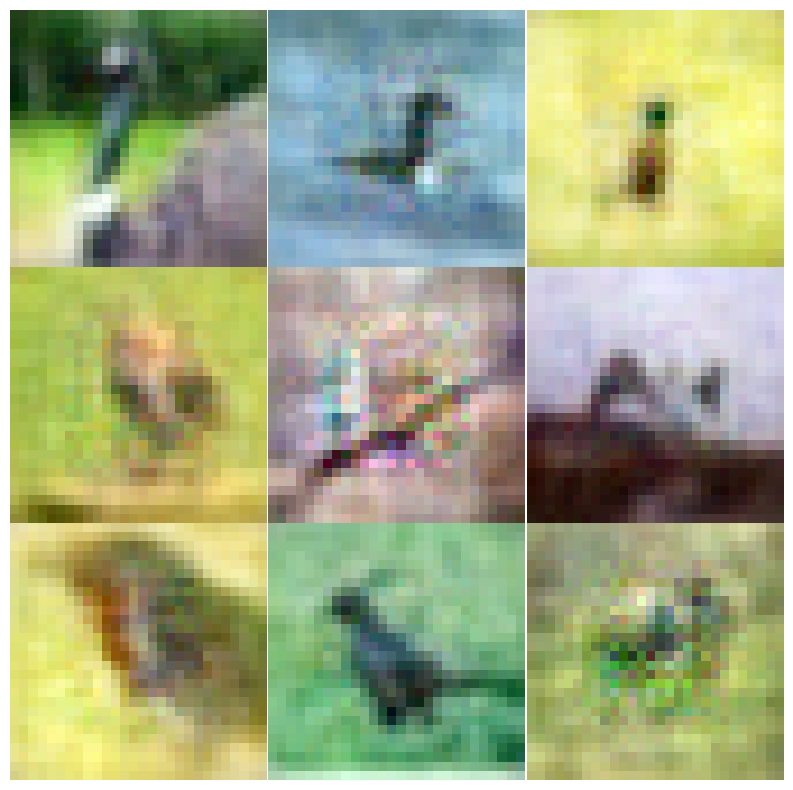

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


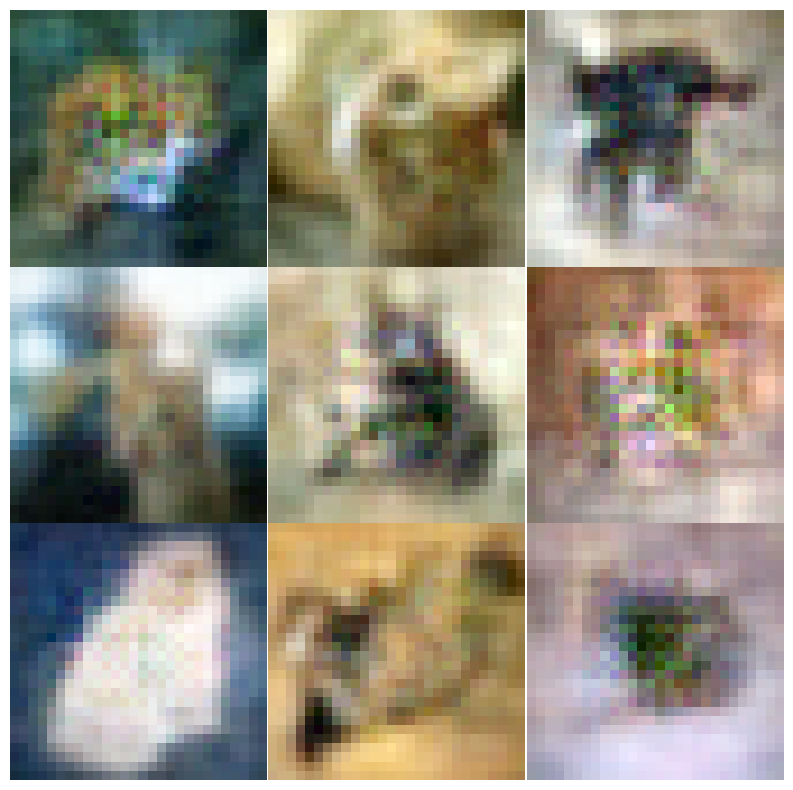

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


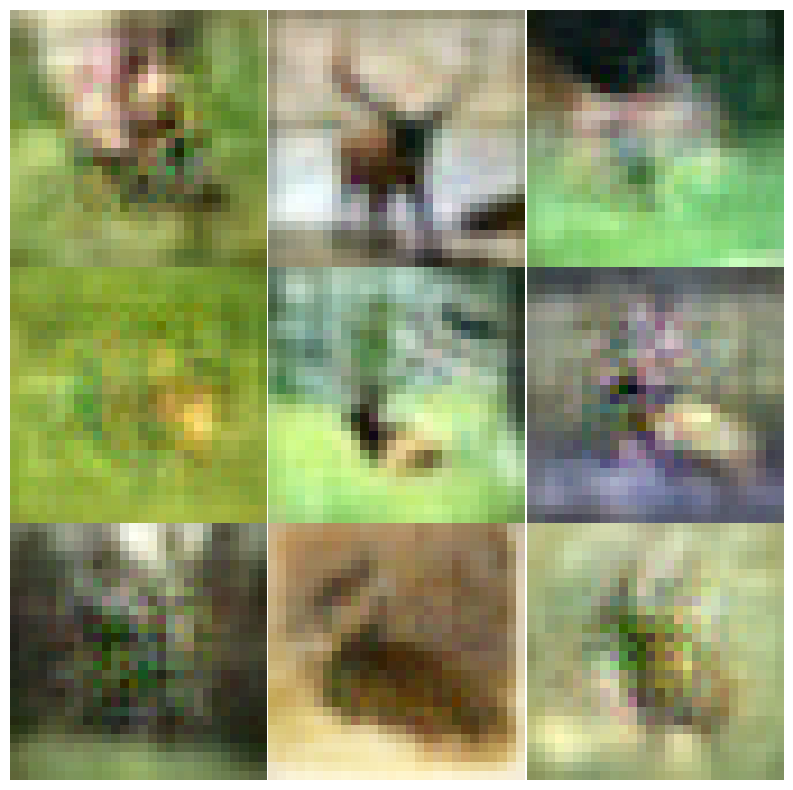

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


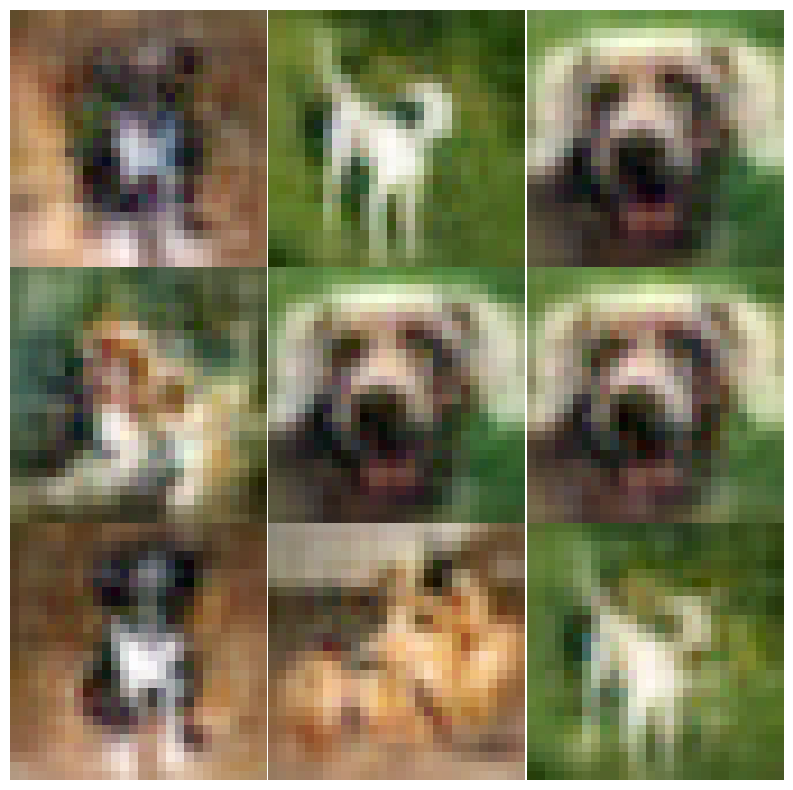

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


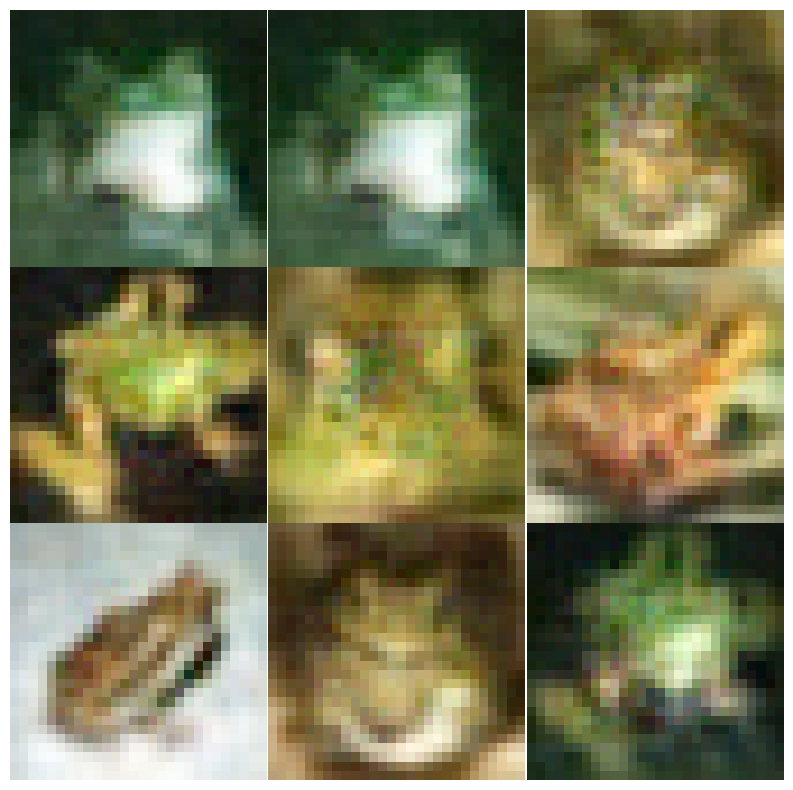

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


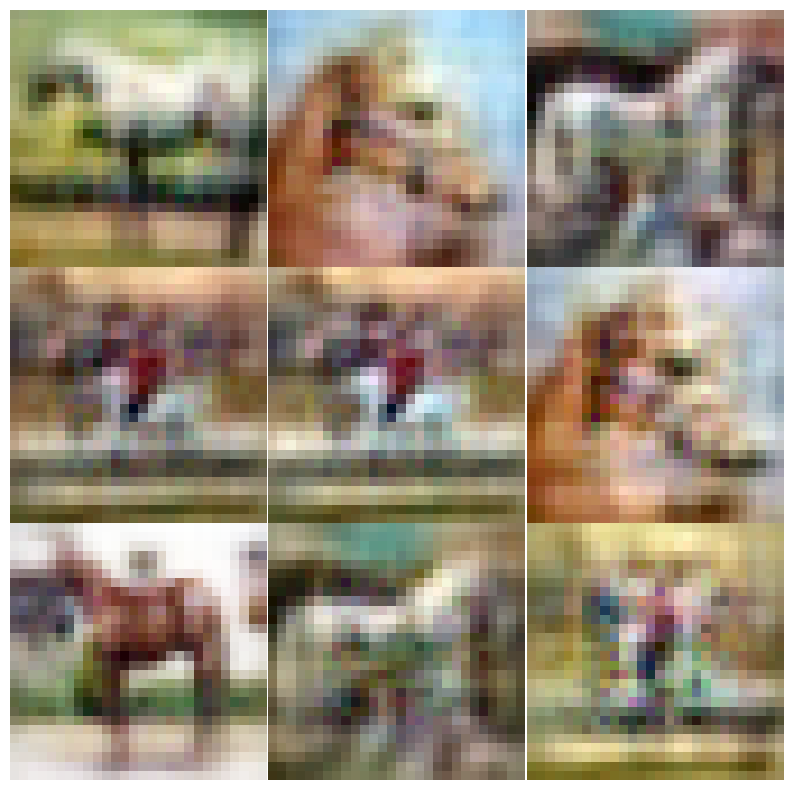

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


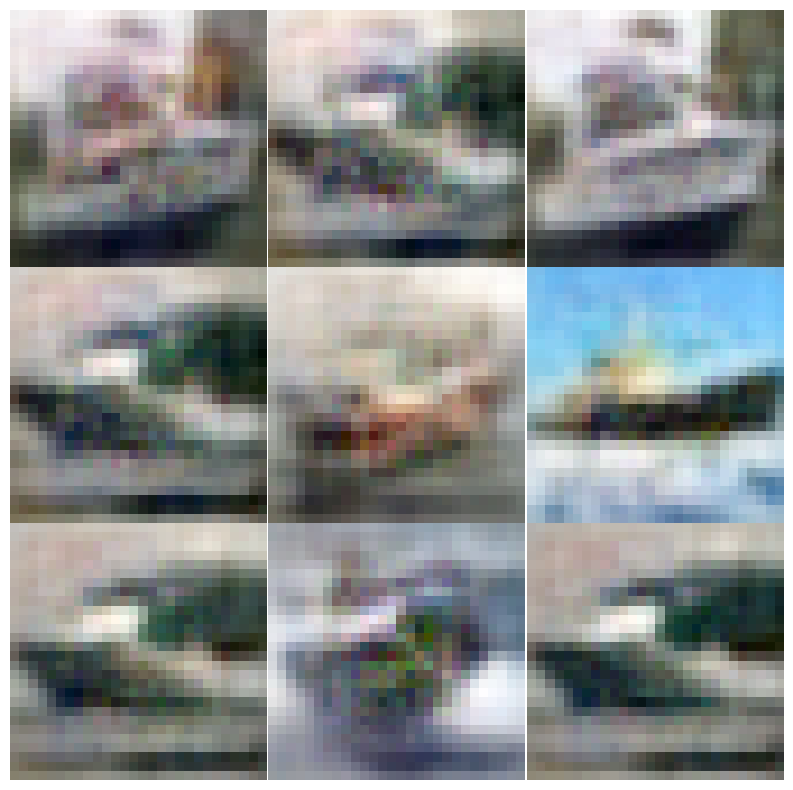

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


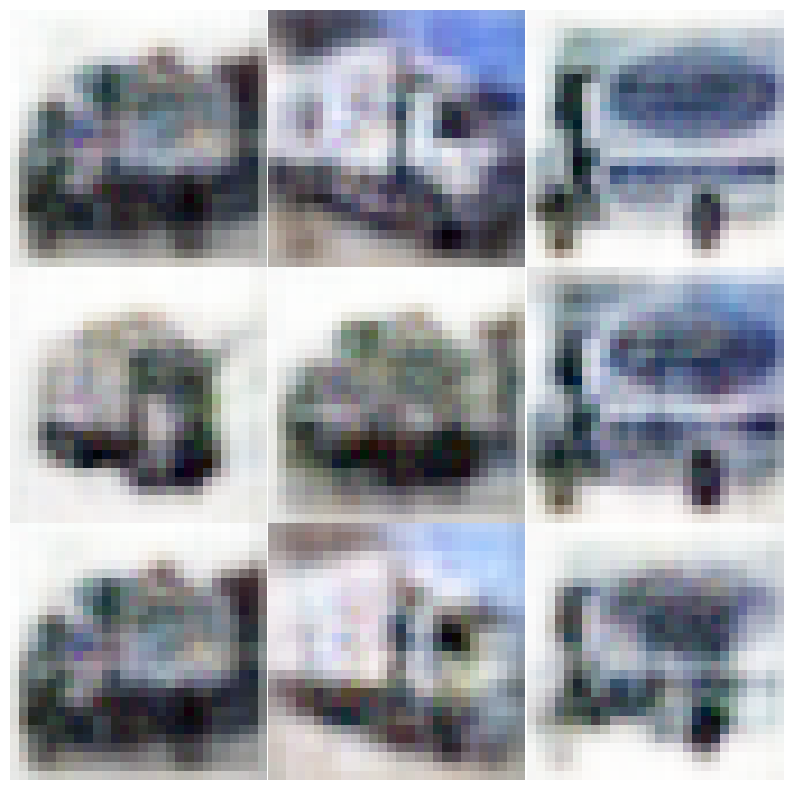

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.295481
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.284361
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.275090
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.243028
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.209268
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.124566
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.993079
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.834944
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.699094
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.842570
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.465478
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.347347
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.325172
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.341755
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.383790
Train Epoch: 1 [16000/30

Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.03it/s]


Epoch 0: MSE: 0.1277, Contrastive: 1.0064, Combined: 0.5671


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 1: MSE: 0.0406, Contrastive: 0.7017, Combined: 0.3712


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.23it/s]


Epoch 2: MSE: 0.0272, Contrastive: 0.4517, Combined: 0.2394


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.68it/s]


Epoch 3: MSE: 0.0221, Contrastive: 0.2764, Combined: 0.1492


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 4: MSE: 0.0185, Contrastive: 0.1816, Combined: 0.1000


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.12it/s]


Epoch 5: MSE: 0.0161, Contrastive: 0.1372, Combined: 0.0766


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.27it/s]


Epoch 6: MSE: 0.0148, Contrastive: 0.1005, Combined: 0.0577


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.09it/s]


Epoch 7: MSE: 0.0139, Contrastive: 0.0772, Combined: 0.0455


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 8: MSE: 0.0128, Contrastive: 0.0630, Combined: 0.0379


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.47it/s]


Epoch 9: MSE: 0.0120, Contrastive: 0.0548, Combined: 0.0334


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 10: MSE: 0.0115, Contrastive: 0.0505, Combined: 0.0310


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.35it/s]


Epoch 11: MSE: 0.0108, Contrastive: 0.0440, Combined: 0.0274


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.11it/s]


Epoch 12: MSE: 0.0102, Contrastive: 0.0412, Combined: 0.0257


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 13: MSE: 0.0097, Contrastive: 0.0369, Combined: 0.0233


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.41it/s]


Epoch 14: MSE: 0.0094, Contrastive: 0.0345, Combined: 0.0220


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 15: MSE: 0.0090, Contrastive: 0.0321, Combined: 0.0206


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.32it/s]


Epoch 16: MSE: 0.0086, Contrastive: 0.0309, Combined: 0.0198


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.43it/s]


Epoch 17: MSE: 0.0085, Contrastive: 0.0293, Combined: 0.0189


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 18: MSE: 0.0082, Contrastive: 0.0281, Combined: 0.0182


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 19: MSE: 0.0080, Contrastive: 0.0265, Combined: 0.0173


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.41it/s]


Epoch 20: MSE: 0.0078, Contrastive: 0.0252, Combined: 0.0165


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.28it/s]


Epoch 21: MSE: 0.0077, Contrastive: 0.0248, Combined: 0.0162


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.47it/s]


Epoch 22: MSE: 0.0076, Contrastive: 0.0240, Combined: 0.0158


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.00it/s]


Epoch 23: MSE: 0.0071, Contrastive: 0.0232, Combined: 0.0151


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 24: MSE: 0.0070, Contrastive: 0.0231, Combined: 0.0150


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 25: MSE: 0.0068, Contrastive: 0.0218, Combined: 0.0143


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 26: MSE: 0.0069, Contrastive: 0.0216, Combined: 0.0143


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 27: MSE: 0.0066, Contrastive: 0.0206, Combined: 0.0136


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 28: MSE: 0.0064, Contrastive: 0.0205, Combined: 0.0135


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.13it/s]


Epoch 29: MSE: 0.0064, Contrastive: 0.0199, Combined: 0.0131


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 30: MSE: 0.0063, Contrastive: 0.0190, Combined: 0.0127


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 31: MSE: 0.0062, Contrastive: 0.0192, Combined: 0.0127


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 32: MSE: 0.0060, Contrastive: 0.0184, Combined: 0.0122


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.09it/s]


Epoch 33: MSE: 0.0057, Contrastive: 0.0186, Combined: 0.0122


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.88it/s]


Epoch 34: MSE: 0.0058, Contrastive: 0.0176, Combined: 0.0117


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.85it/s]


Epoch 35: MSE: 0.0057, Contrastive: 0.0181, Combined: 0.0119


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 36: MSE: 0.0056, Contrastive: 0.0178, Combined: 0.0117


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 37: MSE: 0.0057, Contrastive: 0.0173, Combined: 0.0115


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.30it/s]


Epoch 38: MSE: 0.0054, Contrastive: 0.0169, Combined: 0.0111


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 39: MSE: 0.0055, Contrastive: 0.0169, Combined: 0.0112


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 40: MSE: 0.0051, Contrastive: 0.0165, Combined: 0.0108


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.56it/s]


Epoch 41: MSE: 0.0053, Contrastive: 0.0163, Combined: 0.0108


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 42: MSE: 0.0049, Contrastive: 0.0164, Combined: 0.0107


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 43: MSE: 0.0050, Contrastive: 0.0161, Combined: 0.0106


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 44: MSE: 0.0048, Contrastive: 0.0164, Combined: 0.0106


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 45: MSE: 0.0049, Contrastive: 0.0160, Combined: 0.0104


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 46: MSE: 0.0049, Contrastive: 0.0155, Combined: 0.0102


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.37it/s]


Epoch 47: MSE: 0.0047, Contrastive: 0.0155, Combined: 0.0101


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.45it/s]


Epoch 48: MSE: 0.0048, Contrastive: 0.0153, Combined: 0.0100


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.49it/s]


Epoch 49: MSE: 0.0046, Contrastive: 0.0151, Combined: 0.0098


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.25it/s]


Epoch 50: MSE: 0.0046, Contrastive: 0.0150, Combined: 0.0098


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.22it/s]


Epoch 51: MSE: 0.0047, Contrastive: 0.0149, Combined: 0.0098


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 52: MSE: 0.0044, Contrastive: 0.0150, Combined: 0.0097


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.63it/s]


Epoch 53: MSE: 0.0045, Contrastive: 0.0146, Combined: 0.0095


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 54: MSE: 0.0044, Contrastive: 0.0148, Combined: 0.0096


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 55: MSE: 0.0042, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 56: MSE: 0.0043, Contrastive: 0.0144, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.14it/s]


Epoch 57: MSE: 0.0042, Contrastive: 0.0145, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 58: MSE: 0.0040, Contrastive: 0.0140, Combined: 0.0090


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.32it/s]


Epoch 59: MSE: 0.0041, Contrastive: 0.0140, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 60: MSE: 0.0043, Contrastive: 0.0139, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 61: MSE: 0.0040, Contrastive: 0.0137, Combined: 0.0089


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.47it/s]


Epoch 62: MSE: 0.0039, Contrastive: 0.0138, Combined: 0.0089


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 63: MSE: 0.0040, Contrastive: 0.0137, Combined: 0.0089


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.76it/s]


Epoch 64: MSE: 0.0039, Contrastive: 0.0137, Combined: 0.0088


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 65: MSE: 0.0040, Contrastive: 0.0139, Combined: 0.0090


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 66: MSE: 0.0038, Contrastive: 0.0136, Combined: 0.0087


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 67: MSE: 0.0037, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 68: MSE: 0.0037, Contrastive: 0.0134, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 69: MSE: 0.0038, Contrastive: 0.0132, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.88it/s]


Epoch 70: MSE: 0.0037, Contrastive: 0.0132, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 71: MSE: 0.0037, Contrastive: 0.0131, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 72: MSE: 0.0036, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.98it/s]


Epoch 73: MSE: 0.0035, Contrastive: 0.0134, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 74: MSE: 0.0037, Contrastive: 0.0130, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 75: MSE: 0.0035, Contrastive: 0.0132, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.77it/s]


Epoch 76: MSE: 0.0034, Contrastive: 0.0129, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 77: MSE: 0.0034, Contrastive: 0.0127, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 78: MSE: 0.0034, Contrastive: 0.0130, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 79: MSE: 0.0034, Contrastive: 0.0128, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 80: MSE: 0.0034, Contrastive: 0.0126, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 81: MSE: 0.0033, Contrastive: 0.0127, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.76it/s]


Epoch 82: MSE: 0.0034, Contrastive: 0.0130, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.94it/s]


Epoch 83: MSE: 0.0033, Contrastive: 0.0129, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 84: MSE: 0.0032, Contrastive: 0.0127, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.29it/s]


Epoch 85: MSE: 0.0033, Contrastive: 0.0125, Combined: 0.0079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 86: MSE: 0.0032, Contrastive: 0.0127, Combined: 0.0079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 87: MSE: 0.0032, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 88: MSE: 0.0031, Contrastive: 0.0125, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 89: MSE: 0.0031, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 90: MSE: 0.0030, Contrastive: 0.0121, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.79it/s]


Epoch 91: MSE: 0.0031, Contrastive: 0.0121, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 92: MSE: 0.0031, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.15it/s]


Epoch 93: MSE: 0.0029, Contrastive: 0.0120, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.41it/s]


Epoch 94: MSE: 0.0031, Contrastive: 0.0121, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.28it/s]


Epoch 95: MSE: 0.0029, Contrastive: 0.0121, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.31it/s]


Epoch 96: MSE: 0.0028, Contrastive: 0.0122, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 97: MSE: 0.0029, Contrastive: 0.0126, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 98: MSE: 0.0029, Contrastive: 0.0123, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.20it/s]


Epoch 99: MSE: 0.0029, Contrastive: 0.0122, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.47it/s]


Epoch 100: MSE: 0.0029, Contrastive: 0.0123, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 101: MSE: 0.0029, Contrastive: 0.0120, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 102: MSE: 0.0029, Contrastive: 0.0120, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.83it/s]


Epoch 103: MSE: 0.0029, Contrastive: 0.0124, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.93it/s]


Epoch 104: MSE: 0.0028, Contrastive: 0.0119, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 105: MSE: 0.0028, Contrastive: 0.0119, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 106: MSE: 0.0027, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 107: MSE: 0.0027, Contrastive: 0.0120, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 108: MSE: 0.0027, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 109: MSE: 0.0028, Contrastive: 0.0119, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.13it/s]


Epoch 110: MSE: 0.0027, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.21it/s]


Epoch 111: MSE: 0.0027, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.34it/s]


Epoch 112: MSE: 0.0028, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 113: MSE: 0.0027, Contrastive: 0.0120, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.24it/s]


Epoch 114: MSE: 0.0027, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.90it/s]


Epoch 115: MSE: 0.0028, Contrastive: 0.0117, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 116: MSE: 0.0025, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.26it/s]


Epoch 117: MSE: 0.0027, Contrastive: 0.0118, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 118: MSE: 0.0026, Contrastive: 0.0116, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 119: MSE: 0.0026, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.56it/s]


Epoch 120: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 121: MSE: 0.0026, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 122: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.62it/s]


Epoch 123: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 124: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 125: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.62it/s]


Epoch 126: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 127: MSE: 0.0025, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 128: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.36it/s]


Epoch 129: MSE: 0.0025, Contrastive: 0.0113, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.91it/s]


Epoch 130: MSE: 0.0023, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.36it/s]


Epoch 131: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 132: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 133: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 134: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 135: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 136: MSE: 0.0023, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 137: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 138: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.06it/s]


Epoch 139: MSE: 0.0024, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 140: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 141: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 142: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 143: MSE: 0.0020, Contrastive: 0.0114, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.47it/s]


Epoch 144: MSE: 0.0023, Contrastive: 0.0112, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.68it/s]


Epoch 145: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 146: MSE: 0.0021, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 147: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 148: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 149: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 150: MSE: 0.0022, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 151: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 152: MSE: 0.0021, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 153: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.11it/s]


Epoch 154: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.91it/s]


Epoch 155: MSE: 0.0020, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 156: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.04it/s]


Epoch 157: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 158: MSE: 0.0022, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 159: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 160: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.88it/s]


Epoch 161: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 162: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.77it/s]


Epoch 163: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.94it/s]


Epoch 164: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 165: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 166: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 167: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.12it/s]


Epoch 168: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.07it/s]


Epoch 169: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 170: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.18it/s]


Epoch 171: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 172: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.08it/s]


Epoch 173: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 174: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.01it/s]


Epoch 175: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.32it/s]


Epoch 176: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 177: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.83it/s]


Epoch 178: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.42it/s]


Epoch 179: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 180: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 181: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 182: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.68it/s]


Epoch 183: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.06it/s]


Epoch 184: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 185: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 186: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.86it/s]


Epoch 187: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 188: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 189: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.17it/s]


Epoch 190: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 191: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 192: MSE: 0.0019, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.83it/s]


Epoch 193: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 194: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 195: MSE: 0.0017, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.04it/s]


Epoch 196: MSE: 0.0017, Contrastive: 0.0108, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.76it/s]


Epoch 197: MSE: 0.0017, Contrastive: 0.0107, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 198: MSE: 0.0017, Contrastive: 0.0108, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:02<00:00, 36.04it/s]


Epoch 199: MSE: 0.0017, Contrastive: 0.0108, Combined: 0.0063
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.48
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


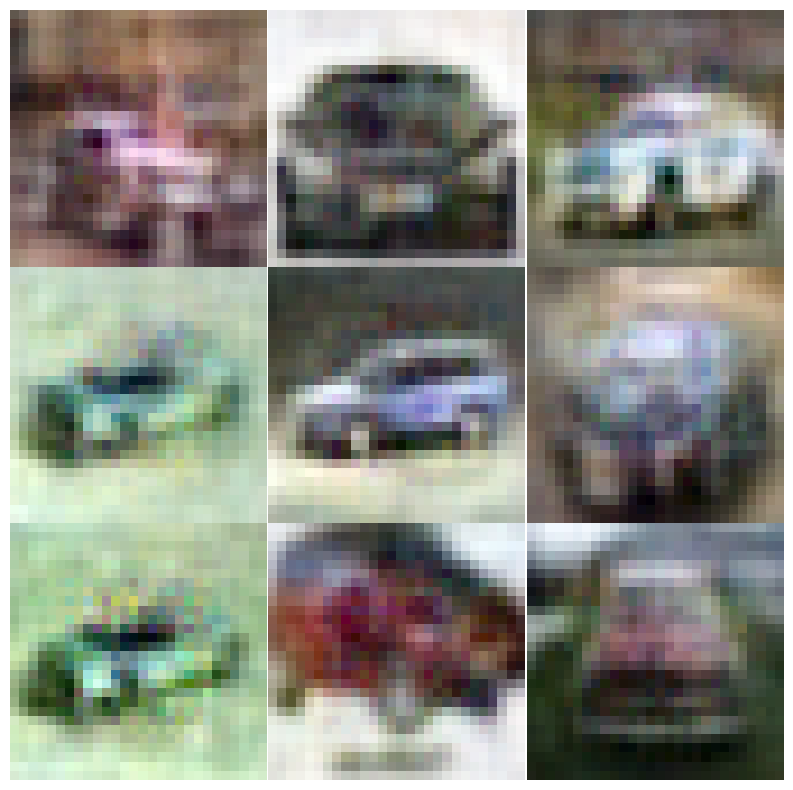

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


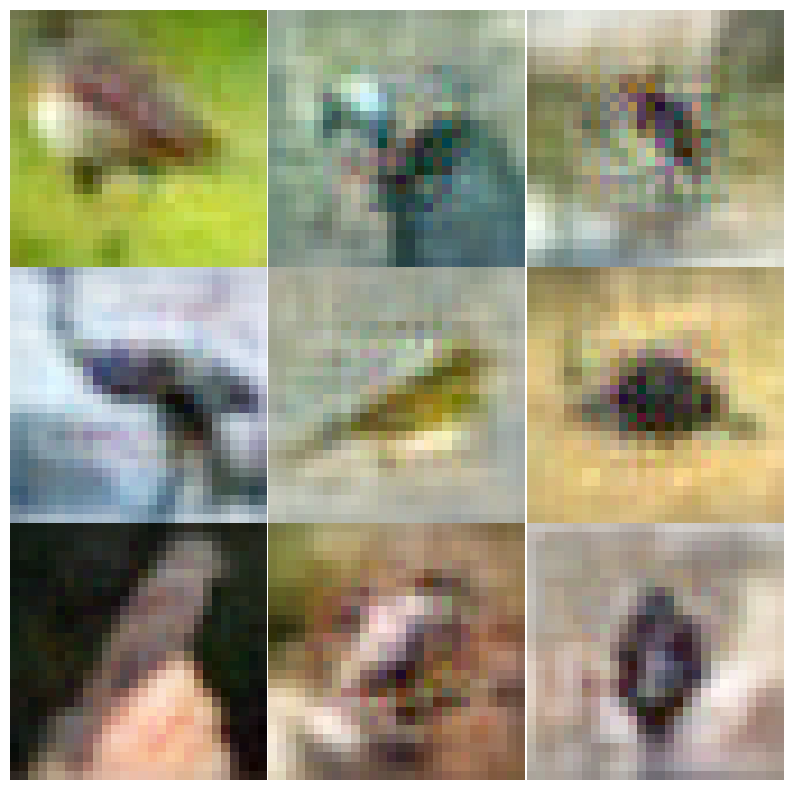

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


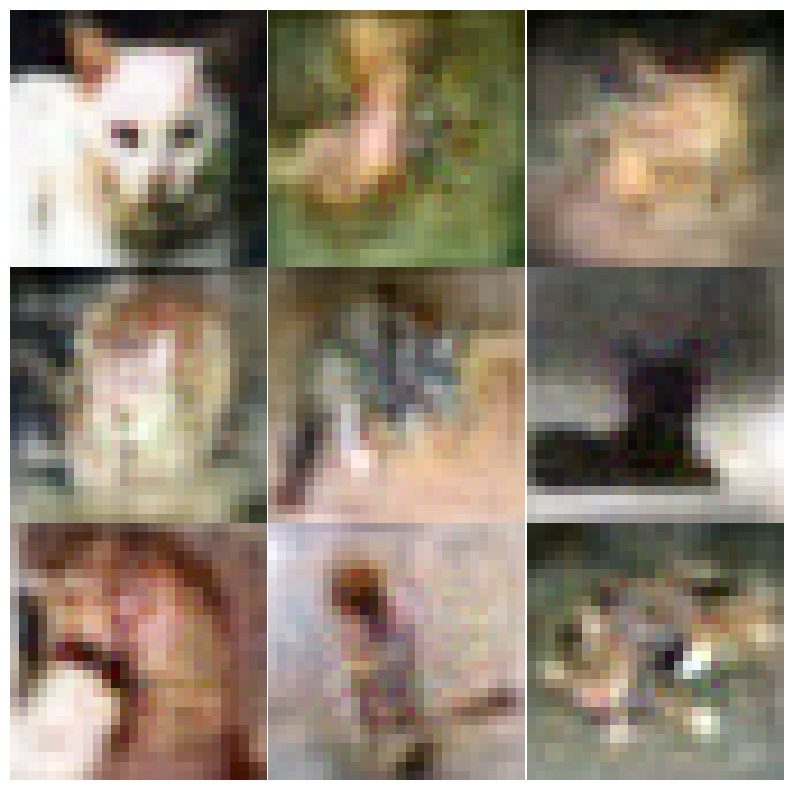

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


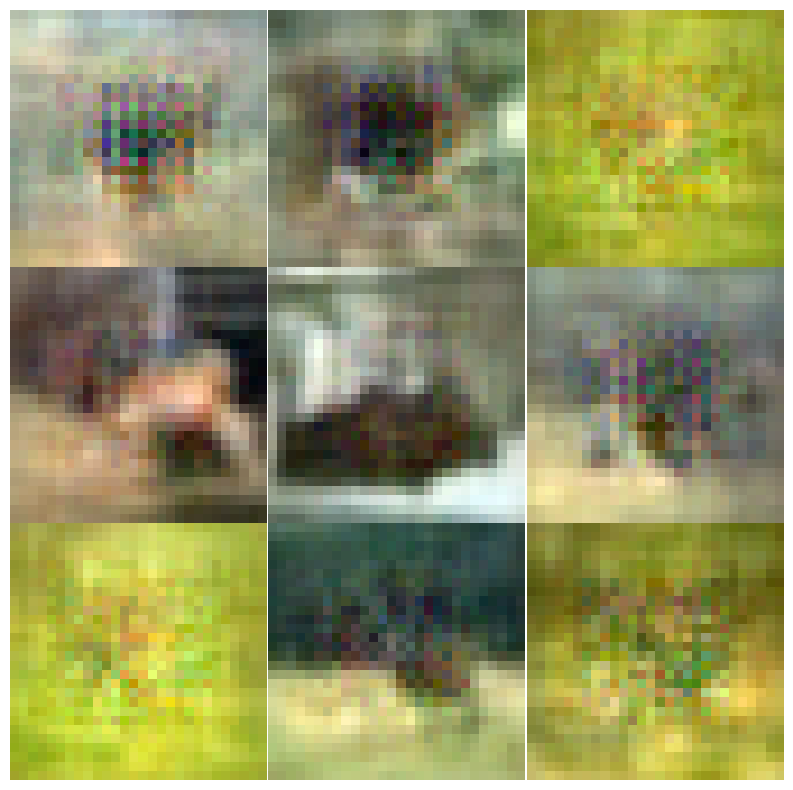

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


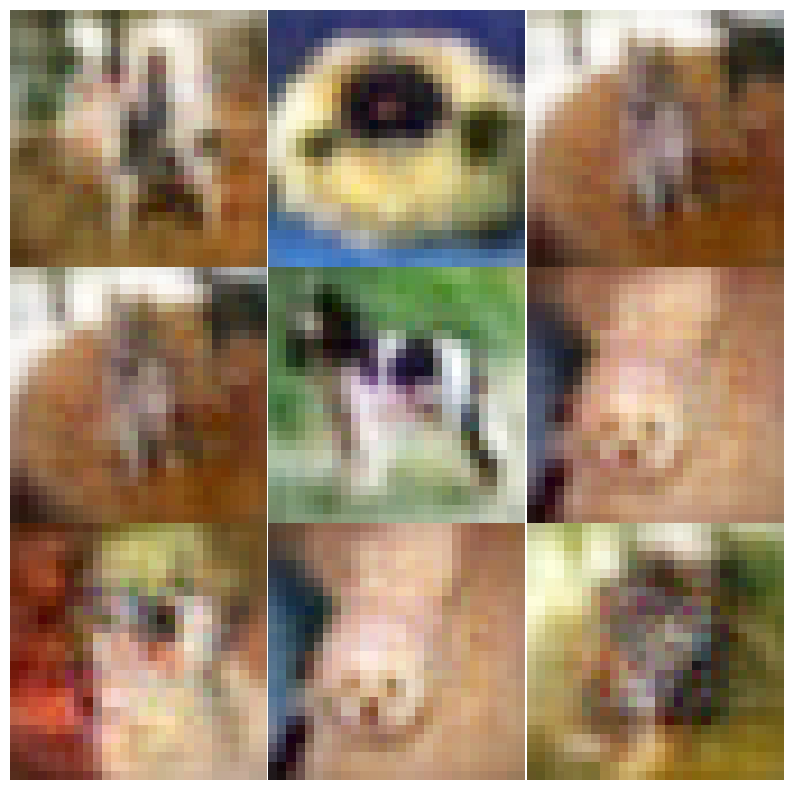

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


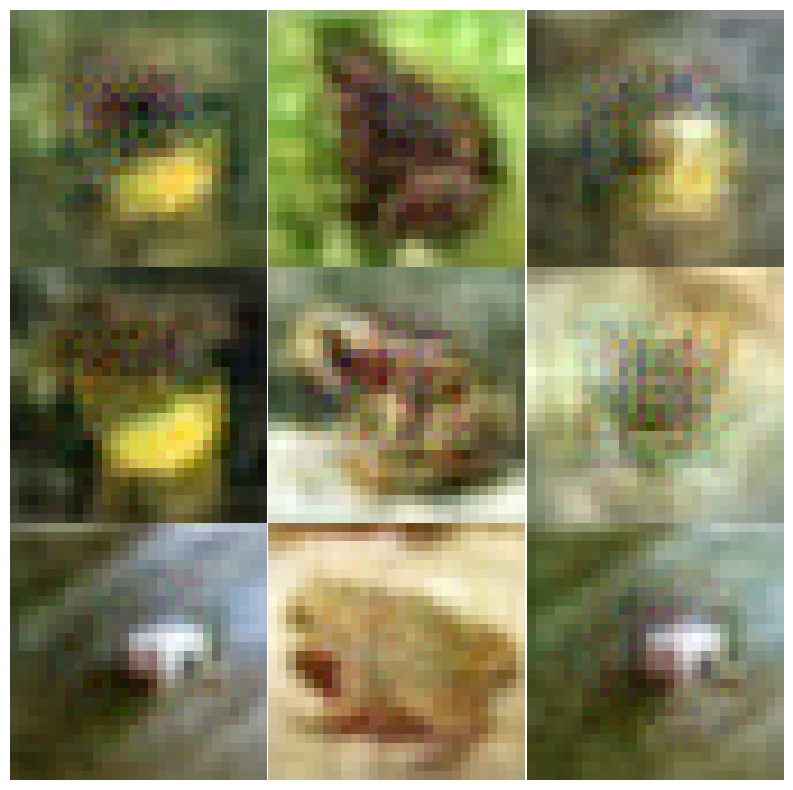

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


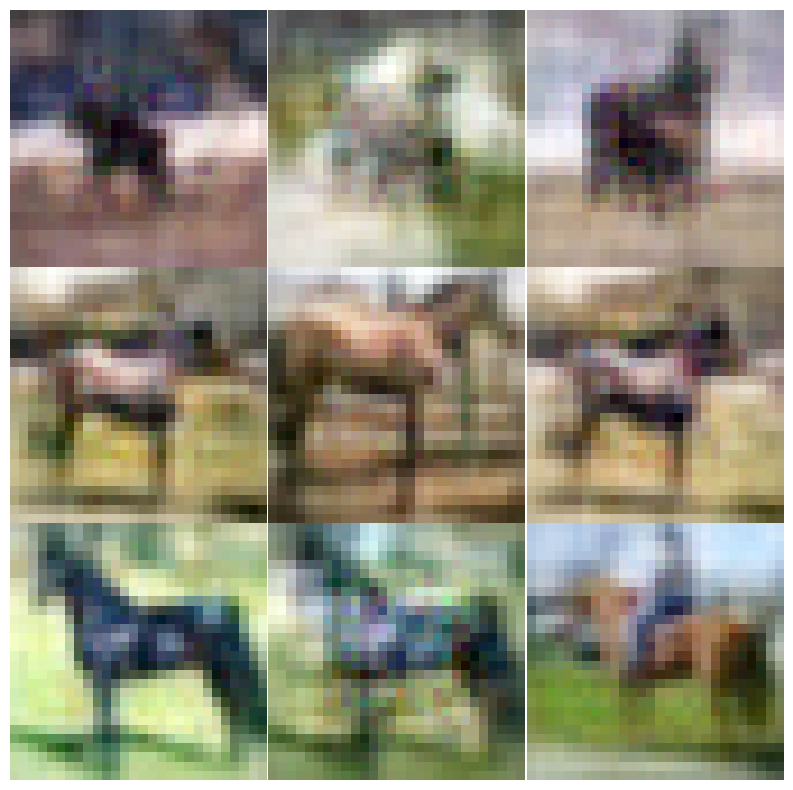

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


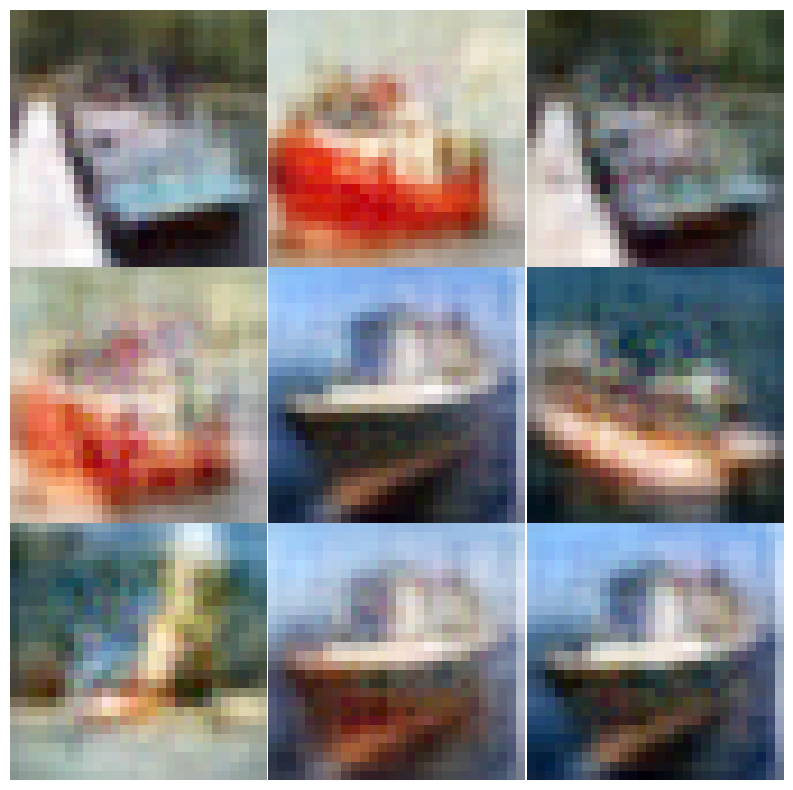

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


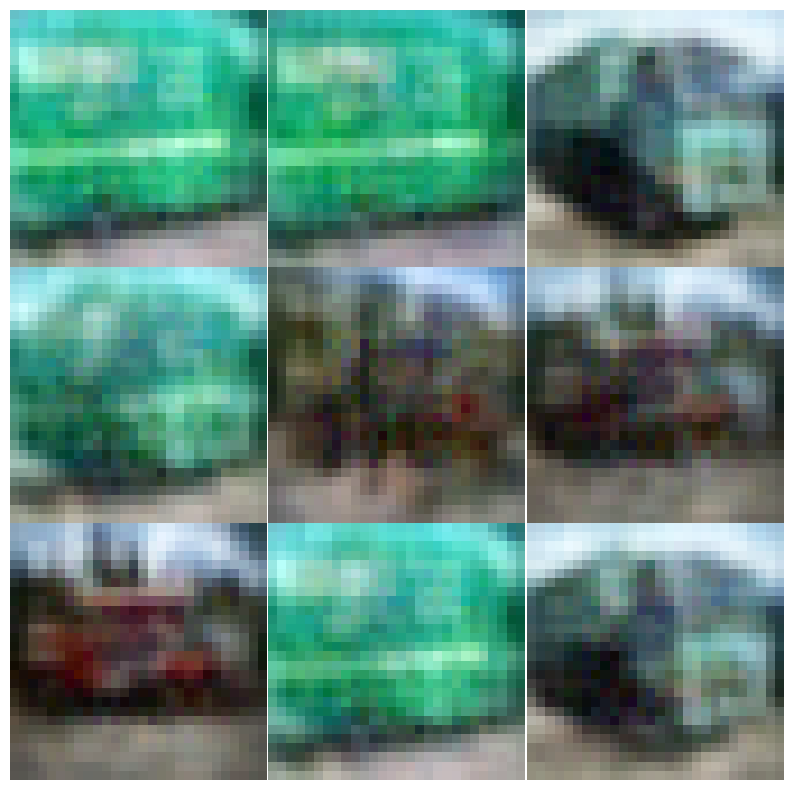

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.09
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.296933
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.297021
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.278680
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.258265
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.231702
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.131687
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.038762
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.855041
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.686342
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.745200
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.458120
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.438771
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.286368
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.157550
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.191763
Train Epoch: 1 [16000/30

Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.16it/s]


Epoch 0: MSE: 0.1235, Contrastive: 1.0757, Combined: 0.5996


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 1: MSE: 0.0350, Contrastive: 0.5465, Combined: 0.2907


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.23it/s]


Epoch 2: MSE: 0.0249, Contrastive: 0.2780, Combined: 0.1514


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.85it/s]


Epoch 3: MSE: 0.0204, Contrastive: 0.1953, Combined: 0.1079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.93it/s]


Epoch 4: MSE: 0.0177, Contrastive: 0.1451, Combined: 0.0814


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 5: MSE: 0.0167, Contrastive: 0.1276, Combined: 0.0721


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.76it/s]


Epoch 6: MSE: 0.0152, Contrastive: 0.0985, Combined: 0.0569


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.10it/s]


Epoch 7: MSE: 0.0141, Contrastive: 0.0839, Combined: 0.0490


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.90it/s]


Epoch 8: MSE: 0.0131, Contrastive: 0.0682, Combined: 0.0407


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 9: MSE: 0.0124, Contrastive: 0.0596, Combined: 0.0360


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 10: MSE: 0.0116, Contrastive: 0.0519, Combined: 0.0318


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 11: MSE: 0.0110, Contrastive: 0.0469, Combined: 0.0289


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.07it/s]


Epoch 12: MSE: 0.0104, Contrastive: 0.0413, Combined: 0.0258


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 13: MSE: 0.0102, Contrastive: 0.0390, Combined: 0.0246


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 14: MSE: 0.0098, Contrastive: 0.0365, Combined: 0.0231


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.76it/s]


Epoch 15: MSE: 0.0095, Contrastive: 0.0320, Combined: 0.0207


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 16: MSE: 0.0090, Contrastive: 0.0307, Combined: 0.0199


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 17: MSE: 0.0087, Contrastive: 0.0286, Combined: 0.0187


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.98it/s]


Epoch 18: MSE: 0.0086, Contrastive: 0.0278, Combined: 0.0182


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 19: MSE: 0.0084, Contrastive: 0.0272, Combined: 0.0178


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.93it/s]


Epoch 20: MSE: 0.0082, Contrastive: 0.0256, Combined: 0.0169


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 21: MSE: 0.0077, Contrastive: 0.0242, Combined: 0.0159


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 22: MSE: 0.0076, Contrastive: 0.0235, Combined: 0.0155


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 23: MSE: 0.0074, Contrastive: 0.0233, Combined: 0.0154


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.01it/s]


Epoch 24: MSE: 0.0073, Contrastive: 0.0222, Combined: 0.0147


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 25: MSE: 0.0069, Contrastive: 0.0210, Combined: 0.0139


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.09it/s]


Epoch 26: MSE: 0.0067, Contrastive: 0.0205, Combined: 0.0136


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.34it/s]


Epoch 27: MSE: 0.0067, Contrastive: 0.0207, Combined: 0.0137


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.17it/s]


Epoch 28: MSE: 0.0064, Contrastive: 0.0193, Combined: 0.0129


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.93it/s]


Epoch 29: MSE: 0.0064, Contrastive: 0.0192, Combined: 0.0128


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 30: MSE: 0.0062, Contrastive: 0.0185, Combined: 0.0124


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 31: MSE: 0.0061, Contrastive: 0.0182, Combined: 0.0122


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 32: MSE: 0.0060, Contrastive: 0.0181, Combined: 0.0120


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.28it/s]


Epoch 33: MSE: 0.0060, Contrastive: 0.0180, Combined: 0.0120


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.01it/s]


Epoch 34: MSE: 0.0059, Contrastive: 0.0172, Combined: 0.0116


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 35: MSE: 0.0057, Contrastive: 0.0171, Combined: 0.0114


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.07it/s]


Epoch 36: MSE: 0.0055, Contrastive: 0.0169, Combined: 0.0112


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 37: MSE: 0.0055, Contrastive: 0.0166, Combined: 0.0111


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.77it/s]


Epoch 38: MSE: 0.0054, Contrastive: 0.0164, Combined: 0.0109


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.21it/s]


Epoch 39: MSE: 0.0053, Contrastive: 0.0162, Combined: 0.0107


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.36it/s]


Epoch 40: MSE: 0.0052, Contrastive: 0.0161, Combined: 0.0107


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.05it/s]


Epoch 41: MSE: 0.0051, Contrastive: 0.0157, Combined: 0.0104


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.00it/s]


Epoch 42: MSE: 0.0050, Contrastive: 0.0158, Combined: 0.0104


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 43: MSE: 0.0050, Contrastive: 0.0156, Combined: 0.0103


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.61it/s]


Epoch 44: MSE: 0.0049, Contrastive: 0.0157, Combined: 0.0103


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.65it/s]


Epoch 45: MSE: 0.0048, Contrastive: 0.0154, Combined: 0.0101


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 46: MSE: 0.0048, Contrastive: 0.0151, Combined: 0.0100


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.19it/s]


Epoch 47: MSE: 0.0049, Contrastive: 0.0153, Combined: 0.0101


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.01it/s]


Epoch 48: MSE: 0.0045, Contrastive: 0.0149, Combined: 0.0097


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.22it/s]


Epoch 49: MSE: 0.0046, Contrastive: 0.0148, Combined: 0.0097


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 50: MSE: 0.0043, Contrastive: 0.0147, Combined: 0.0095


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.01it/s]


Epoch 51: MSE: 0.0043, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 52: MSE: 0.0044, Contrastive: 0.0145, Combined: 0.0095


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 53: MSE: 0.0044, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 54: MSE: 0.0043, Contrastive: 0.0143, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.55it/s]


Epoch 55: MSE: 0.0044, Contrastive: 0.0144, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 56: MSE: 0.0044, Contrastive: 0.0142, Combined: 0.0093


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 57: MSE: 0.0042, Contrastive: 0.0145, Combined: 0.0094


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.31it/s]


Epoch 58: MSE: 0.0041, Contrastive: 0.0143, Combined: 0.0092


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.97it/s]


Epoch 59: MSE: 0.0040, Contrastive: 0.0142, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 60: MSE: 0.0042, Contrastive: 0.0139, Combined: 0.0091


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 61: MSE: 0.0039, Contrastive: 0.0135, Combined: 0.0087


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 62: MSE: 0.0040, Contrastive: 0.0144, Combined: 0.0092


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.32it/s]


Epoch 63: MSE: 0.0039, Contrastive: 0.0137, Combined: 0.0088


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.16it/s]


Epoch 64: MSE: 0.0037, Contrastive: 0.0136, Combined: 0.0087


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.01it/s]


Epoch 65: MSE: 0.0038, Contrastive: 0.0135, Combined: 0.0087


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.79it/s]


Epoch 66: MSE: 0.0037, Contrastive: 0.0132, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.90it/s]


Epoch 67: MSE: 0.0038, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 68: MSE: 0.0037, Contrastive: 0.0132, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 69: MSE: 0.0037, Contrastive: 0.0132, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 70: MSE: 0.0036, Contrastive: 0.0131, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.42it/s]


Epoch 71: MSE: 0.0036, Contrastive: 0.0131, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 72: MSE: 0.0036, Contrastive: 0.0133, Combined: 0.0085


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.85it/s]


Epoch 73: MSE: 0.0035, Contrastive: 0.0131, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 74: MSE: 0.0035, Contrastive: 0.0132, Combined: 0.0084


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.09it/s]


Epoch 75: MSE: 0.0037, Contrastive: 0.0130, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 76: MSE: 0.0035, Contrastive: 0.0131, Combined: 0.0083


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.56it/s]


Epoch 77: MSE: 0.0034, Contrastive: 0.0127, Combined: 0.0081


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.29it/s]


Epoch 78: MSE: 0.0033, Contrastive: 0.0130, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.98it/s]


Epoch 79: MSE: 0.0033, Contrastive: 0.0125, Combined: 0.0079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.94it/s]


Epoch 80: MSE: 0.0034, Contrastive: 0.0131, Combined: 0.0082


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.04it/s]


Epoch 81: MSE: 0.0032, Contrastive: 0.0129, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 82: MSE: 0.0032, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 83: MSE: 0.0031, Contrastive: 0.0128, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.18it/s]


Epoch 84: MSE: 0.0032, Contrastive: 0.0128, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.17it/s]


Epoch 85: MSE: 0.0032, Contrastive: 0.0128, Combined: 0.0080


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.32it/s]


Epoch 86: MSE: 0.0033, Contrastive: 0.0125, Combined: 0.0079


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.56it/s]


Epoch 87: MSE: 0.0030, Contrastive: 0.0122, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.94it/s]


Epoch 88: MSE: 0.0031, Contrastive: 0.0123, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.14it/s]


Epoch 89: MSE: 0.0032, Contrastive: 0.0122, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.41it/s]


Epoch 90: MSE: 0.0031, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.45it/s]


Epoch 91: MSE: 0.0030, Contrastive: 0.0124, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 92: MSE: 0.0030, Contrastive: 0.0122, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 93: MSE: 0.0031, Contrastive: 0.0124, Combined: 0.0078


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.06it/s]


Epoch 94: MSE: 0.0031, Contrastive: 0.0122, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.13it/s]


Epoch 95: MSE: 0.0030, Contrastive: 0.0124, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 96: MSE: 0.0031, Contrastive: 0.0122, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 97: MSE: 0.0030, Contrastive: 0.0124, Combined: 0.0077


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.03it/s]


Epoch 98: MSE: 0.0028, Contrastive: 0.0122, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.13it/s]


Epoch 99: MSE: 0.0030, Contrastive: 0.0121, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.51it/s]


Epoch 100: MSE: 0.0028, Contrastive: 0.0120, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.44it/s]


Epoch 101: MSE: 0.0028, Contrastive: 0.0118, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.19it/s]


Epoch 102: MSE: 0.0028, Contrastive: 0.0123, Combined: 0.0076


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.25it/s]


Epoch 103: MSE: 0.0028, Contrastive: 0.0121, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 104: MSE: 0.0027, Contrastive: 0.0119, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.95it/s]


Epoch 105: MSE: 0.0028, Contrastive: 0.0118, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.48it/s]


Epoch 106: MSE: 0.0028, Contrastive: 0.0122, Combined: 0.0075


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.57it/s]


Epoch 107: MSE: 0.0028, Contrastive: 0.0120, Combined: 0.0074


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 108: MSE: 0.0028, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.02it/s]


Epoch 109: MSE: 0.0027, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.92it/s]


Epoch 110: MSE: 0.0026, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.84it/s]


Epoch 111: MSE: 0.0028, Contrastive: 0.0116, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 112: MSE: 0.0026, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 113: MSE: 0.0027, Contrastive: 0.0116, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.80it/s]


Epoch 114: MSE: 0.0025, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 115: MSE: 0.0026, Contrastive: 0.0117, Combined: 0.0072


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 116: MSE: 0.0025, Contrastive: 0.0120, Combined: 0.0073


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 117: MSE: 0.0026, Contrastive: 0.0115, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 118: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.96it/s]


Epoch 119: MSE: 0.0025, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.60it/s]


Epoch 120: MSE: 0.0024, Contrastive: 0.0118, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 121: MSE: 0.0026, Contrastive: 0.0116, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.65it/s]


Epoch 122: MSE: 0.0025, Contrastive: 0.0117, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.29it/s]


Epoch 123: MSE: 0.0025, Contrastive: 0.0116, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.35it/s]


Epoch 124: MSE: 0.0024, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.25it/s]


Epoch 125: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.75it/s]


Epoch 126: MSE: 0.0024, Contrastive: 0.0119, Combined: 0.0071


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 127: MSE: 0.0025, Contrastive: 0.0114, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.40it/s]


Epoch 128: MSE: 0.0025, Contrastive: 0.0113, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 129: MSE: 0.0024, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.70it/s]


Epoch 130: MSE: 0.0024, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.53it/s]


Epoch 131: MSE: 0.0025, Contrastive: 0.0115, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.34it/s]


Epoch 132: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.22it/s]


Epoch 133: MSE: 0.0025, Contrastive: 0.0114, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.49it/s]


Epoch 134: MSE: 0.0024, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.26it/s]


Epoch 135: MSE: 0.0023, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.05it/s]


Epoch 136: MSE: 0.0023, Contrastive: 0.0117, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 137: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 138: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.41it/s]


Epoch 139: MSE: 0.0023, Contrastive: 0.0116, Combined: 0.0070


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 140: MSE: 0.0023, Contrastive: 0.0115, Combined: 0.0069


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.62it/s]


Epoch 141: MSE: 0.0022, Contrastive: 0.0114, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.49it/s]


Epoch 142: MSE: 0.0022, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 143: MSE: 0.0021, Contrastive: 0.0115, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.40it/s]


Epoch 144: MSE: 0.0022, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.68it/s]


Epoch 145: MSE: 0.0024, Contrastive: 0.0111, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 146: MSE: 0.0022, Contrastive: 0.0114, Combined: 0.0068


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 147: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.58it/s]


Epoch 148: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 149: MSE: 0.0021, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.37it/s]


Epoch 150: MSE: 0.0022, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.63it/s]


Epoch 151: MSE: 0.0022, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 36.77it/s]


Epoch 152: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.03it/s]


Epoch 153: MSE: 0.0022, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.54it/s]


Epoch 154: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.51it/s]


Epoch 155: MSE: 0.0021, Contrastive: 0.0114, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 156: MSE: 0.0020, Contrastive: 0.0113, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 157: MSE: 0.0020, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.82it/s]


Epoch 158: MSE: 0.0021, Contrastive: 0.0112, Combined: 0.0067


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.83it/s]


Epoch 159: MSE: 0.0019, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 160: MSE: 0.0021, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.45it/s]


Epoch 161: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.66it/s]


Epoch 162: MSE: 0.0020, Contrastive: 0.0111, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.10it/s]


Epoch 163: MSE: 0.0020, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 164: MSE: 0.0021, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.30it/s]


Epoch 165: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.69it/s]


Epoch 166: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 167: MSE: 0.0019, Contrastive: 0.0112, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 168: MSE: 0.0019, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.72it/s]


Epoch 169: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.12it/s]


Epoch 170: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.43it/s]


Epoch 171: MSE: 0.0019, Contrastive: 0.0114, Combined: 0.0066


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.73it/s]


Epoch 172: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.89it/s]


Epoch 173: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.93it/s]


Epoch 174: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.99it/s]


Epoch 175: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 176: MSE: 0.0020, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 38.02it/s]


Epoch 177: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 178: MSE: 0.0019, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.50it/s]


Epoch 179: MSE: 0.0019, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.68it/s]


Epoch 180: MSE: 0.0020, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.27it/s]


Epoch 181: MSE: 0.0018, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.05it/s]


Epoch 182: MSE: 0.0020, Contrastive: 0.0108, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.34it/s]


Epoch 183: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.45it/s]


Epoch 184: MSE: 0.0019, Contrastive: 0.0111, Combined: 0.0065


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.59it/s]


Epoch 185: MSE: 0.0017, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.81it/s]


Epoch 186: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.64it/s]


Epoch 187: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.39it/s]


Epoch 188: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.87it/s]


Epoch 189: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.67it/s]


Epoch 190: MSE: 0.0018, Contrastive: 0.0107, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.52it/s]


Epoch 191: MSE: 0.0018, Contrastive: 0.0107, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.36it/s]


Epoch 192: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.07it/s]


Epoch 193: MSE: 0.0018, Contrastive: 0.0110, Combined: 0.0064


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.78it/s]


Epoch 194: MSE: 0.0018, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.71it/s]


Epoch 195: MSE: 0.0018, Contrastive: 0.0107, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.60it/s]


Epoch 196: MSE: 0.0017, Contrastive: 0.0109, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.46it/s]


Epoch 197: MSE: 0.0018, Contrastive: 0.0108, Combined: 0.0063


Loading...: 100%|██████████| 73/73 [00:01<00:00, 37.74it/s]


Epoch 198: MSE: 0.0017, Contrastive: 0.0107, Combined: 0.0062


Loading...: 100%|██████████| 73/73 [00:02<00:00, 35.95it/s]


Epoch 199: MSE: 0.0019, Contrastive: 0.0108, Combined: 0.0063
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 6.47
------ Plot Latent Space ------


------------------------------
0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


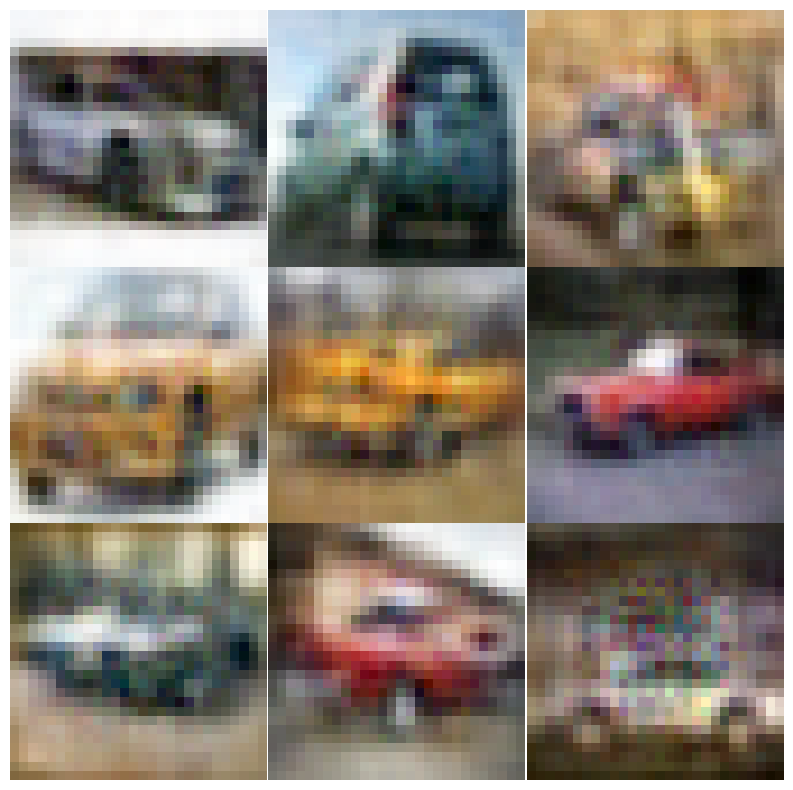

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


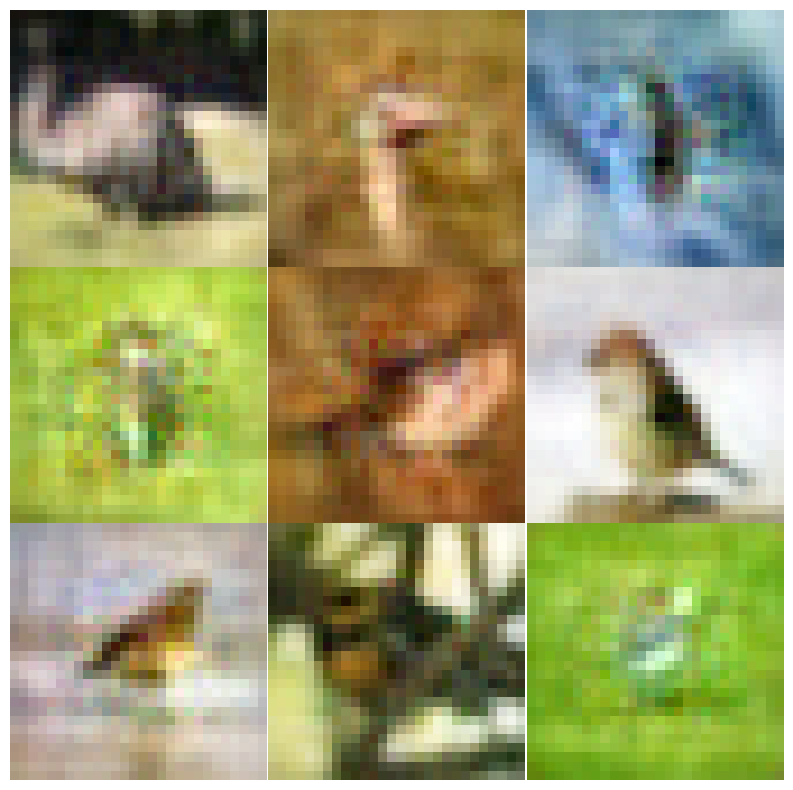

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


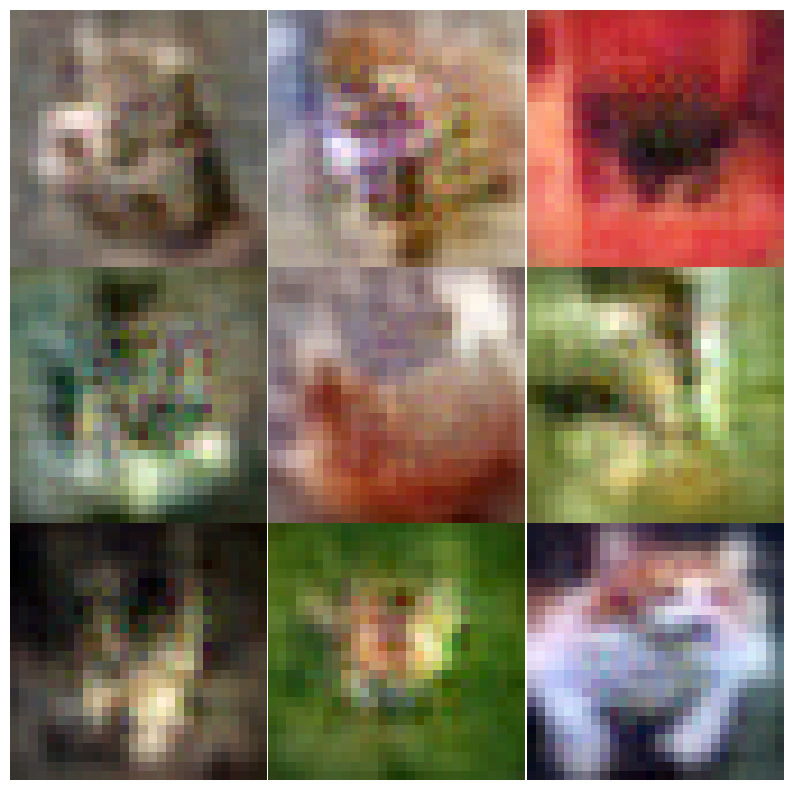

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


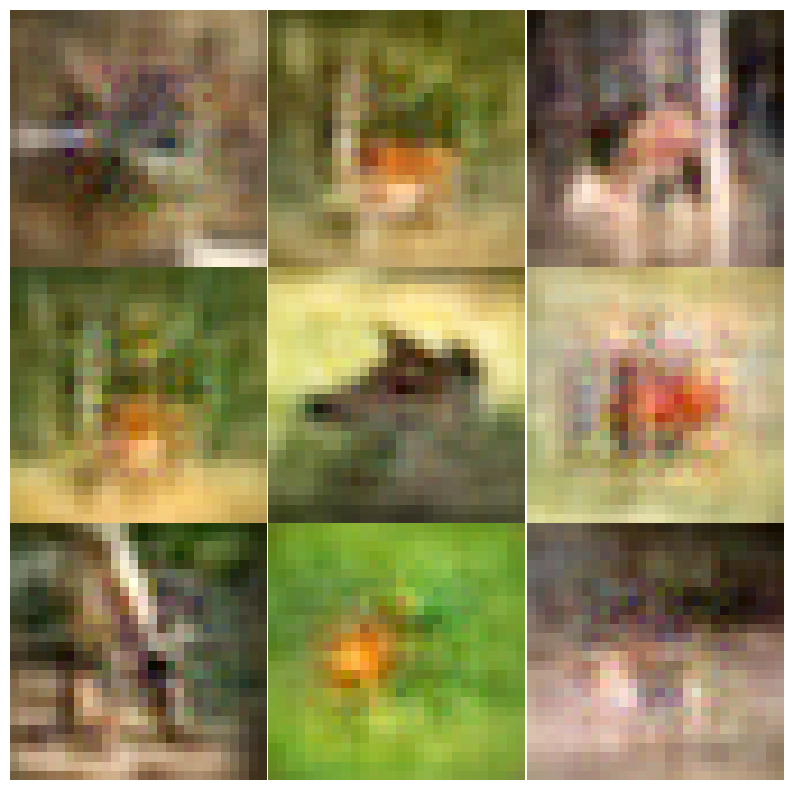

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


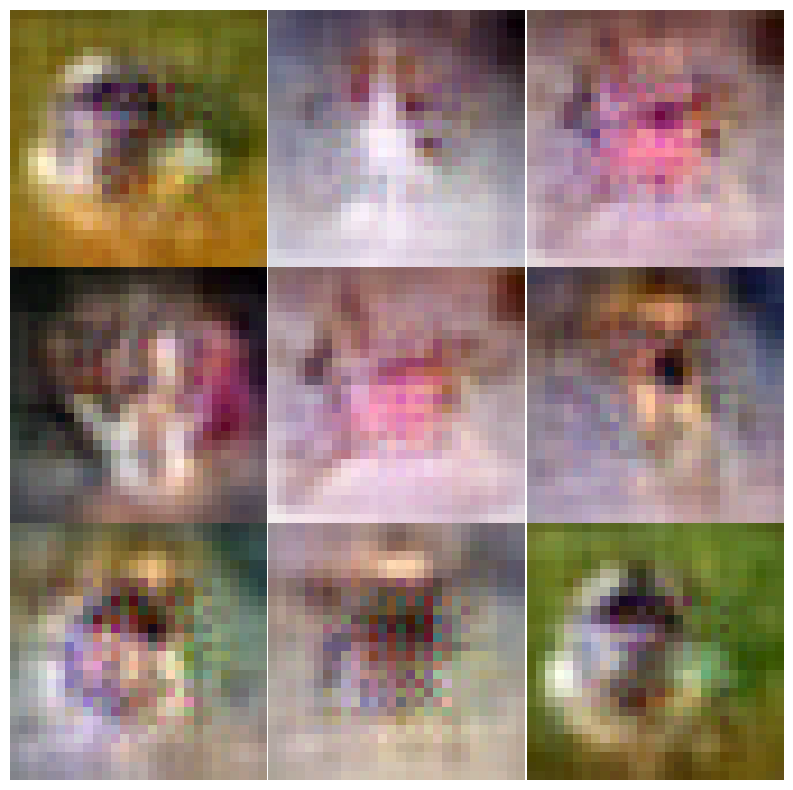

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


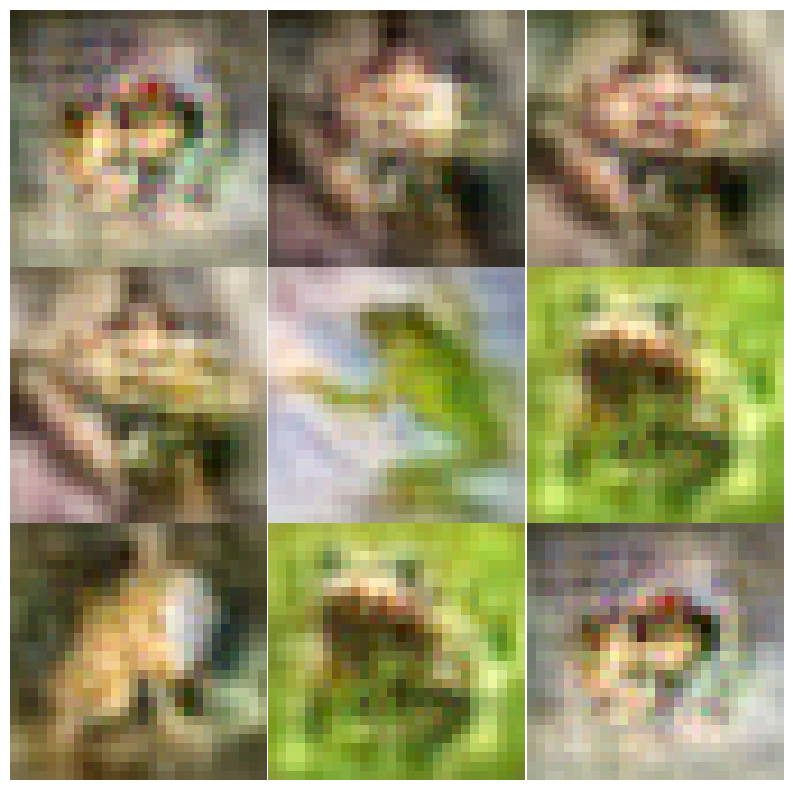

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


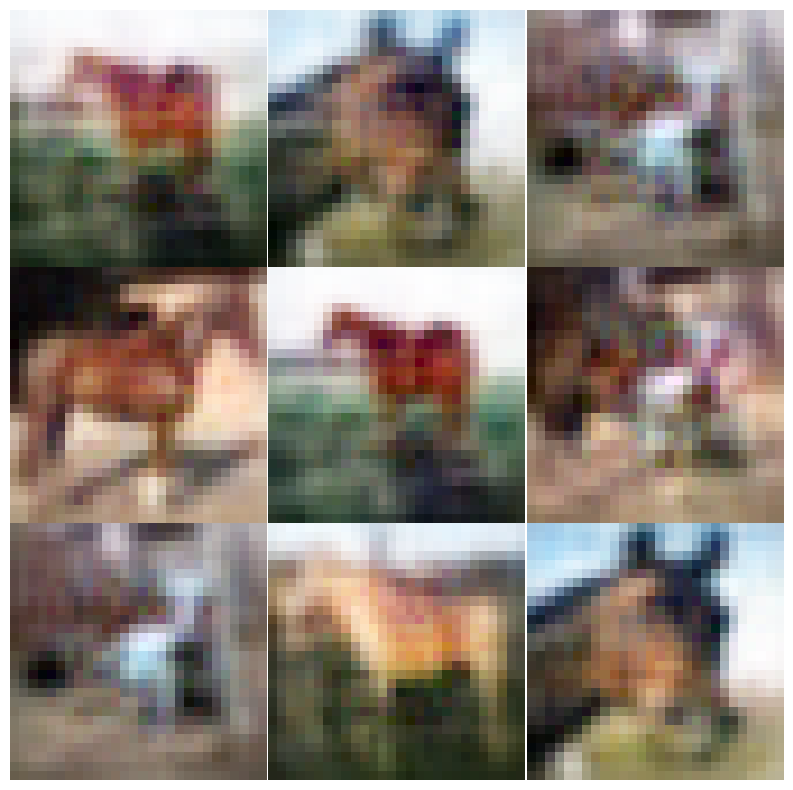

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


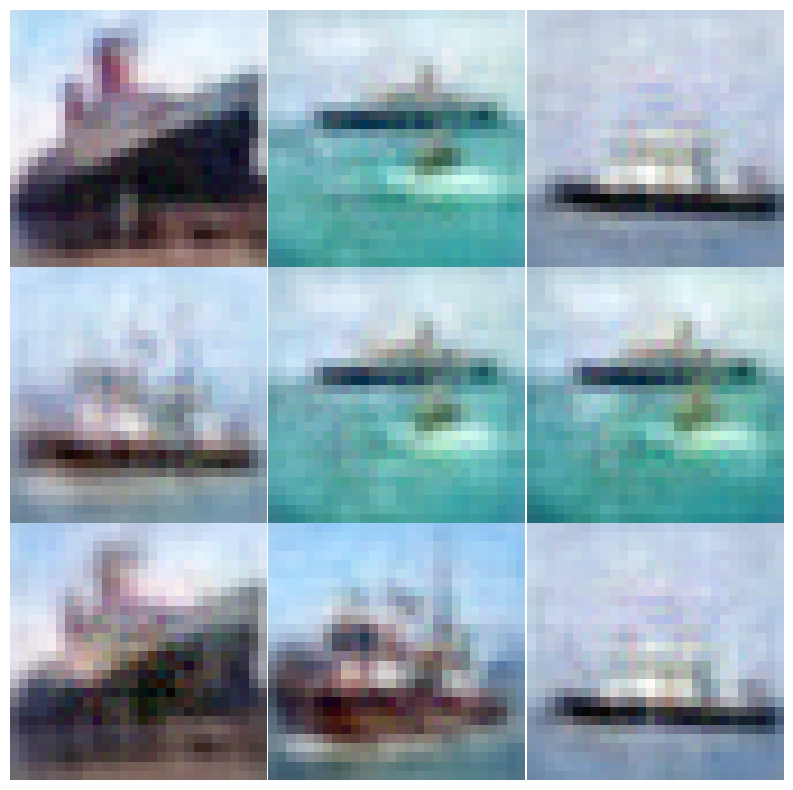

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


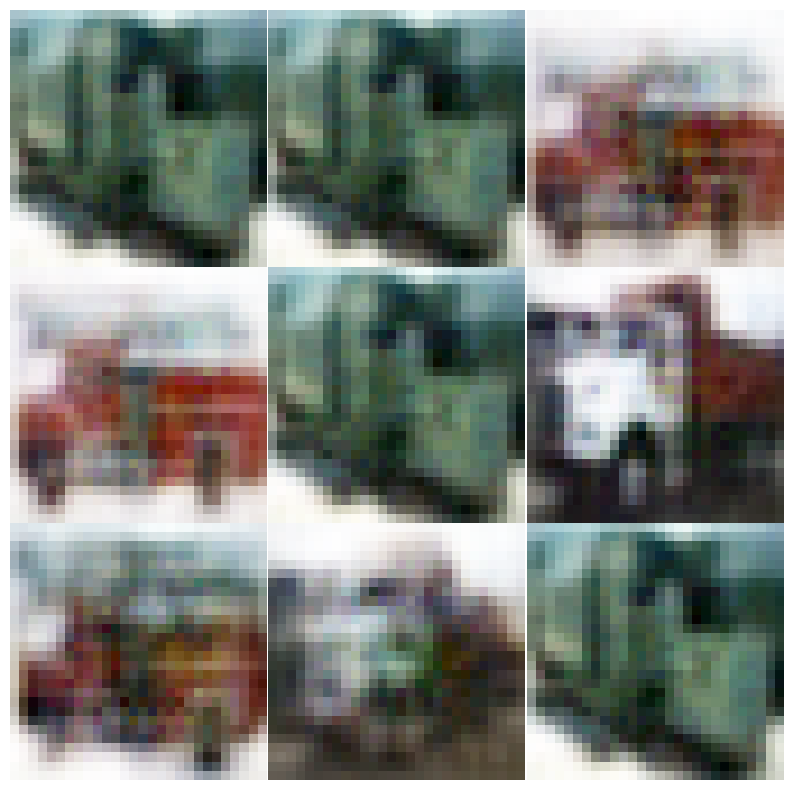

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
------ Plot Balanced Imgs ------


------------------------------
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.294060
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.291212
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.277762
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.239960
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.179110
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.041658
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.945506
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.831374
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.717606
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.678442
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.498800
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.700930
Train Epoch: 1 [13000/30000 (43%)]	Loss: 1.410528
Train Epoch: 1 [14000/30000 (47%)]	Loss: 1.113019
Train Epoch: 1 [15000/30000 (50%)]	Loss: 1.234048
Train Epoch: 1 [16000/30

In [15]:
args['epochs'] = 200 # how many epochs to run for (original used 200)

trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

# initial hyperparams
alpha_start = 0.95   # mostly MSE early
alpha_end   = 0.5    # balance later
tau_start   = 0.25   # soft early
tau_end     = 0.15   # sharper later
num_epochs  = 300    # example

def get_schedules(epoch):
    # linear scheduling
    alpha = alpha_start - (alpha_start - alpha_end) * (epoch / num_epochs)
    tau   = tau_start  - (tau_start  - tau_end)   * (epoch / num_epochs)
    return alpha, tau

temperature = 0.1      # SupCon temperature
alpha = 0.5

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)
    

    criterion2 = NTXentLoss(temperature=temperature).to(device)
    #criterion2 = SupConLoss().to(device)
    
    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0

            encoder.train()
            decoder.train()
            
            epoch_mse = 0.0
            epoch_contrast = 0.0
            #alpha = 1 - min(0.5, epoch / 200)             # weight for MSE vs contrastive loss (1-alpha)
            #alpha, tau = get_schedules(epoch)  # get schedules for alpha and tau
            #print(f"Alpha={alpha:.4f}, tau={tau:.4f}")
            
            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                images, labs = images.to(device), labs.to(device)
                labsn = labs.detach().cpu().numpy()

                # run images
                z_hat,class_hat = encoder(images,labsn)
                
                # sort z_hat and class_hat by labels
                sort_z_hat = [[] for _ in range(args['num_class'])]
                for i, label in enumerate(labsn):
                    sort_z_hat[label].append(z_hat[i].cpu().detach().numpy())

                # Check if sort_z_hat is empty
                z_hat_to_concat = []
                for tensor in sort_z_hat:
                    if len(tensor) != 0:
                        z_hat_to_concat.append(torch.tensor(tensor).to(device))
                        
                if z_hat_to_concat:
                    combined_z_hat = torch.cat(z_hat_to_concat, dim=0)
                    #print('combined_z_hat',combined_z_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_z_hat = torch.zeros((1, args['n_z'])).to(device)

                # Check if class_hat is empty
                class_hat_to_concat = []
                for tensor in class_hat:
                    if len(tensor) != 0:
                        class_hat_to_concat.append(tensor)
                if class_hat_to_concat:
                    combined_class_hat = torch.cat(class_hat_to_concat, dim=0)
                    #print('combined_class_hat',combined_class_hat.shape)
                else:
                    print('No valid tensors to concatenate, using zero tensor')
                    combined_class_hat = torch.zeros((1, args['n_z'])).to(device)

                # Combine the views using torch.stack()
                # `dim=1` places the new "views" dimension at the second position.
                
                # *Option* L2 normalization
                combined_z_hat = F.normalize(combined_z_hat, dim=1)
                combined_class_hat = F.normalize(combined_class_hat, dim=1)
                
                features = torch.stack([combined_z_hat, combined_class_hat], dim=1)
                # The new shape of the 'features' tensor is [100, 2, 300]
                #print(features.shape)
                
                mse2 = criterion2(combined_z_hat, combined_class_hat)
                
                
                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                # --- MSE loss ---
                mse = criterion(x_hat, images)
     
                # --- Combined loss ---
                comb_loss = alpha * mse + (1 - alpha) * mse2
                comb_loss.backward()
                
                # --- Step optimizers ---
                enc_optim.step()
                dec_optim.step()
                
                # accumulate for logging
                epoch_mse += mse.item() * images.size(0)
                epoch_contrast += mse2.item() * images.size(0)         

            # --- Log epoch losses ---
            avg_mse = epoch_mse / len(train_loader.dataset)
            avg_contrast = epoch_contrast / len(train_loader.dataset)
            avg_comb = avg_mse * alpha + avg_contrast * (1-alpha)
            print(f"Epoch {epoch}: MSE: {avg_mse:.4f}, Contrastive: {avg_contrast:.4f}, Combined: {avg_comb:.4f}")
            trainingDataset_loss.append(train_loss)
            
        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    import numpy as np
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    print('------ Plot Latent Space ------')
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    print('------------------------------')
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    import time
    import os
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) 
            print('class',yclass[0]) 
    
            #encode xclass to feature space
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) 

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    from sklearn.manifold import TSNE
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    # Load the training images and labels
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    print('------ Plot Balanced Imgs ------')

    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(dec_x)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    fig.show()
    
    print('------------------------------')

    #  IMPORT BALANCED IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    ###########################  TRAIN CNN  ####################################################
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    #set hyperparameters
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    ########################### TEST CNN ####################################################
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))

### Avg via folders

In [16]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

Average Accuracy: 0.8620066666666667
Average Sensitivity: 0.3100333333333333
Average Specificity: 0.9233370370370371
Average Precision: 0.4020275860349132

G-mean: 0.5350334336086303
F-measure: 0.34970681136502746

ACSA: 0.58602
[array([[723,  85,  50,  75,  53,   1,   2,   3,   7,   1],
       [153, 784,   8,  19,  29,   1,   1,   2,   1,   2],
       [124,  44, 283, 180, 348,   6,   6,   7,   1,   1],
       [ 89,  72,  68, 599, 147,   8,   4,   8,   4,   1],
       [111,  42,  65, 134, 633,   1,   6,   3,   5,   0],
       [ 70,  54,  96, 552, 196,  22,   5,   4,   1,   0],
       [ 71,  76,  39, 366, 410,   4,  32,   2,   0,   0],
       [230,  45, 104, 196, 398,   7,   0,  15,   5,   0],
       [550, 257,  50,  78,  49,   0,   2,   1,  13,   0],
       [263, 542,  29,  89,  52,   3,   1,   8,   5,   8]]), array([[761, 142,  36,  41,  17,   1,   0,   1,   1,   0],
       [ 80, 852,   7,  42,  13,   0,   1,   1,   4,   0],
       [177,  59, 378, 231, 148,   4,   0,   3,   0,   0],
 

## Traning - Gen - Evalution (L2)


Start...
cuda


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 0 	Train Loss: 13.295158 	mse loss: 13.212973 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 1 	Train Loss: 3.508058 	mse loss: 3.396401 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 2 	Train Loss: 2.423387 	mse loss: 2.302461 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 3 	Train Loss: 1.991488 	mse loss: 1.876402 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 4 	Train Loss: 1.721587 	mse loss: 1.608582 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 5 	Train Loss: 1.537564 	mse loss: 1.422944 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 6 	Train Loss: 1.433985 	mse loss: 1.333201 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 7 	Train Loss: 1.333814 	mse loss: 1.232346 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 8 	Train Loss: 1.248963 	mse loss: 1.149546 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 9 	Train Loss: 1.182288 	mse loss: 1.084202 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 10 	Train Loss: 1.141391 	mse loss: 1.045976 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 11 	Train Loss: 1.078136 	mse loss: 0.981479 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 12 	Train Loss: 1.021760 	mse loss: 0.924592 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 13 	Train Loss: 1.004002 	mse loss: 0.912598 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 14 	Train Loss: 0.976070 	mse loss: 0.885290 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 15 	Train Loss: 0.950678 	mse loss: 0.860457 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 16 	Train Loss: 0.929882 	mse loss: 0.839333 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 17 	Train Loss: 0.899133 	mse loss: 0.808447 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 18 	Train Loss: 0.856291 	mse loss: 0.769748 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 19 	Train Loss: 0.835369 	mse loss: 0.751635 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 20 	Train Loss: 0.819167 	mse loss: 0.730994 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 21 	Train Loss: 0.793906 	mse loss: 0.709231 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 22 	Train Loss: 0.769208 	mse loss: 0.684138 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 23 	Train Loss: 0.783272 	mse loss: 0.698067 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 24 	Train Loss: 0.782687 	mse loss: 0.699014 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 25 	Train Loss: 0.772124 	mse loss: 0.683402 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 26 	Train Loss: 0.731898 	mse loss: 0.643277 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 27 	Train Loss: 0.729040 	mse loss: 0.644692 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 28 	Train Loss: 0.698854 	mse loss: 0.619710 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 29 	Train Loss: 0.685840 	mse loss: 0.605135 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 30 	Train Loss: 0.680155 	mse loss: 0.601395 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 31 	Train Loss: 0.663563 	mse loss: 0.586158 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 32 	Train Loss: 0.662717 	mse loss: 0.582771 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 33 	Train Loss: 0.648764 	mse loss: 0.569592 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 34 	Train Loss: 0.660528 	mse loss: 0.580020 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 35 	Train Loss: 0.644707 	mse loss: 0.565244 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 36 	Train Loss: 0.621532 	mse loss: 0.546593 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 37 	Train Loss: 0.646531 	mse loss: 0.563648 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 38 	Train Loss: 0.606874 	mse loss: 0.531454 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 39 	Train Loss: 0.609359 	mse loss: 0.529830 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 40 	Train Loss: 0.597787 	mse loss: 0.518711 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 41 	Train Loss: 0.590769 	mse loss: 0.513810 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 42 	Train Loss: 0.587034 	mse loss: 0.505464 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 43 	Train Loss: 0.561291 	mse loss: 0.490786 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 44 	Train Loss: 0.554077 	mse loss: 0.476540 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 45 	Train Loss: 0.560904 	mse loss: 0.481875 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 46 	Train Loss: 0.568202 	mse loss: 0.486397 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 47 	Train Loss: 0.539460 	mse loss: 0.463770 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 48 	Train Loss: 0.552095 	mse loss: 0.472531 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 49 	Train Loss: 0.543754 	mse loss: 0.465317 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 50 	Train Loss: 0.520712 	mse loss: 0.456418 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 51 	Train Loss: 0.520197 	mse loss: 0.443900 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 52 	Train Loss: 0.529138 	mse loss: 0.450518 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 53 	Train Loss: 0.509539 	mse loss: 0.431206 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 54 	Train Loss: 0.512048 	mse loss: 0.434977 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 55 	Train Loss: 0.502999 	mse loss: 0.426976 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 56 	Train Loss: 0.532970 	mse loss: 0.459477 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 57 	Train Loss: 0.502342 	mse loss: 0.424041 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 58 	Train Loss: 0.496573 	mse loss: 0.425274 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 59 	Train Loss: 0.493204 	mse loss: 0.417850 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 60 	Train Loss: 0.474154 	mse loss: 0.404554 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 61 	Train Loss: 0.479103 	mse loss: 0.402055 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 62 	Train Loss: 0.471671 	mse loss: 0.393295 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 63 	Train Loss: 0.463693 	mse loss: 0.389387 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 64 	Train Loss: 0.479402 	mse loss: 0.404801 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 65 	Train Loss: 0.448883 	mse loss: 0.374765 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 66 	Train Loss: 0.454310 	mse loss: 0.377710 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 67 	Train Loss: 0.457531 	mse loss: 0.379101 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 68 	Train Loss: 0.457903 	mse loss: 0.383840 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 69 	Train Loss: 0.470324 	mse loss: 0.393958 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 70 	Train Loss: 0.454027 	mse loss: 0.376740 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 71 	Train Loss: 0.448324 	mse loss: 0.369791 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 72 	Train Loss: 0.451799 	mse loss: 0.375772 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 73 	Train Loss: 0.441643 	mse loss: 0.369752 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 74 	Train Loss: 0.429991 	mse loss: 0.353294 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 75 	Train Loss: 0.423016 	mse loss: 0.350832 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 76 	Train Loss: 0.430842 	mse loss: 0.357161 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 77 	Train Loss: 0.412839 	mse loss: 0.336683 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 78 	Train Loss: 0.403141 	mse loss: 0.334999 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 79 	Train Loss: 0.409677 	mse loss: 0.338857 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 80 	Train Loss: 0.406256 	mse loss: 0.332866 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 81 	Train Loss: 0.399272 	mse loss: 0.328456 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 82 	Train Loss: 0.396896 	mse loss: 0.323511 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 83 	Train Loss: 0.391123 	mse loss: 0.319584 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 84 	Train Loss: 0.395365 	mse loss: 0.321957 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 85 	Train Loss: 0.398137 	mse loss: 0.321836 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 86 	Train Loss: 0.406754 	mse loss: 0.335561 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 87 	Train Loss: 0.391152 	mse loss: 0.319454 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 88 	Train Loss: 0.384820 	mse loss: 0.311077 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 89 	Train Loss: 0.381723 	mse loss: 0.306467 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 90 	Train Loss: 0.367679 	mse loss: 0.295149 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 91 	Train Loss: 0.378738 	mse loss: 0.308242 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 92 	Train Loss: 0.389275 	mse loss: 0.312506 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 93 	Train Loss: 0.380330 	mse loss: 0.310230 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 94 	Train Loss: 0.367058 	mse loss: 0.297167 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 95 	Train Loss: 0.360334 	mse loss: 0.287119 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 96 	Train Loss: 0.361527 	mse loss: 0.289054 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 97 	Train Loss: 0.356518 	mse loss: 0.286387 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 98 	Train Loss: 0.360044 	mse loss: 0.290189 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 99 	Train Loss: 0.360039 	mse loss: 0.286829 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 100 	Train Loss: 0.391308 	mse loss: 0.319620 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 101 	Train Loss: 0.349183 	mse loss: 0.275880 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 102 	Train Loss: 0.349808 	mse loss: 0.276137 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 103 	Train Loss: 0.349204 	mse loss: 0.277375 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 104 	Train Loss: 0.333295 	mse loss: 0.264674 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 105 	Train Loss: 0.349924 	mse loss: 0.277260 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 106 	Train Loss: 0.338496 	mse loss: 0.266122 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 107 	Train Loss: 0.339587 	mse loss: 0.268398 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 108 	Train Loss: 0.326986 	mse loss: 0.255314 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 109 	Train Loss: 0.330563 	mse loss: 0.260018 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 110 	Train Loss: 0.312859 	mse loss: 0.244012 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 111 	Train Loss: 0.340103 	mse loss: 0.267310 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 112 	Train Loss: 0.331613 	mse loss: 0.261013 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 113 	Train Loss: 0.325906 	mse loss: 0.256254 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 114 	Train Loss: 0.324431 	mse loss: 0.252227 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 115 	Train Loss: 0.319017 	mse loss: 0.252524 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 116 	Train Loss: 0.324282 	mse loss: 0.254224 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 117 	Train Loss: 0.316431 	mse loss: 0.250224 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 118 	Train Loss: 0.303235 	mse loss: 0.234879 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 119 	Train Loss: 0.309669 	mse loss: 0.243612 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 120 	Train Loss: 0.311250 	mse loss: 0.240858 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 121 	Train Loss: 0.312448 	mse loss: 0.244811 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 122 	Train Loss: 0.300186 	mse loss: 0.231843 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 123 	Train Loss: 0.307986 	mse loss: 0.235855 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 124 	Train Loss: 0.304400 	mse loss: 0.232076 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 125 	Train Loss: 0.303672 	mse loss: 0.236347 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 126 	Train Loss: 0.301585 	mse loss: 0.237030 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 127 	Train Loss: 0.299094 	mse loss: 0.229916 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 128 	Train Loss: 0.300801 	mse loss: 0.227998 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 129 	Train Loss: 0.286545 	mse loss: 0.217696 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 130 	Train Loss: 0.295697 	mse loss: 0.226396 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 131 	Train Loss: 0.289562 	mse loss: 0.223131 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 132 	Train Loss: 0.292185 	mse loss: 0.224479 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 133 	Train Loss: 0.298001 	mse loss: 0.226847 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 134 	Train Loss: 0.295026 	mse loss: 0.226895 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 135 	Train Loss: 0.294776 	mse loss: 0.223933 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 136 	Train Loss: 0.281214 	mse loss: 0.211567 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 137 	Train Loss: 0.289023 	mse loss: 0.222492 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 138 	Train Loss: 0.300748 	mse loss: 0.231701 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 139 	Train Loss: 0.279299 	mse loss: 0.211669 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 140 	Train Loss: 0.278449 	mse loss: 0.211205 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 141 	Train Loss: 0.266090 	mse loss: 0.197322 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 142 	Train Loss: 0.281341 	mse loss: 0.211736 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 143 	Train Loss: 0.276175 	mse loss: 0.210282 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 144 	Train Loss: 0.278995 	mse loss: 0.211556 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 145 	Train Loss: 0.265694 	mse loss: 0.200595 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 146 	Train Loss: 0.264839 	mse loss: 0.195834 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 147 	Train Loss: 0.282477 	mse loss: 0.213490 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 148 	Train Loss: 0.277508 	mse loss: 0.209913 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 149 	Train Loss: 0.265536 	mse loss: 0.201141 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 150 	Train Loss: 0.273858 	mse loss: 0.204338 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 151 	Train Loss: 0.264872 	mse loss: 0.199388 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 152 	Train Loss: 0.267195 	mse loss: 0.198549 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 153 	Train Loss: 0.259684 	mse loss: 0.192256 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 154 	Train Loss: 0.259921 	mse loss: 0.193684 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 155 	Train Loss: 0.252684 	mse loss: 0.185700 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 156 	Train Loss: 0.251221 	mse loss: 0.185177 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 157 	Train Loss: 0.251138 	mse loss: 0.186000 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 158 	Train Loss: 0.256517 	mse loss: 0.189060 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 159 	Train Loss: 0.254531 	mse loss: 0.185940 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 160 	Train Loss: 0.273730 	mse loss: 0.209771 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 161 	Train Loss: 0.269429 	mse loss: 0.201412 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 162 	Train Loss: 0.261469 	mse loss: 0.194788 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 163 	Train Loss: 0.252390 	mse loss: 0.187449 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 164 	Train Loss: 0.250840 	mse loss: 0.183051 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 165 	Train Loss: 0.245987 	mse loss: 0.178803 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 166 	Train Loss: 0.252751 	mse loss: 0.189244 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 167 	Train Loss: 0.247697 	mse loss: 0.182531 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 168 	Train Loss: 0.246167 	mse loss: 0.183892 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 169 	Train Loss: 0.247653 	mse loss: 0.184689 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 170 	Train Loss: 0.246902 	mse loss: 0.179003 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 171 	Train Loss: 0.245204 	mse loss: 0.179542 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 172 	Train Loss: 0.257146 	mse loss: 0.191128 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 173 	Train Loss: 0.250057 	mse loss: 0.181441 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 174 	Train Loss: 0.233648 	mse loss: 0.166727 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 175 	Train Loss: 0.233958 	mse loss: 0.170084 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 176 	Train Loss: 0.233338 	mse loss: 0.166751 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 177 	Train Loss: 0.241015 	mse loss: 0.174287 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 178 	Train Loss: 0.238751 	mse loss: 0.172777 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 179 	Train Loss: 0.243172 	mse loss: 0.176078 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 180 	Train Loss: 0.237059 	mse loss: 0.173490 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 181 	Train Loss: 0.239562 	mse loss: 0.171659 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 182 	Train Loss: 0.238814 	mse loss: 0.171546 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 183 	Train Loss: 0.234481 	mse loss: 0.168241 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 184 	Train Loss: 0.232404 	mse loss: 0.164983 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 185 	Train Loss: 0.243860 	mse loss: 0.176366 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 186 	Train Loss: 0.234830 	mse loss: 0.167312 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 187 	Train Loss: 0.226214 	mse loss: 0.162171 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 188 	Train Loss: 0.232603 	mse loss: 0.164841 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 189 	Train Loss: 0.239766 	mse loss: 0.173082 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 190 	Train Loss: 0.231504 	mse loss: 0.170200 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 191 	Train Loss: 0.230870 	mse loss: 0.167786 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 192 	Train Loss: 0.229959 	mse loss: 0.161398 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 193 	Train Loss: 0.227894 	mse loss: 0.161462 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 194 	Train Loss: 0.227449 	mse loss: 0.159203 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 195 	Train Loss: 0.224396 	mse loss: 0.160682 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 196 	Train Loss: 0.219097 	mse loss: 0.155881 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 197 	Train Loss: 0.226136 	mse loss: 0.162849 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 198 	Train Loss: 0.217483 	mse loss: 0.154424 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 199 	Train Loss: 0.228885 	mse loss: 0.164598 	mse2 loss: 0.000000
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 83.71


0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


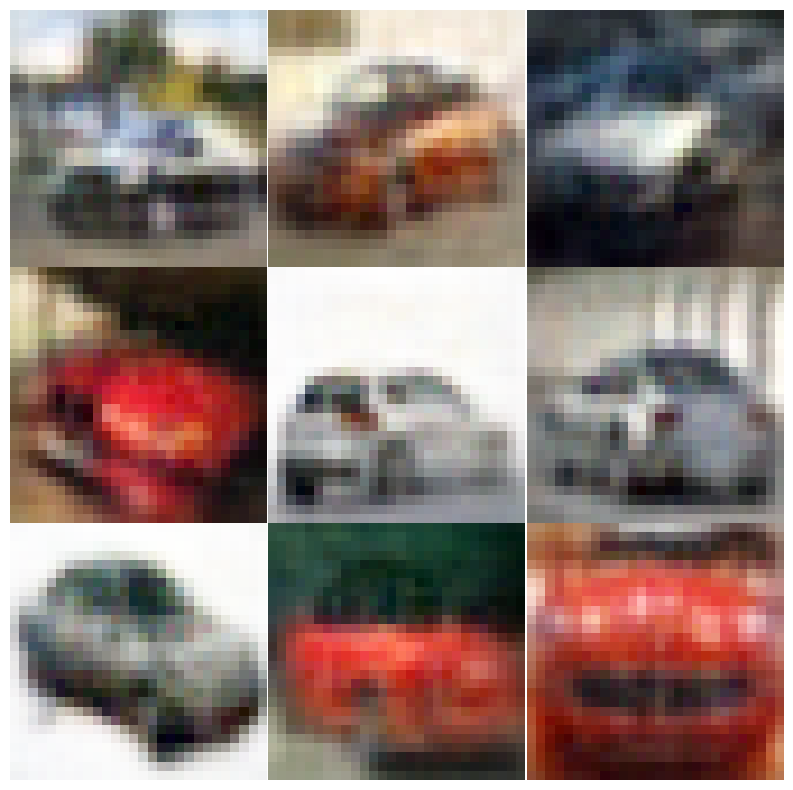

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


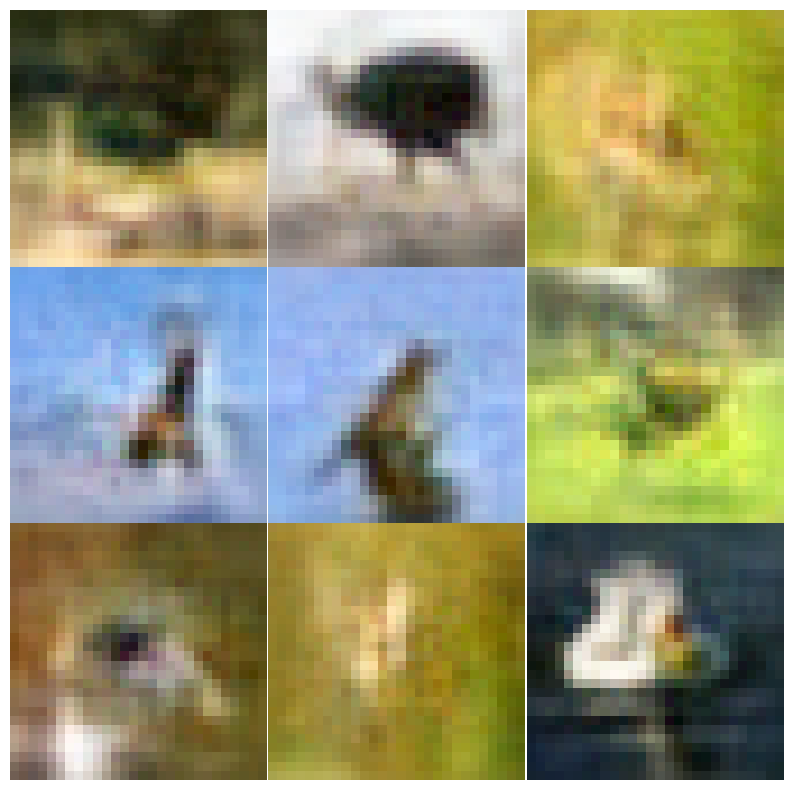

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


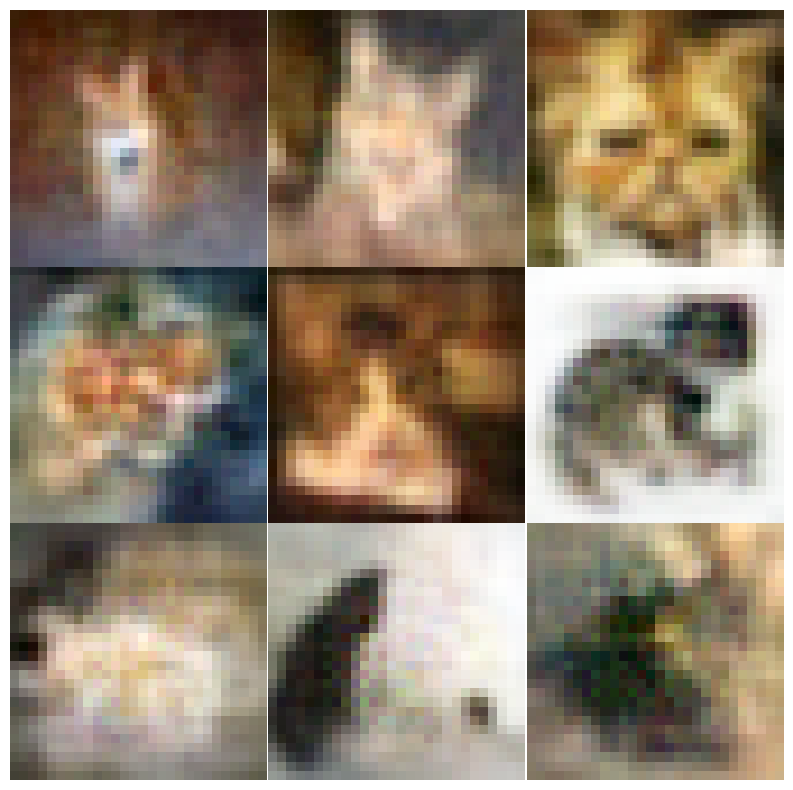

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


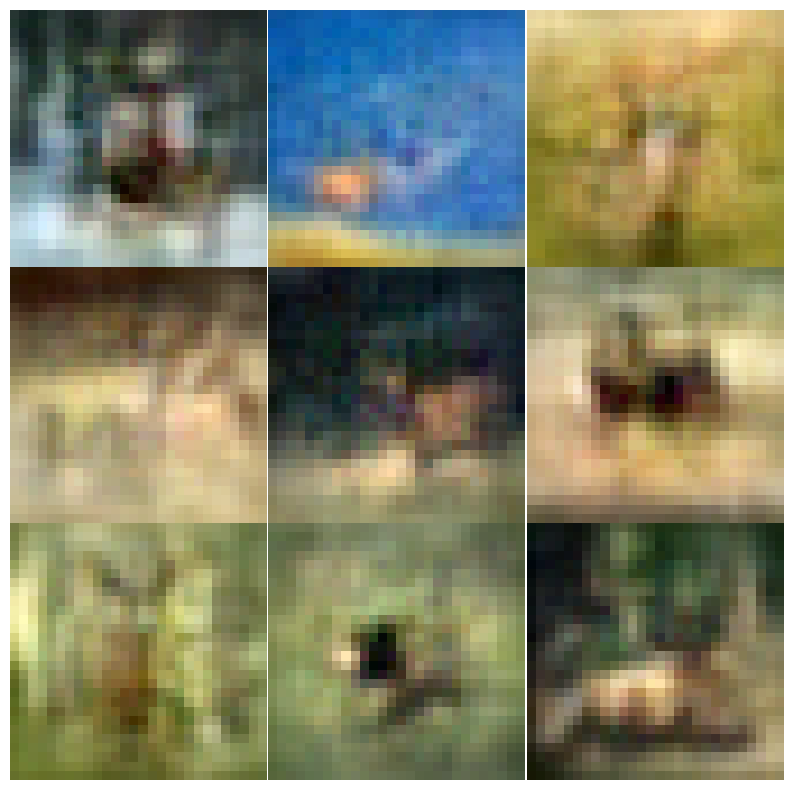

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


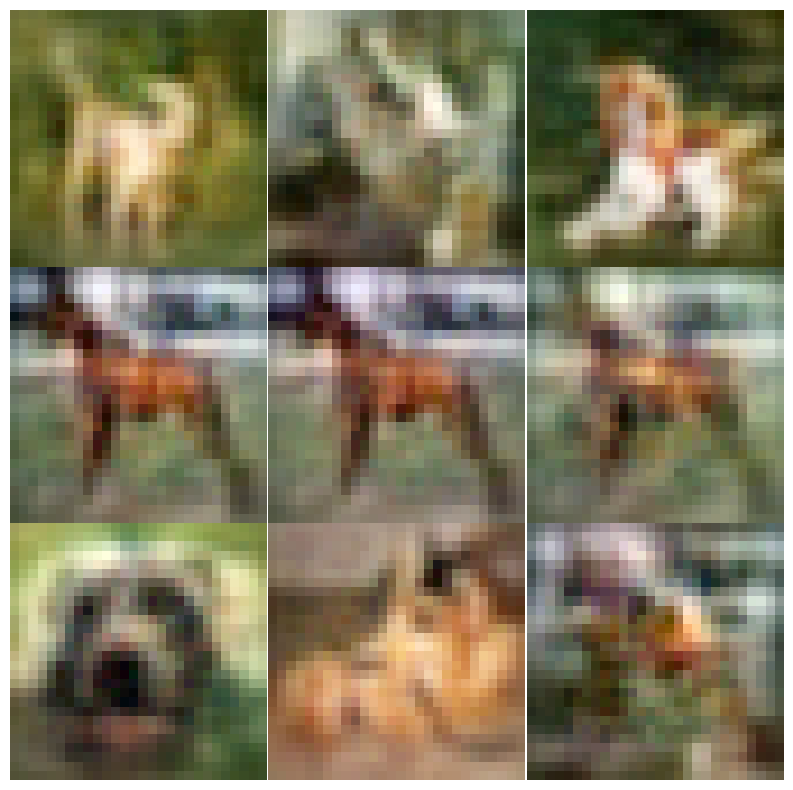

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


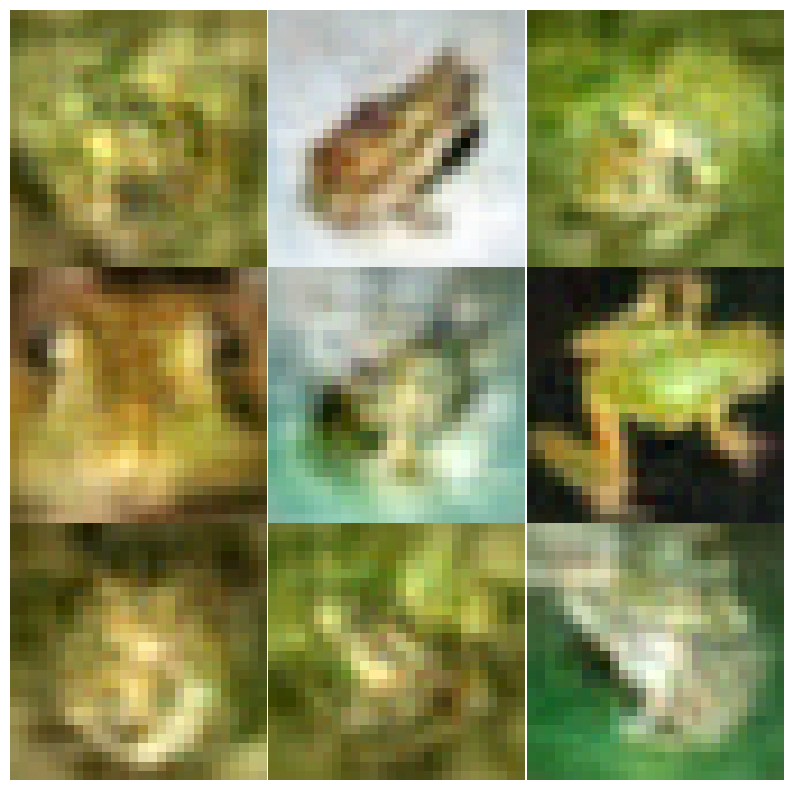

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


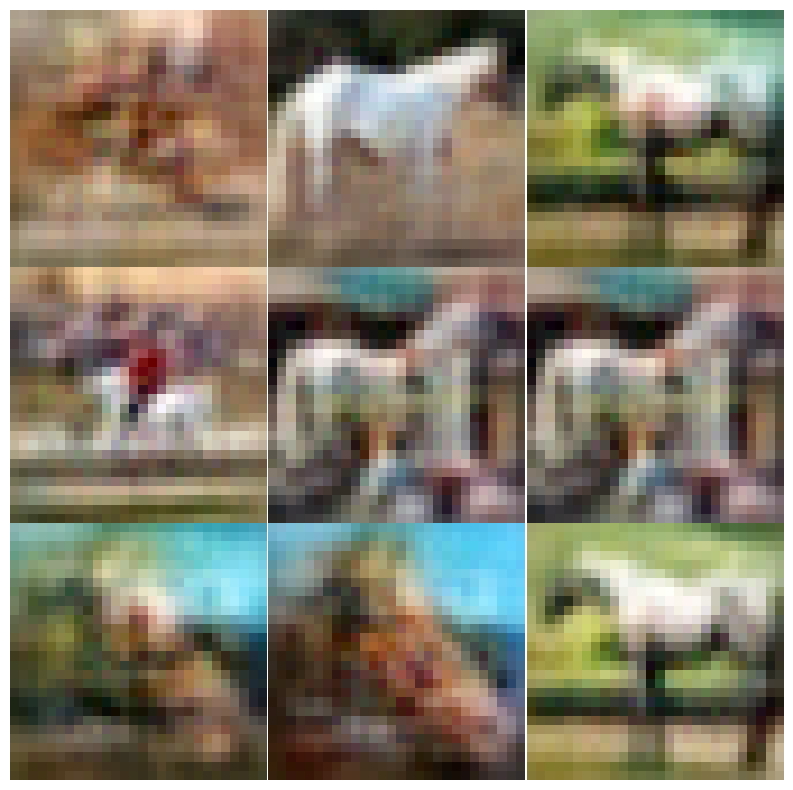

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


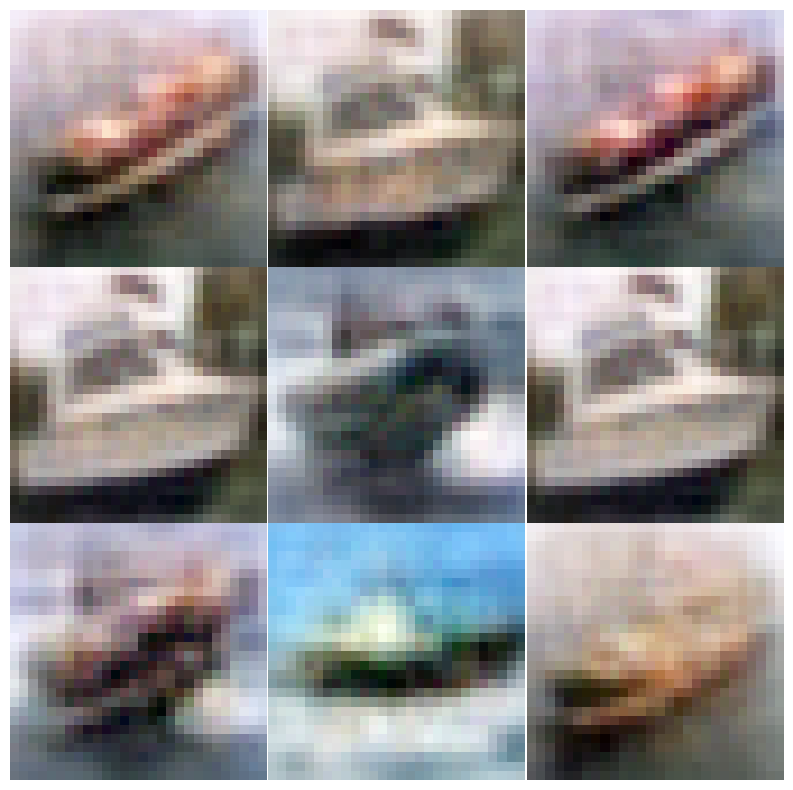

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


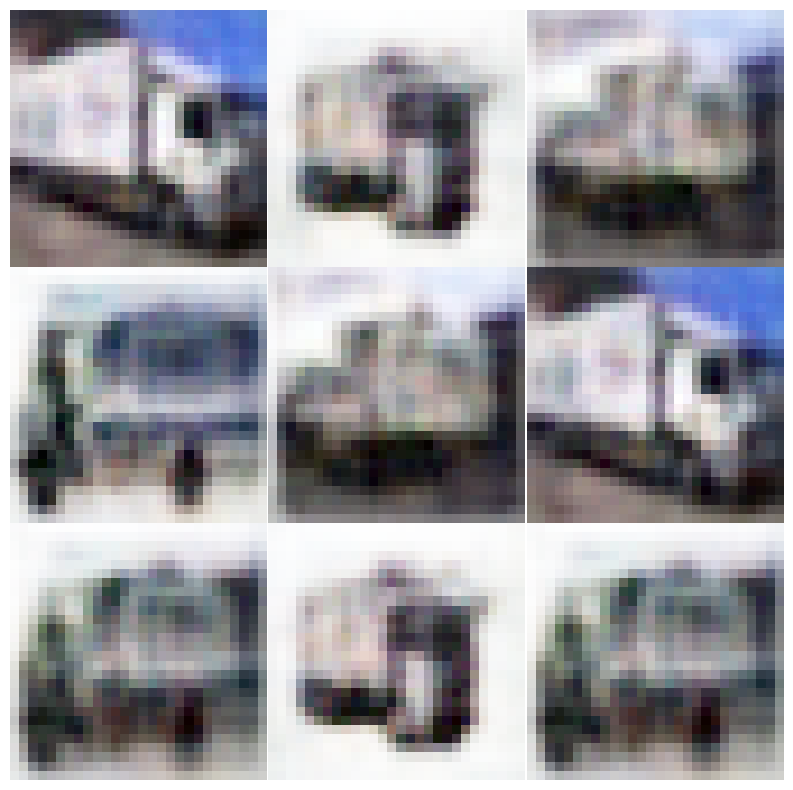

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.282711
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.285541
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.263516
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.222710
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.104244
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.043164
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.979654
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.806501
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.838233
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.727934
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.616915
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.374763
Tr

Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 0 	Train Loss: 8.684250 	mse loss: 8.588470 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 1 	Train Loss: 3.165306 	mse loss: 3.062234 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 2 	Train Loss: 2.216062 	mse loss: 2.101854 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 3 	Train Loss: 1.818666 	mse loss: 1.706452 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 4 	Train Loss: 1.583571 	mse loss: 1.473958 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 5 	Train Loss: 1.458529 	mse loss: 1.353763 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 6 	Train Loss: 1.338982 	mse loss: 1.240800 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 7 	Train Loss: 1.234754 	mse loss: 1.146306 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 8 	Train Loss: 1.175730 	mse loss: 1.076592 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 9 	Train Loss: 1.162114 	mse loss: 1.065941 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 10 	Train Loss: 1.071718 	mse loss: 0.978112 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 11 	Train Loss: 1.036879 	mse loss: 0.942058 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 12 	Train Loss: 0.997458 	mse loss: 0.908283 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 13 	Train Loss: 0.964457 	mse loss: 0.874289 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 14 	Train Loss: 0.931416 	mse loss: 0.844703 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 15 	Train Loss: 0.909105 	mse loss: 0.824180 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 16 	Train Loss: 0.892158 	mse loss: 0.802332 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 17 	Train Loss: 0.855475 	mse loss: 0.770431 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 18 	Train Loss: 0.839332 	mse loss: 0.761011 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 19 	Train Loss: 0.812908 	mse loss: 0.728380 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 20 	Train Loss: 0.805357 	mse loss: 0.722311 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 21 	Train Loss: 0.790928 	mse loss: 0.706638 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 22 	Train Loss: 0.787451 	mse loss: 0.703552 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 23 	Train Loss: 0.749566 	mse loss: 0.666037 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 24 	Train Loss: 0.718749 	mse loss: 0.641912 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 25 	Train Loss: 0.717364 	mse loss: 0.632510 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 26 	Train Loss: 0.708339 	mse loss: 0.626665 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 27 	Train Loss: 0.709012 	mse loss: 0.624683 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 28 	Train Loss: 0.681020 	mse loss: 0.600474 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 29 	Train Loss: 0.681403 	mse loss: 0.603801 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 30 	Train Loss: 0.663164 	mse loss: 0.582486 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 31 	Train Loss: 0.649896 	mse loss: 0.569040 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 32 	Train Loss: 0.651242 	mse loss: 0.571143 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 33 	Train Loss: 0.662979 	mse loss: 0.584454 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 34 	Train Loss: 0.636168 	mse loss: 0.558955 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 35 	Train Loss: 0.625581 	mse loss: 0.544419 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 36 	Train Loss: 0.598693 	mse loss: 0.522060 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 37 	Train Loss: 0.607316 	mse loss: 0.531311 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 38 	Train Loss: 0.587602 	mse loss: 0.506596 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 39 	Train Loss: 0.578186 	mse loss: 0.497472 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 40 	Train Loss: 0.586786 	mse loss: 0.507844 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 41 	Train Loss: 0.573969 	mse loss: 0.495598 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 42 	Train Loss: 0.563166 	mse loss: 0.485209 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 43 	Train Loss: 0.556970 	mse loss: 0.476258 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 44 	Train Loss: 0.551588 	mse loss: 0.474568 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 45 	Train Loss: 0.539786 	mse loss: 0.462885 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 46 	Train Loss: 0.533221 	mse loss: 0.458212 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 47 	Train Loss: 0.530896 	mse loss: 0.455727 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 48 	Train Loss: 0.522808 	mse loss: 0.446996 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 49 	Train Loss: 0.538949 	mse loss: 0.459995 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 50 	Train Loss: 0.524108 	mse loss: 0.448211 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 51 	Train Loss: 0.503567 	mse loss: 0.426758 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 52 	Train Loss: 0.513598 	mse loss: 0.438367 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 53 	Train Loss: 0.501069 	mse loss: 0.425425 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 54 	Train Loss: 0.488906 	mse loss: 0.413948 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 55 	Train Loss: 0.483916 	mse loss: 0.407338 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 56 	Train Loss: 0.494847 	mse loss: 0.419877 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 57 	Train Loss: 0.484574 	mse loss: 0.406490 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 58 	Train Loss: 0.469451 	mse loss: 0.398394 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 59 	Train Loss: 0.481679 	mse loss: 0.403828 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 60 	Train Loss: 0.469577 	mse loss: 0.397387 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 61 	Train Loss: 0.452463 	mse loss: 0.376570 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 62 	Train Loss: 0.457339 	mse loss: 0.383914 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 63 	Train Loss: 0.443384 	mse loss: 0.372863 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 64 	Train Loss: 0.437491 	mse loss: 0.362689 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 65 	Train Loss: 0.448414 	mse loss: 0.373117 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 66 	Train Loss: 0.437020 	mse loss: 0.362968 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 67 	Train Loss: 0.421630 	mse loss: 0.345461 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 68 	Train Loss: 0.422399 	mse loss: 0.350097 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 69 	Train Loss: 0.440898 	mse loss: 0.365234 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 70 	Train Loss: 0.422110 	mse loss: 0.348542 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 71 	Train Loss: 0.421867 	mse loss: 0.349972 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 72 	Train Loss: 0.434559 	mse loss: 0.362522 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 73 	Train Loss: 0.414909 	mse loss: 0.342294 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 74 	Train Loss: 0.409802 	mse loss: 0.335366 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 75 	Train Loss: 0.404061 	mse loss: 0.330501 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 76 	Train Loss: 0.404966 	mse loss: 0.328186 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 77 	Train Loss: 0.396300 	mse loss: 0.322421 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 78 	Train Loss: 0.395669 	mse loss: 0.322112 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 79 	Train Loss: 0.380814 	mse loss: 0.309184 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 80 	Train Loss: 0.381890 	mse loss: 0.310006 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 81 	Train Loss: 0.396213 	mse loss: 0.324266 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 82 	Train Loss: 0.387112 	mse loss: 0.315855 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 83 	Train Loss: 0.367884 	mse loss: 0.297133 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 84 	Train Loss: 0.370000 	mse loss: 0.297841 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 85 	Train Loss: 0.382187 	mse loss: 0.307303 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 86 	Train Loss: 0.383917 	mse loss: 0.310016 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 87 	Train Loss: 0.351859 	mse loss: 0.286205 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 88 	Train Loss: 0.358795 	mse loss: 0.287002 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 89 	Train Loss: 0.356756 	mse loss: 0.285491 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 90 	Train Loss: 0.357429 	mse loss: 0.292077 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 91 	Train Loss: 0.359204 	mse loss: 0.285843 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 92 	Train Loss: 0.371850 	mse loss: 0.300509 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 93 	Train Loss: 0.362308 	mse loss: 0.290219 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 94 	Train Loss: 0.345495 	mse loss: 0.275995 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 95 	Train Loss: 0.343315 	mse loss: 0.272739 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 96 	Train Loss: 0.411786 	mse loss: 0.335955 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 97 	Train Loss: 0.364574 	mse loss: 0.289380 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 98 	Train Loss: 0.335626 	mse loss: 0.267067 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 99 	Train Loss: 0.345550 	mse loss: 0.276208 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 100 	Train Loss: 0.325517 	mse loss: 0.255293 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 101 	Train Loss: 0.341536 	mse loss: 0.269577 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 102 	Train Loss: 0.334069 	mse loss: 0.261448 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 103 	Train Loss: 0.324963 	mse loss: 0.250128 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 104 	Train Loss: 0.321079 	mse loss: 0.248895 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 105 	Train Loss: 0.320241 	mse loss: 0.250228 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 106 	Train Loss: 0.333468 	mse loss: 0.265433 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 107 	Train Loss: 0.321420 	mse loss: 0.251385 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 108 	Train Loss: 0.311553 	mse loss: 0.238377 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 109 	Train Loss: 0.319923 	mse loss: 0.252774 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 110 	Train Loss: 0.310472 	mse loss: 0.242098 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 111 	Train Loss: 0.312065 	mse loss: 0.241348 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 112 	Train Loss: 0.327242 	mse loss: 0.257476 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 113 	Train Loss: 0.306743 	mse loss: 0.240524 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 114 	Train Loss: 0.315164 	mse loss: 0.245790 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 115 	Train Loss: 0.301968 	mse loss: 0.235484 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 116 	Train Loss: 0.301145 	mse loss: 0.231455 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 117 	Train Loss: 0.292428 	mse loss: 0.227498 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 118 	Train Loss: 0.307065 	mse loss: 0.234448 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 119 	Train Loss: 0.299349 	mse loss: 0.230958 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 120 	Train Loss: 0.308440 	mse loss: 0.236968 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 121 	Train Loss: 0.292205 	mse loss: 0.224291 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 122 	Train Loss: 0.295625 	mse loss: 0.227471 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 123 	Train Loss: 0.301143 	mse loss: 0.232193 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 124 	Train Loss: 0.301638 	mse loss: 0.233477 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 125 	Train Loss: 0.290206 	mse loss: 0.222364 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 126 	Train Loss: 0.286489 	mse loss: 0.215279 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 127 	Train Loss: 0.282365 	mse loss: 0.210843 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 128 	Train Loss: 0.284819 	mse loss: 0.216549 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 129 	Train Loss: 0.270313 	mse loss: 0.202193 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 130 	Train Loss: 0.283591 	mse loss: 0.215661 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 131 	Train Loss: 0.282752 	mse loss: 0.213959 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 132 	Train Loss: 0.277619 	mse loss: 0.214517 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 133 	Train Loss: 0.275853 	mse loss: 0.207705 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 134 	Train Loss: 0.278126 	mse loss: 0.209914 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 135 	Train Loss: 0.282904 	mse loss: 0.216477 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 136 	Train Loss: 0.274271 	mse loss: 0.206717 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 137 	Train Loss: 0.276930 	mse loss: 0.211072 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 138 	Train Loss: 0.279733 	mse loss: 0.209800 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 139 	Train Loss: 0.268300 	mse loss: 0.197441 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 140 	Train Loss: 0.275050 	mse loss: 0.207199 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 141 	Train Loss: 0.273923 	mse loss: 0.208876 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 142 	Train Loss: 0.265571 	mse loss: 0.199926 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 143 	Train Loss: 0.266406 	mse loss: 0.197154 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 144 	Train Loss: 0.257539 	mse loss: 0.190817 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 145 	Train Loss: 0.264756 	mse loss: 0.198746 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 146 	Train Loss: 0.258303 	mse loss: 0.192286 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 147 	Train Loss: 0.264238 	mse loss: 0.198576 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 148 	Train Loss: 0.253674 	mse loss: 0.189754 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 149 	Train Loss: 0.260105 	mse loss: 0.193677 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 150 	Train Loss: 0.256193 	mse loss: 0.191657 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 151 	Train Loss: 0.256743 	mse loss: 0.190638 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 152 	Train Loss: 0.252398 	mse loss: 0.184759 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 153 	Train Loss: 0.253173 	mse loss: 0.183117 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 154 	Train Loss: 0.259415 	mse loss: 0.190488 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 155 	Train Loss: 0.249010 	mse loss: 0.186934 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 156 	Train Loss: 0.245462 	mse loss: 0.176770 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 157 	Train Loss: 0.253418 	mse loss: 0.185881 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 158 	Train Loss: 0.250331 	mse loss: 0.183617 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 159 	Train Loss: 0.256957 	mse loss: 0.190995 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 160 	Train Loss: 0.250411 	mse loss: 0.184565 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 161 	Train Loss: 0.250691 	mse loss: 0.186421 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 162 	Train Loss: 0.247675 	mse loss: 0.181905 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 163 	Train Loss: 0.254572 	mse loss: 0.186925 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 164 	Train Loss: 0.250207 	mse loss: 0.186715 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 165 	Train Loss: 0.252838 	mse loss: 0.185281 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 166 	Train Loss: 0.237368 	mse loss: 0.170888 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 167 	Train Loss: 0.241576 	mse loss: 0.174195 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 168 	Train Loss: 0.241394 	mse loss: 0.174313 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 169 	Train Loss: 0.237681 	mse loss: 0.173821 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 170 	Train Loss: 0.238338 	mse loss: 0.171839 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 171 	Train Loss: 0.237039 	mse loss: 0.171568 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 172 	Train Loss: 0.240567 	mse loss: 0.175612 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 173 	Train Loss: 0.234812 	mse loss: 0.169933 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 174 	Train Loss: 0.248520 	mse loss: 0.182414 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 175 	Train Loss: 0.231472 	mse loss: 0.166349 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 176 	Train Loss: 0.236284 	mse loss: 0.170308 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 177 	Train Loss: 0.233334 	mse loss: 0.168775 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 178 	Train Loss: 0.232421 	mse loss: 0.166501 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 179 	Train Loss: 0.247216 	mse loss: 0.181075 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 180 	Train Loss: 0.234949 	mse loss: 0.172663 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 181 	Train Loss: 0.226756 	mse loss: 0.164431 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 182 	Train Loss: 0.226159 	mse loss: 0.163623 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 183 	Train Loss: 0.232962 	mse loss: 0.164594 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 184 	Train Loss: 0.231522 	mse loss: 0.170015 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 185 	Train Loss: 0.236482 	mse loss: 0.169362 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 186 	Train Loss: 0.220728 	mse loss: 0.156681 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 187 	Train Loss: 0.227735 	mse loss: 0.163177 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 188 	Train Loss: 0.220391 	mse loss: 0.156195 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 189 	Train Loss: 0.221655 	mse loss: 0.157866 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 190 	Train Loss: 0.216913 	mse loss: 0.156323 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 191 	Train Loss: 0.229000 	mse loss: 0.164992 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 192 	Train Loss: 0.230302 	mse loss: 0.165441 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 193 	Train Loss: 0.223010 	mse loss: 0.157938 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 194 	Train Loss: 0.220469 	mse loss: 0.155443 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 195 	Train Loss: 0.221325 	mse loss: 0.155151 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 196 	Train Loss: 0.222710 	mse loss: 0.157877 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 197 	Train Loss: 0.222686 	mse loss: 0.158959 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 198 	Train Loss: 0.217729 	mse loss: 0.154657 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 199 	Train Loss: 0.214753 	mse loss: 0.149557 	mse2 loss: 0.000000
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 83.92


0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


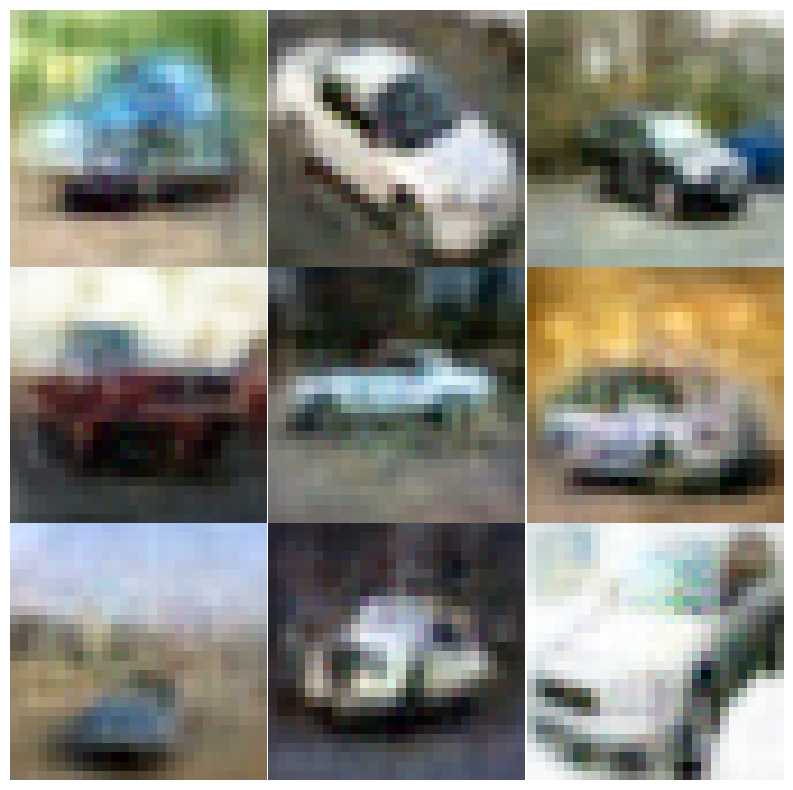

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


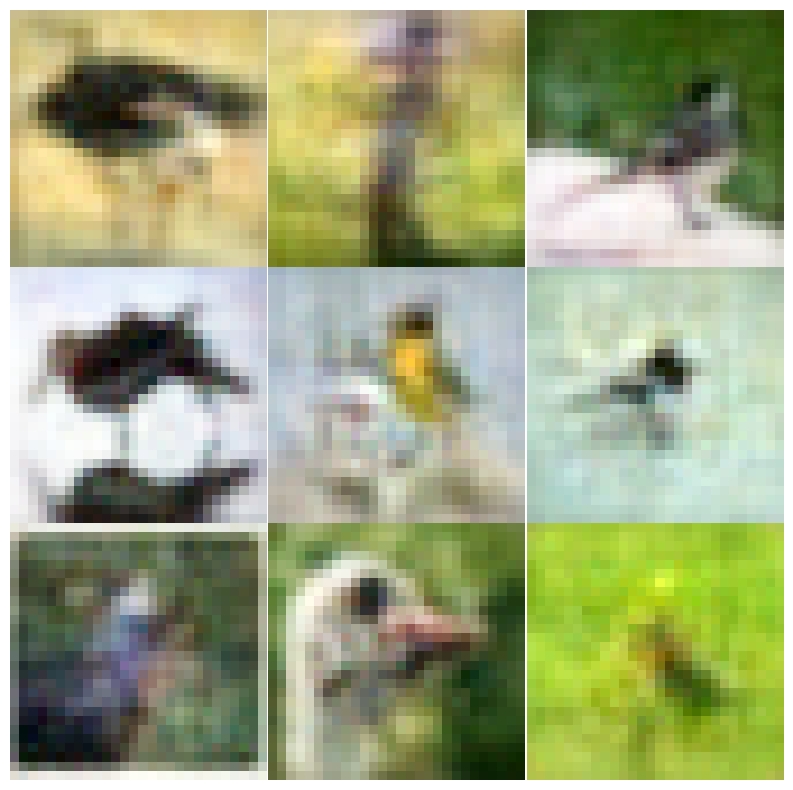

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


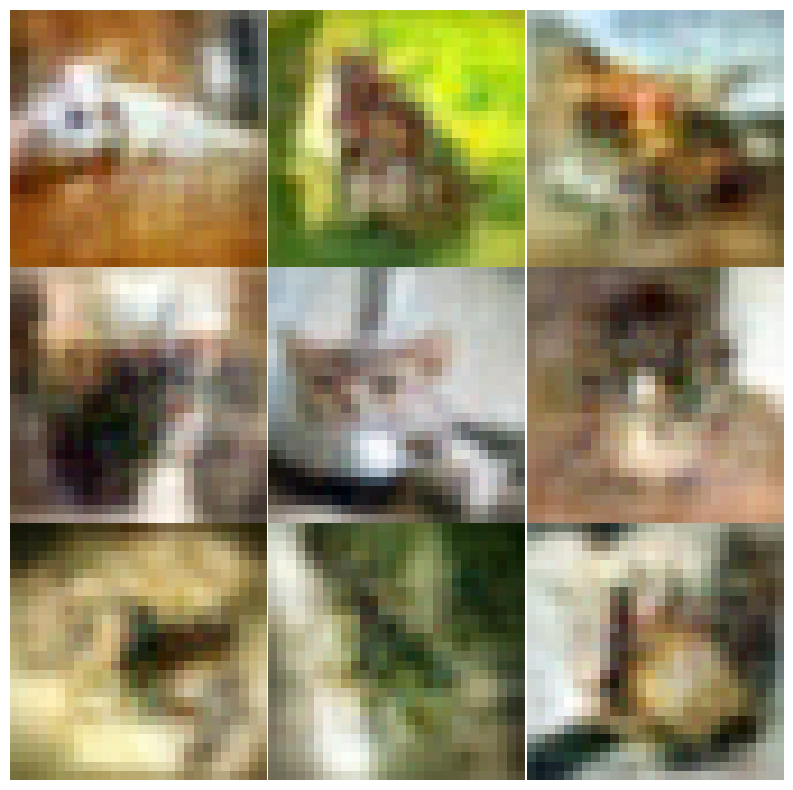

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


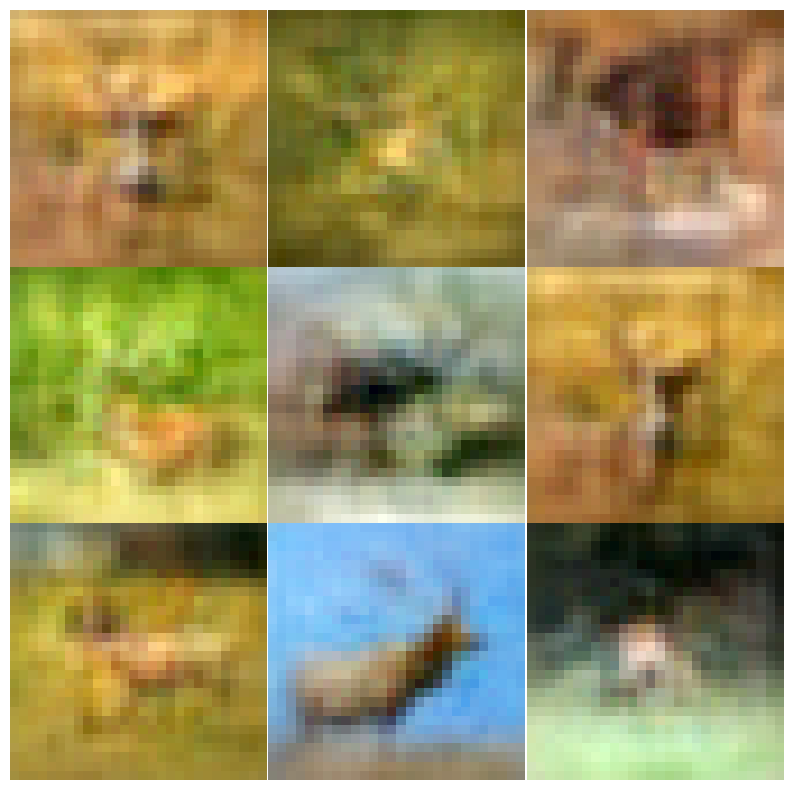

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


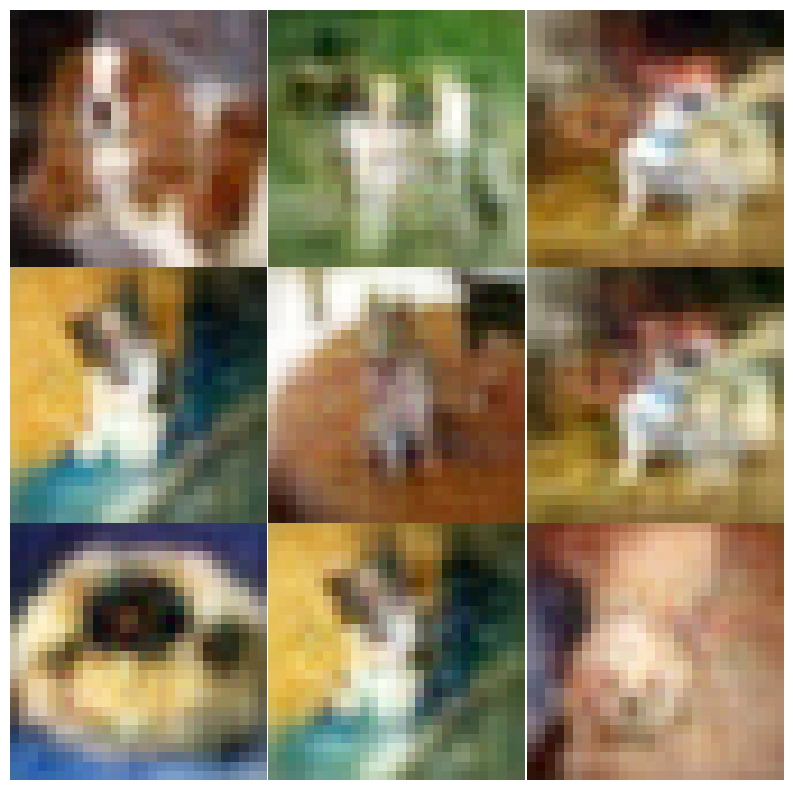

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


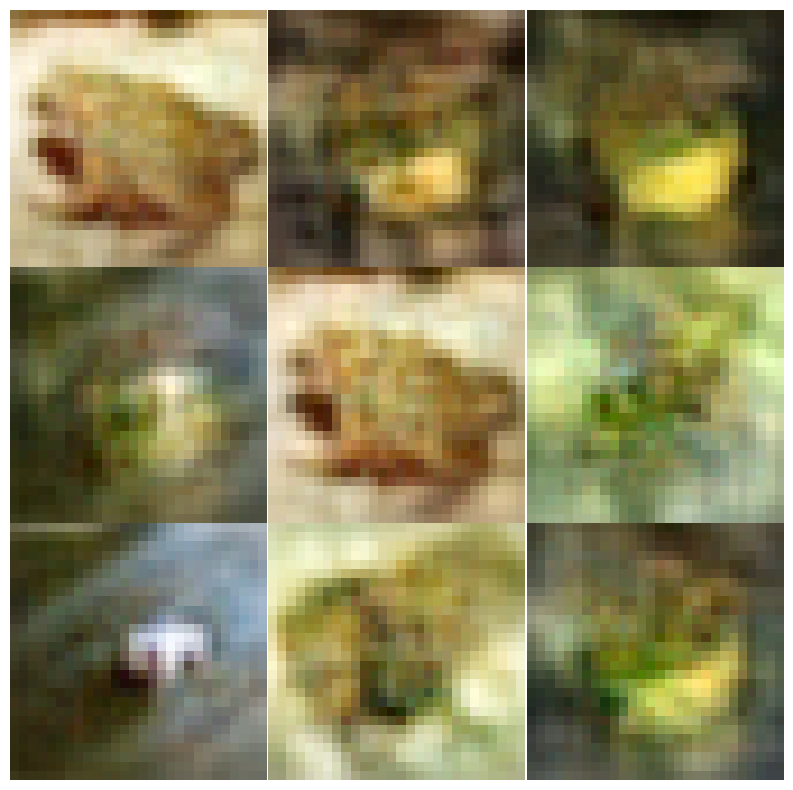

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


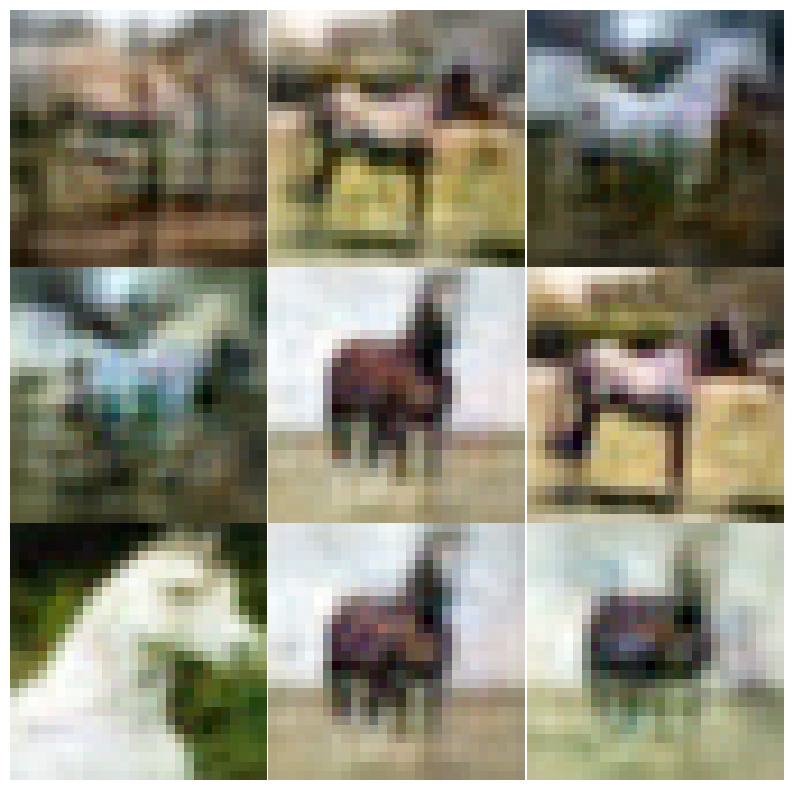

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


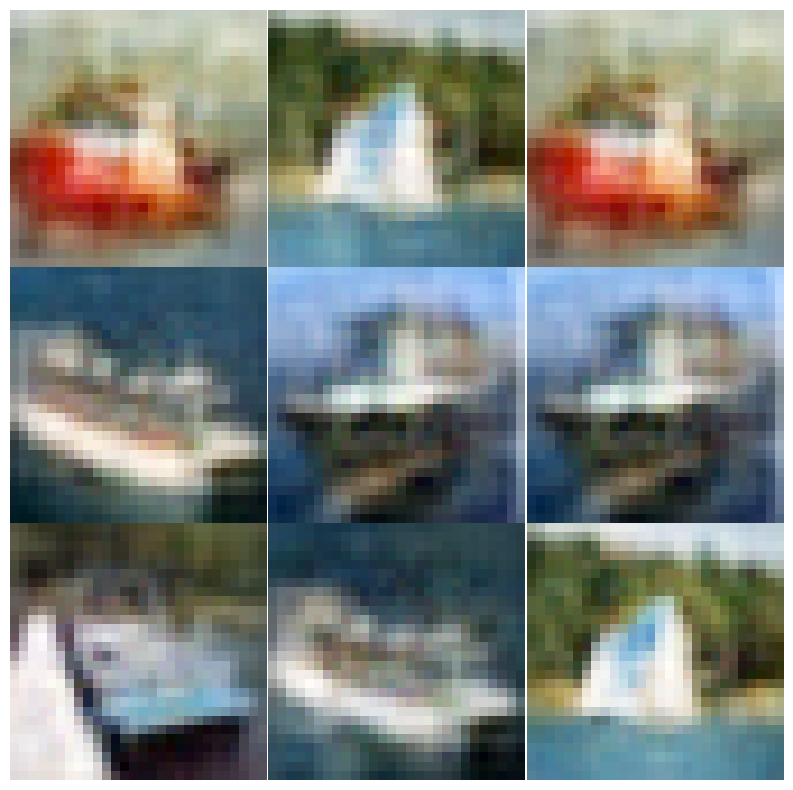

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


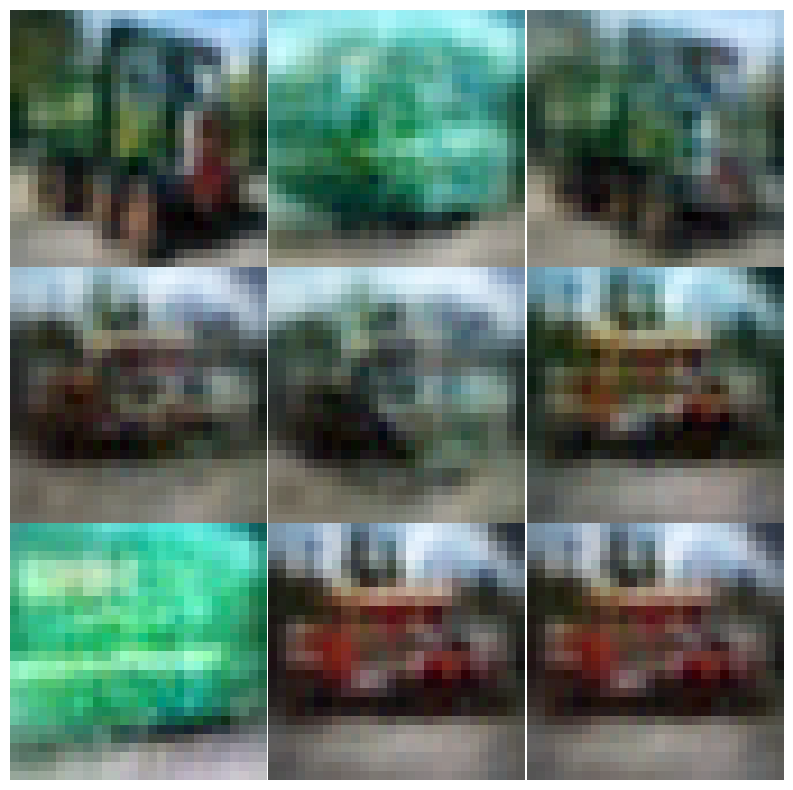

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.297394
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.285504
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.276416
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.261583
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.217267
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.167948
Train Epoch: 1 [7000/30000 (23%)]	Loss: 2.163278
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.925043
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.887573
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.848636
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.499010
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.398495
Tr

Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 0 	Train Loss: 16.149641 	mse loss: 16.069283 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 1 	Train Loss: 4.644316 	mse loss: 4.536820 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 2 	Train Loss: 2.903992 	mse loss: 2.772844 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 3 	Train Loss: 2.311940 	mse loss: 2.183447 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 4 	Train Loss: 2.084493 	mse loss: 1.949590 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 5 	Train Loss: 1.728317 	mse loss: 1.599670 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 6 	Train Loss: 1.573911 	mse loss: 1.451716 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 7 	Train Loss: 1.454792 	mse loss: 1.340783 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 8 	Train Loss: 1.347402 	mse loss: 1.240770 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 9 	Train Loss: 1.290660 	mse loss: 1.188780 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 10 	Train Loss: 1.250780 	mse loss: 1.149760 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 11 	Train Loss: 1.173469 	mse loss: 1.071968 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 12 	Train Loss: 1.132882 	mse loss: 1.032649 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 13 	Train Loss: 1.088324 	mse loss: 0.986941 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 14 	Train Loss: 1.046435 	mse loss: 0.949687 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 15 	Train Loss: 0.984115 	mse loss: 0.886060 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 16 	Train Loss: 0.979508 	mse loss: 0.883931 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 17 	Train Loss: 0.925704 	mse loss: 0.836590 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 18 	Train Loss: 0.935525 	mse loss: 0.843797 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 19 	Train Loss: 0.902030 	mse loss: 0.812247 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 20 	Train Loss: 0.872454 	mse loss: 0.784069 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 21 	Train Loss: 0.863515 	mse loss: 0.777532 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 22 	Train Loss: 0.834047 	mse loss: 0.747325 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 23 	Train Loss: 0.796229 	mse loss: 0.718976 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 24 	Train Loss: 0.805696 	mse loss: 0.723520 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 25 	Train Loss: 0.787870 	mse loss: 0.705160 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 26 	Train Loss: 0.761301 	mse loss: 0.678684 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 27 	Train Loss: 0.742818 	mse loss: 0.659766 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 28 	Train Loss: 0.769667 	mse loss: 0.681933 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 29 	Train Loss: 0.741723 	mse loss: 0.656123 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 30 	Train Loss: 0.717518 	mse loss: 0.632137 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 31 	Train Loss: 0.709611 	mse loss: 0.626865 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 32 	Train Loss: 0.693352 	mse loss: 0.613576 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 33 	Train Loss: 0.687661 	mse loss: 0.607430 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 34 	Train Loss: 0.672684 	mse loss: 0.591912 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 35 	Train Loss: 0.680035 	mse loss: 0.600988 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 36 	Train Loss: 0.677953 	mse loss: 0.598267 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 37 	Train Loss: 0.639694 	mse loss: 0.559370 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 38 	Train Loss: 0.649861 	mse loss: 0.569887 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 39 	Train Loss: 0.618135 	mse loss: 0.539353 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 40 	Train Loss: 0.621898 	mse loss: 0.540313 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 41 	Train Loss: 0.611917 	mse loss: 0.535862 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 42 	Train Loss: 0.599275 	mse loss: 0.523047 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 43 	Train Loss: 0.606455 	mse loss: 0.528023 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 44 	Train Loss: 0.578366 	mse loss: 0.503398 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 45 	Train Loss: 0.584416 	mse loss: 0.504135 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 46 	Train Loss: 0.595539 	mse loss: 0.522189 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 47 	Train Loss: 0.570446 	mse loss: 0.495239 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 48 	Train Loss: 0.553016 	mse loss: 0.479852 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 49 	Train Loss: 0.550073 	mse loss: 0.478183 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 50 	Train Loss: 0.550570 	mse loss: 0.472460 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 51 	Train Loss: 0.535801 	mse loss: 0.467662 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 52 	Train Loss: 0.526857 	mse loss: 0.457346 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 53 	Train Loss: 0.547098 	mse loss: 0.467491 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 54 	Train Loss: 0.526872 	mse loss: 0.449791 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 55 	Train Loss: 0.537263 	mse loss: 0.460834 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 56 	Train Loss: 0.508113 	mse loss: 0.440138 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 57 	Train Loss: 0.522231 	mse loss: 0.445228 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 58 	Train Loss: 0.514788 	mse loss: 0.439316 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 59 	Train Loss: 0.504021 	mse loss: 0.426010 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 60 	Train Loss: 0.490766 	mse loss: 0.419034 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 61 	Train Loss: 0.484690 	mse loss: 0.417150 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 62 	Train Loss: 0.486488 	mse loss: 0.412905 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 63 	Train Loss: 0.483097 	mse loss: 0.409737 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 64 	Train Loss: 0.469396 	mse loss: 0.394012 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 65 	Train Loss: 0.471927 	mse loss: 0.397128 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 66 	Train Loss: 0.480338 	mse loss: 0.407078 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 67 	Train Loss: 0.455052 	mse loss: 0.378134 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 68 	Train Loss: 0.462439 	mse loss: 0.392351 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 69 	Train Loss: 0.461097 	mse loss: 0.394001 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 70 	Train Loss: 0.461337 	mse loss: 0.389028 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 71 	Train Loss: 0.444679 	mse loss: 0.368250 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 72 	Train Loss: 0.439112 	mse loss: 0.366668 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 73 	Train Loss: 0.433732 	mse loss: 0.360886 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 74 	Train Loss: 0.435342 	mse loss: 0.363143 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 75 	Train Loss: 0.423189 	mse loss: 0.352713 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 76 	Train Loss: 0.428341 	mse loss: 0.356922 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 77 	Train Loss: 0.436347 	mse loss: 0.361724 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 78 	Train Loss: 0.426811 	mse loss: 0.355036 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 79 	Train Loss: 0.423302 	mse loss: 0.356450 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 80 	Train Loss: 0.424850 	mse loss: 0.352085 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 81 	Train Loss: 0.414393 	mse loss: 0.344158 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 82 	Train Loss: 0.409816 	mse loss: 0.337506 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 83 	Train Loss: 0.408321 	mse loss: 0.335833 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 84 	Train Loss: 0.401624 	mse loss: 0.332863 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 85 	Train Loss: 0.398533 	mse loss: 0.326225 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 86 	Train Loss: 0.375458 	mse loss: 0.304939 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 87 	Train Loss: 0.383681 	mse loss: 0.314229 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 88 	Train Loss: 0.389881 	mse loss: 0.321552 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 89 	Train Loss: 0.390188 	mse loss: 0.323048 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 90 	Train Loss: 0.384810 	mse loss: 0.312525 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 91 	Train Loss: 0.381964 	mse loss: 0.310085 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 92 	Train Loss: 0.373101 	mse loss: 0.298984 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 93 	Train Loss: 0.375327 	mse loss: 0.304186 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 94 	Train Loss: 0.385679 	mse loss: 0.314553 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 95 	Train Loss: 0.371372 	mse loss: 0.305533 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 96 	Train Loss: 0.365149 	mse loss: 0.295647 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.92it/s]


Epoch: 97 	Train Loss: 0.357162 	mse loss: 0.290428 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 98 	Train Loss: 0.362994 	mse loss: 0.293564 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 99 	Train Loss: 0.360857 	mse loss: 0.288832 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 100 	Train Loss: 0.349521 	mse loss: 0.280891 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 101 	Train Loss: 0.353417 	mse loss: 0.285719 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 102 	Train Loss: 0.349477 	mse loss: 0.284653 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 103 	Train Loss: 0.363975 	mse loss: 0.294861 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 104 	Train Loss: 0.347515 	mse loss: 0.276808 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 105 	Train Loss: 0.362214 	mse loss: 0.293810 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 106 	Train Loss: 0.357377 	mse loss: 0.286224 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 107 	Train Loss: 0.339930 	mse loss: 0.272345 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 108 	Train Loss: 0.340151 	mse loss: 0.271733 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 109 	Train Loss: 0.341007 	mse loss: 0.271031 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 110 	Train Loss: 0.339277 	mse loss: 0.274048 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 111 	Train Loss: 0.321515 	mse loss: 0.254853 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 112 	Train Loss: 0.323798 	mse loss: 0.254159 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 113 	Train Loss: 0.324582 	mse loss: 0.256707 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 114 	Train Loss: 0.333605 	mse loss: 0.265784 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 115 	Train Loss: 0.329169 	mse loss: 0.261614 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 116 	Train Loss: 0.341061 	mse loss: 0.271619 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 117 	Train Loss: 0.330477 	mse loss: 0.259473 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 118 	Train Loss: 0.309334 	mse loss: 0.241898 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 119 	Train Loss: 0.306279 	mse loss: 0.236410 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 120 	Train Loss: 0.312066 	mse loss: 0.245981 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 121 	Train Loss: 0.313678 	mse loss: 0.244557 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 122 	Train Loss: 0.316931 	mse loss: 0.248701 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 123 	Train Loss: 0.315249 	mse loss: 0.246012 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 124 	Train Loss: 0.310962 	mse loss: 0.240589 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 125 	Train Loss: 0.299759 	mse loss: 0.232257 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 126 	Train Loss: 0.300277 	mse loss: 0.235383 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 127 	Train Loss: 0.306207 	mse loss: 0.239044 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 128 	Train Loss: 0.300947 	mse loss: 0.233027 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 129 	Train Loss: 0.290350 	mse loss: 0.226254 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 130 	Train Loss: 0.297997 	mse loss: 0.232730 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 131 	Train Loss: 0.308376 	mse loss: 0.240480 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 132 	Train Loss: 0.299817 	mse loss: 0.230262 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 133 	Train Loss: 0.295671 	mse loss: 0.226229 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 134 	Train Loss: 0.292454 	mse loss: 0.224742 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 135 	Train Loss: 0.284957 	mse loss: 0.216100 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 136 	Train Loss: 0.285662 	mse loss: 0.217657 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 137 	Train Loss: 0.293681 	mse loss: 0.226248 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 138 	Train Loss: 0.283692 	mse loss: 0.217916 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 139 	Train Loss: 0.299803 	mse loss: 0.230852 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 140 	Train Loss: 0.292385 	mse loss: 0.224189 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 141 	Train Loss: 0.280168 	mse loss: 0.212644 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 142 	Train Loss: 0.276527 	mse loss: 0.210823 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 143 	Train Loss: 0.283345 	mse loss: 0.218020 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 144 	Train Loss: 0.276493 	mse loss: 0.213143 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 145 	Train Loss: 0.275788 	mse loss: 0.208698 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 146 	Train Loss: 0.272850 	mse loss: 0.206642 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 147 	Train Loss: 0.281495 	mse loss: 0.214370 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 148 	Train Loss: 0.268864 	mse loss: 0.200616 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 149 	Train Loss: 0.270571 	mse loss: 0.205985 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 150 	Train Loss: 0.265957 	mse loss: 0.202263 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 151 	Train Loss: 0.271118 	mse loss: 0.204558 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 152 	Train Loss: 0.269650 	mse loss: 0.203738 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 153 	Train Loss: 0.256922 	mse loss: 0.189978 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 154 	Train Loss: 0.272943 	mse loss: 0.208084 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 155 	Train Loss: 0.258329 	mse loss: 0.194370 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 156 	Train Loss: 0.265782 	mse loss: 0.197556 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 157 	Train Loss: 0.260254 	mse loss: 0.193369 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 158 	Train Loss: 0.248670 	mse loss: 0.182834 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 159 	Train Loss: 0.251562 	mse loss: 0.187852 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 160 	Train Loss: 0.262553 	mse loss: 0.195376 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 161 	Train Loss: 0.261933 	mse loss: 0.196081 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 162 	Train Loss: 0.257988 	mse loss: 0.190228 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 163 	Train Loss: 0.256695 	mse loss: 0.190378 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 164 	Train Loss: 0.269892 	mse loss: 0.203605 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 165 	Train Loss: 0.267502 	mse loss: 0.200285 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 166 	Train Loss: 0.255998 	mse loss: 0.193869 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 167 	Train Loss: 0.249350 	mse loss: 0.183052 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 168 	Train Loss: 0.247680 	mse loss: 0.182663 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 169 	Train Loss: 0.253848 	mse loss: 0.188565 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 170 	Train Loss: 0.250787 	mse loss: 0.185260 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 171 	Train Loss: 0.255096 	mse loss: 0.186189 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 172 	Train Loss: 0.247394 	mse loss: 0.183691 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 173 	Train Loss: 0.251111 	mse loss: 0.184662 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 174 	Train Loss: 0.246733 	mse loss: 0.181308 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 175 	Train Loss: 0.249601 	mse loss: 0.181220 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 176 	Train Loss: 0.251467 	mse loss: 0.184991 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 177 	Train Loss: 0.249306 	mse loss: 0.186216 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 178 	Train Loss: 0.242875 	mse loss: 0.177475 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 179 	Train Loss: 0.238254 	mse loss: 0.173950 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 180 	Train Loss: 0.238035 	mse loss: 0.174356 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 181 	Train Loss: 0.234183 	mse loss: 0.170194 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 182 	Train Loss: 0.238123 	mse loss: 0.172005 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 183 	Train Loss: 0.247085 	mse loss: 0.185878 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 184 	Train Loss: 0.243008 	mse loss: 0.176417 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 185 	Train Loss: 0.239554 	mse loss: 0.172525 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 186 	Train Loss: 0.246978 	mse loss: 0.180899 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.91it/s]


Epoch: 187 	Train Loss: 0.238697 	mse loss: 0.178422 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 188 	Train Loss: 0.237369 	mse loss: 0.171006 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 189 	Train Loss: 0.226709 	mse loss: 0.162622 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 190 	Train Loss: 0.236316 	mse loss: 0.171966 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 191 	Train Loss: 0.240386 	mse loss: 0.173006 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 192 	Train Loss: 0.235298 	mse loss: 0.172899 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.89it/s]


Epoch: 193 	Train Loss: 0.228901 	mse loss: 0.165221 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 194 	Train Loss: 0.226335 	mse loss: 0.163476 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 195 	Train Loss: 0.224210 	mse loss: 0.159867 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 196 	Train Loss: 0.225440 	mse loss: 0.162940 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 197 	Train Loss: 0.225397 	mse loss: 0.160843 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 198 	Train Loss: 0.234007 	mse loss: 0.170897 	mse2 loss: 0.000000


Loading...: 100%|██████████| 73/73 [00:25<00:00,  2.90it/s]


Epoch: 199 	Train Loss: 0.230392 	mse loss: 0.165864 	mse2 loss: 0.000000
/home/s2522002/source_code/model/enc.pth
/home/s2522002/source_code/model/dec.pth

total time(min): 83.89


0
torch.Size([2000, 3, 28, 28])
class tensor(1)
torch.Size([2000, 300])
after smote (1000, 300)
after smote (1000,)
after smote&to tensor torch.Size([1000, 300])
after decoder (1000, 3, 28, 28)


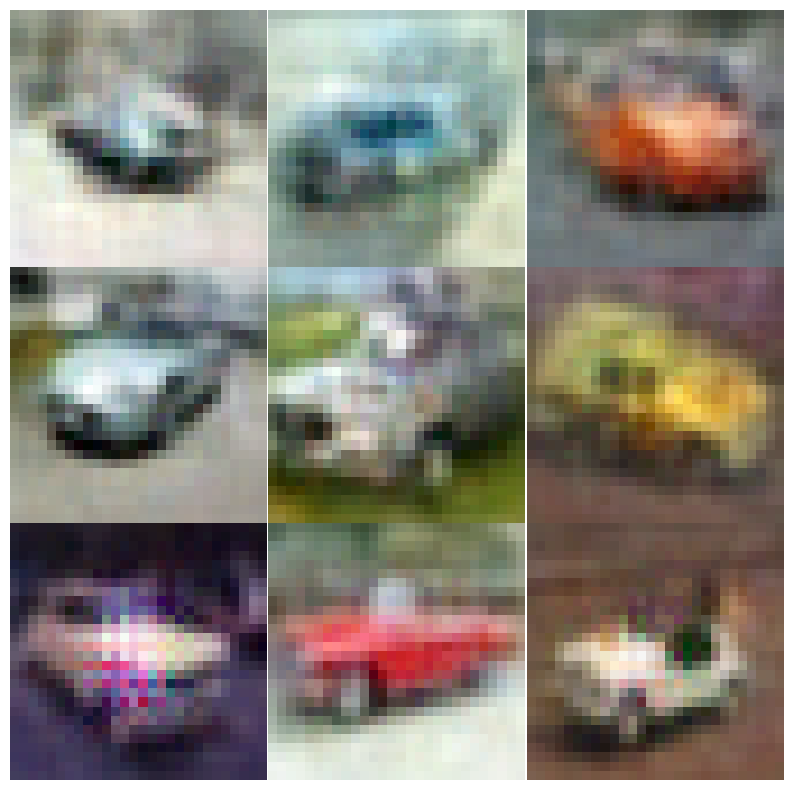

torch.Size([1000, 3, 28, 28])
class tensor(2)
torch.Size([1000, 300])
after smote (2000, 300)
after smote (2000,)
after smote&to tensor torch.Size([2000, 300])
after decoder (2000, 3, 28, 28)


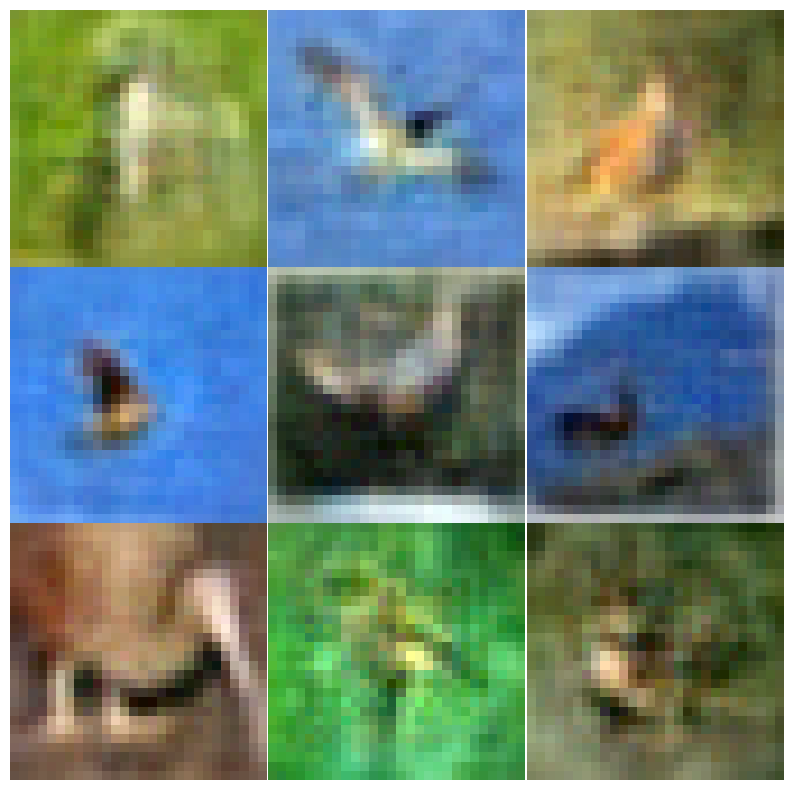

torch.Size([750, 3, 28, 28])
class tensor(3)
torch.Size([750, 300])
after smote (2250, 300)
after smote (2250,)
after smote&to tensor torch.Size([2250, 300])
after decoder (2250, 3, 28, 28)


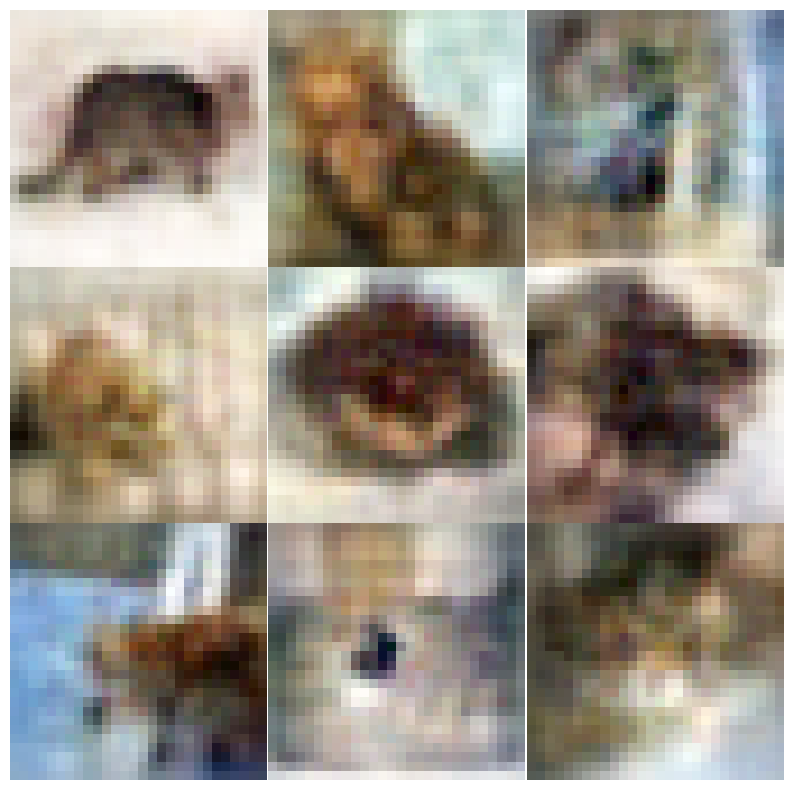

torch.Size([500, 3, 28, 28])
class tensor(4)
torch.Size([500, 300])
after smote (2500, 300)
after smote (2500,)
after smote&to tensor torch.Size([2500, 300])
after decoder (2500, 3, 28, 28)


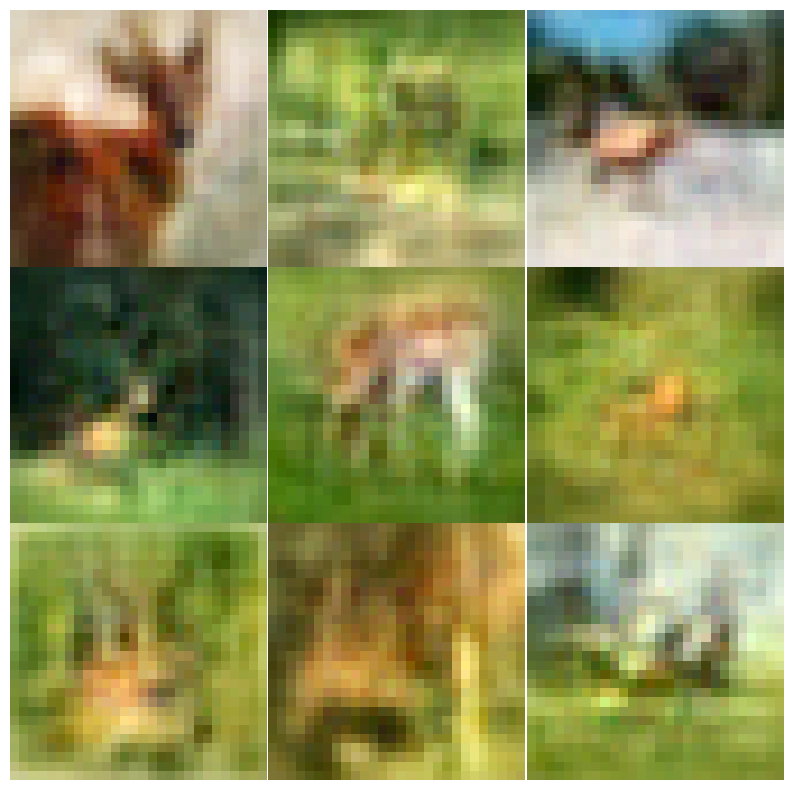

torch.Size([12, 3, 28, 28])
class tensor(5)
torch.Size([12, 300])
after smote (2988, 300)
after smote (2988,)
after smote&to tensor torch.Size([2988, 300])
after decoder (2988, 3, 28, 28)


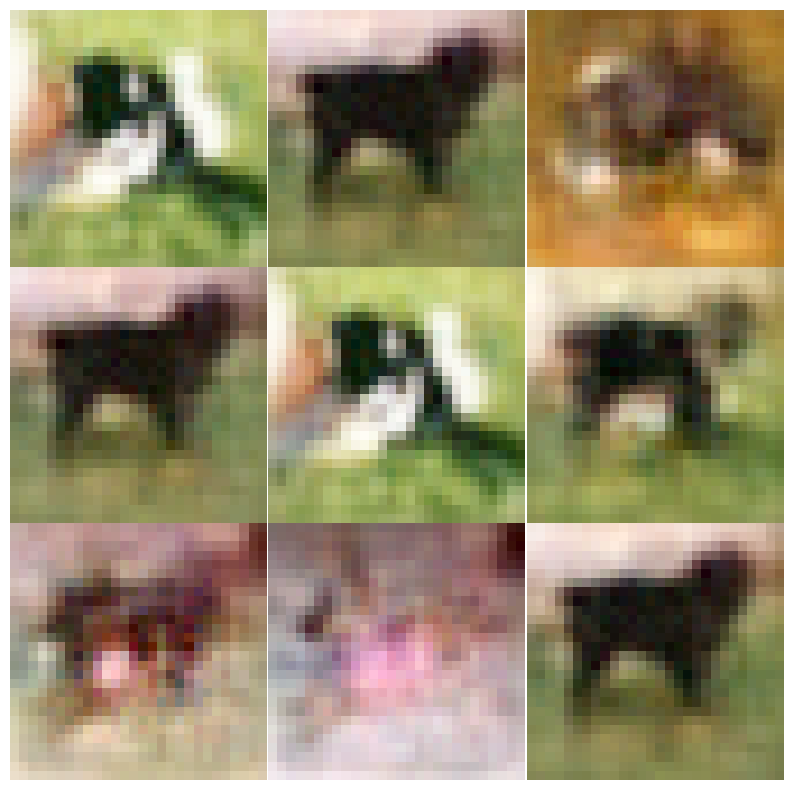

torch.Size([10, 3, 28, 28])
class tensor(6)
torch.Size([10, 300])
after smote (2990, 300)
after smote (2990,)
after smote&to tensor torch.Size([2990, 300])
after decoder (2990, 3, 28, 28)


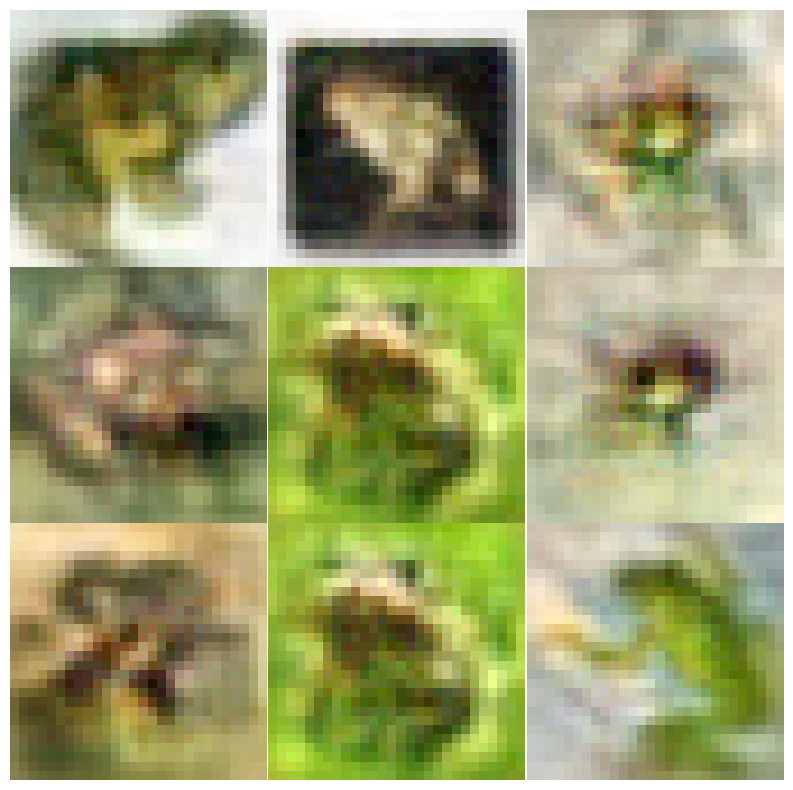

torch.Size([8, 3, 28, 28])
class tensor(7)
torch.Size([8, 300])
after smote (2992, 300)
after smote (2992,)
after smote&to tensor torch.Size([2992, 300])
after decoder (2992, 3, 28, 28)


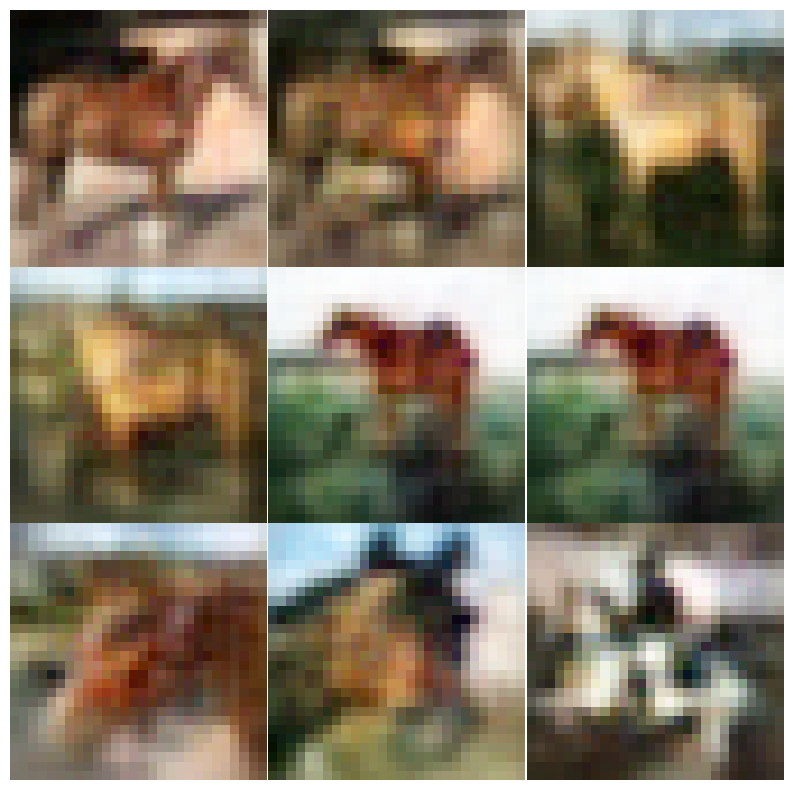

torch.Size([6, 3, 28, 28])
class tensor(8)
torch.Size([6, 300])
after smote (2994, 300)
after smote (2994,)
after smote&to tensor torch.Size([2994, 300])
after decoder (2994, 3, 28, 28)


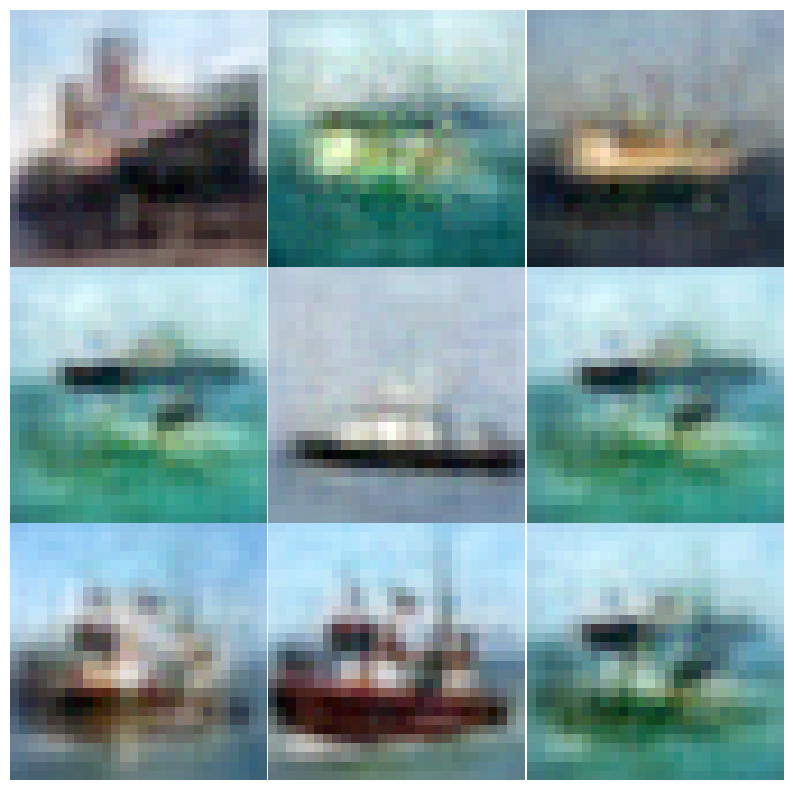

torch.Size([4, 3, 28, 28])
class tensor(9)
torch.Size([4, 300])
after smote (2996, 300)
after smote (2996,)
after smote&to tensor torch.Size([2996, 300])
after decoder (2996, 3, 28, 28)


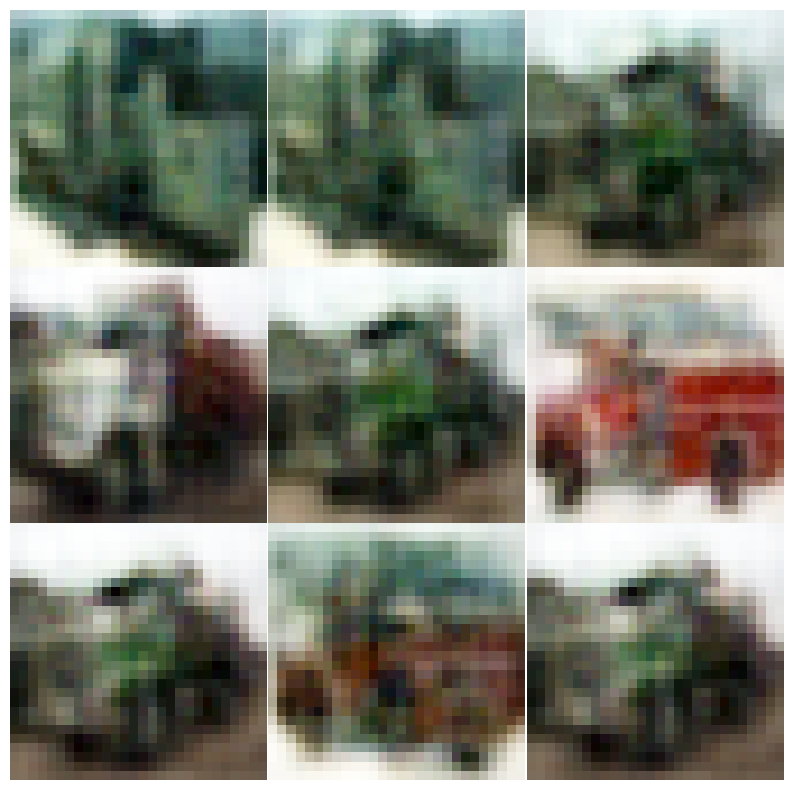

after generate (22710, 3, 28, 28)
after generate (22710,)
reshape (22710, 2352)
decx1(imb imported)  torch.Size([7290, 2352])
combined (30000, 2352)
combined (30000,)

final time(min): 0.10
#Dataset = 1
#Dataset = 1
(30000, 3, 28, 28)
(30000,)
Counter({1.0: 3000, 2.0: 3000, 3.0: 3000, 4.0: 3000, 5.0: 3000, 6.0: 3000, 7.0: 3000, 8.0: 3000, 9.0: 3000, 0.0: 3000})
train imgs after reshape  (30000, 3, 28, 28)
Train Epoch: 1 [1000/30000 (3%)]	Loss: 2.290470
Train Epoch: 1 [2000/30000 (7%)]	Loss: 2.280184
Train Epoch: 1 [3000/30000 (10%)]	Loss: 2.270815
Train Epoch: 1 [4000/30000 (13%)]	Loss: 2.262349
Train Epoch: 1 [5000/30000 (17%)]	Loss: 2.234185
Train Epoch: 1 [6000/30000 (20%)]	Loss: 2.171809
Train Epoch: 1 [7000/30000 (23%)]	Loss: 1.915905
Train Epoch: 1 [8000/30000 (27%)]	Loss: 1.873205
Train Epoch: 1 [9000/30000 (30%)]	Loss: 1.613750
Train Epoch: 1 [10000/30000 (33%)]	Loss: 1.629604
Train Epoch: 1 [11000/30000 (37%)]	Loss: 1.429036
Train Epoch: 1 [12000/30000 (40%)]	Loss: 1.432743
Tr

In [17]:
args['epochs'] = 200
trainingDataset_loss = []
avg_accuracy_list = []
avg_sensitivity_list = []
avg_specificity_list = []
avg_precision_list = []

g_mean_list = []
f_measure_list = []
acsa_list = []
cm_list = []

t3=0
for dataset,imbalanced_train in zip(folds_data,imbalanced_train_dataset_list):  #len(ids)
    print()
    print('Start...')
    encoder = Encoder(args)
    decoder = Decoder(args)

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    print(device)
    decoder = decoder.to(device)
    encoder = encoder.to(device)

    train_on_gpu = torch.cuda.is_available()

    #decoder loss function
    criterion = nn.MSELoss()
    criterion = criterion.to(device)

    batch_size = 100
    num_workers = 0

    train_loader = dataset[0]

    classes = ('0', '1', '2', '3', '4',
           '5', '6', '7', '8', '9')

    best_loss = np.inf

    list_zhat_test,list_labs_test = [],[]

    t0 = time.time()
    if args['train']:
        enc_optim = torch.optim.Adam(encoder.parameters(), lr = args['lr'])
        dec_optim = torch.optim.Adam(decoder.parameters(), lr = args['lr'])

        for epoch in range(args['epochs']):
            train_loss = 0.0
            tmse_loss = 0.0
            tdiscr_loss = 0.0
            # train for one epoch -- set nets to train mode
            encoder.train()
            decoder.train()

            for images,labs in tqdm(train_loader,desc='Loading...'):

                # zero gradients for each batch
                encoder.zero_grad()
                decoder.zero_grad()
                #print(images)
                images, labs = images.to(device), labs.to(device)
                #print('images ',images.shape)
                labsn = labs.detach().cpu().numpy()
                #print('labsn ',labsn.shape, labsn)


                num_clss_in_bag = np.unique(labsn) #return_inverse=True)
                train_list = [[] for _ in range(args['num_class'])]

                # run images
                z_hat,x0_hat = encoder(images,labsn)

                # Class images Bagging from z_hat
                for i, label in enumerate(labsn):
                  train_list[int(label)].append(z_hat[i])

                loss_list = [[] for _ in range(args['num_class'])]
                for j in num_clss_in_bag:
 
                  size = x0_hat[j].size()
                  test_x0 = torch.stack(train_list[j]).to(device)
                  test_x0 = test_x0.detach().cpu().numpy()  # Convert to NumPy array after detaching
                  test_x0 = np.resize(test_x0, size)
                  test_x0 = torch.from_numpy(test_x0).to(device)

                  mse2 = criterion(x0_hat[j],test_x0)

                  loss_list[j] = mse2

                # Convert empty lists to zero tensors to allow summation
                loss_list = [torch.tensor(0.0).to(device) if not l else l for l in loss_list ]

                #sys.exit(1)

                if epoch == args['epochs']-1:
                      list_labs_test = np.append(list_labs_test, labsn )
                      list_zhat_test = np.append(list_zhat_test,z_hat.cpu().detach().numpy())

                x_hat = decoder(z_hat)

                mse = criterion(x_hat,images)



                total_sums = calculate_diffs(x0_hat)
                total_sums_array = np.array(total_sums)
                total_sums_array[total_sums_array == 0] = 0  # This line ensures 0 values stay as 0
                #print(total_sums_array)
                mse3 = np.zeros_like( total_sums_array, dtype = float)
                nonzero_indices = np.where( total_sums_array != 0)
                mse3[nonzero_indices] = 1/total_sums_array[nonzero_indices]

                comb_loss = mse + sum(loss_list) + sum(mse3)
                comb_loss.backward()

                enc_optim.step()
                dec_optim.step()

                train_loss += comb_loss.item()*images.size(0)
                tmse_loss += mse.item()*images.size(0)


            # print avg training statistics
            train_loss = train_loss/len(train_loader)
            tmse_loss = tmse_loss/len(train_loader)
            tdiscr_loss = 0 #tdiscr_loss/len(train_loader)
            print('Epoch: {} \tTrain Loss: {:.6f} \tmse loss: {:.6f} \tmse2 loss: {:.6f}'.format(epoch,
                    train_loss,tmse_loss,tdiscr_loss))
            trainingDataset_loss.append(train_loss)

        #save model
        path_enc = '/home/s2522002/source_code/model/enc.pth'
        path_dec = '/home/s2522002/source_code/model/dec.pth'
        print(path_enc)
        print(path_dec)
        torch.save(encoder.state_dict(), path_enc)
        torch.save(decoder.state_dict(), path_dec)
        print()

    t1 = time.time()
    print('total time(min): {:.2f}'.format((t1 - t0)/60))
    
    ################  PLOT TRAIN DISTRIBUTION ######################
    from sklearn.decomposition import PCA
    import numpy as np
    import pandas as pd
    import plotly.express as px
    
    #list_labs_test,list_zhat_test
    copy_list_zhat_test = list_zhat_test.copy()
    
    first_dim = len(list_zhat_test) // args['n_z']
    list_zhat_test_reshape =  copy_list_zhat_test.reshape(first_dim, args['n_z'])
    
    from sklearn.manifold import TSNE
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(list_zhat_test_reshape)
    fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=list_labs_test)
    fig.show()
    
    ############ GENERATE ###########################################################
    import collections
    import torch
    import torch.nn as nn
    from torch.utils.data import TensorDataset
    import numpy as np
    from sklearn.neighbors import NearestNeighbors
    import time
    import os
    import sys
    import matplotlib.pyplot as plt
    np.printoptions(precision=5,suppress=True)
    
    #path on the computer where the models are stored
    latent_img,latent_lab = [],[]
    modpth = '/home/s2522002/source_code/model'    
    
    encf = []
    decf = []
    for p in range(1):
        enc = modpth + '/' + '/enc.pth'
        dec = modpth + '/' + '/dec.pth'
        encf.append(enc)
        decf.append(dec)
    
    for m in range(1):
        print(m)
    
        classes = ('0', '1', '2', '3', '4',
               '5', '6', '7', '8', '9')
    
        #generate some images
        train_on_gpu = torch.cuda.is_available()
        device = 'cuda' if torch.cuda.is_available() else 'cpu'
        path_enc = encf[m]
        path_dec = decf[m]
    
        encoder = Encoder(args)
        # Load the encoder state dictionary and map to the available device
        encoder.load_state_dict(torch.load(path_enc, map_location=device), strict=False)
        encoder = encoder.to(device)
    
        decoder = Decoder(args)
        decoder.load_state_dict(torch.load(path_dec, map_location=device), strict=False)
        decoder = decoder.to(device)
    
        encoder.eval()
        decoder.eval()
    
        imbal = [3000, 2000, 1000, 750, 500, 12, 10, 8, 6, 4]
    
        resx = []
        resy = []
        
        data = [item[0] for item in imbalanced_train]
        target = [item[1] for item in imbalanced_train]
        data = torch.stack(data)
        target = torch.tensor(target)

        t0 = time.time()
        for i in range(1,10):
    
            xclass, yclass = biased_get_class1(i,data,target)
    
            print(xclass.shape) #(500, 3, 32, 32)
            print('class',yclass[0]) #(500,)
    
            #encode xclass to feature space
            #xclass = torch.Tensor(xclass)
            xclass = xclass.to(device)
            xclass,_ = encoder(xclass,yclass)
            print(xclass.shape) #torch.Size([500, 600])

            xclass = xclass.detach().cpu().numpy()

            latent_img = np.append(latent_img, xclass)
            latent_lab = np.append(latent_lab, yclass)
            
            n = imbal[0] - imbal[i]
    
            #SMOTE
            xsamp, ysamp = Generate_SMOTE(xclass,yclass,n,i)
            print('after smote',xsamp.shape) #(4500, 600)
            ysamp = np.array(ysamp)
            print('after smote',ysamp.shape) #4500
            xsamp = torch.Tensor(xsamp)
            xsamp = xsamp.to(device)
            
            print('after smote&to tensor',xsamp.shape) 
           
            ximg = decoder(xsamp)
    
            ximn = ximg.detach().cpu().numpy()
            print('after decoder',ximn.shape) #(4500, 3, 32, 32)
           
            resx.append(ximn)
            resy.append(ysamp)
    
            # Squeeze the first dimension to get a compatible shape for imshow
            
            plt.figure(figsize=(10,10))
            for k in range(9):
              plt.subplot(3,3,k+1)
              ximn_squeezed = ximn[k].squeeze()
              min_val = np.min(ximn_squeezed)
              max_val = np.max(ximn_squeezed)
              normalized_image = (ximn_squeezed - min_val) / (max_val - min_val) # Normalizing to 0-1
              #To convert to 0-255
              image_data_255 = (normalized_image * 255).astype(np.uint8)
              plt.imshow(np.transpose(image_data_255, (1, 2, 0)))
              plt.axis('off')
            plt.subplots_adjust(wspace=0, hspace=0)
            plt.show()
    
    
        t1 = time.time()
        resx1 = np.vstack(resx)
        resy1 = np.hstack(resy)
    
        print('after generate',resx1.shape) #(34720, 3, 32, 32)
        print('after generate',resy1.shape) #(34720,)
    
        resx1 = resx1.reshape(resx1.shape[0],-1)
        print('reshape',resx1.shape) #(34720, 3072)
    
        dec_x1 = data.reshape(data.shape[0],-1)
        print('decx1(imb imported) ',dec_x1.shape)
        combx = np.vstack((resx1,dec_x1))
        comby = np.hstack((resy1,target))
    
        print('combined',combx.shape) #(45000, 3, 32, 32)
        print('combined',comby.shape) #(45000,)
    
        ifile = '/home/s2522002/source_code/sampling/balimg/trn_img.txt'
        np.savetxt(ifile, combx)

        lfile = '/home/s2522002/source_code/sampling/ballab/trn_lab.txt'
        np.savetxt(lfile,comby)
    
        print()
        #sys.exit(1)
    
    
    print('final time(min): {:.2f}'.format((t1 - t0)/60))

    #  PLOT BALANCED DISTRIBUTION ##########################################################
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)

    from sklearn.manifold import TSNE
    #tsne = TSNE(n_components=2, random_state=42)
    #X_tsne = tsne.fit_transform(dec_x)
    #fig = px.scatter(x=X_tsne[:, 0], y=X_tsne[:, 1], color=dec_y)
    #fig.show()

    #  IMPORT BL IMAGES ###########################################################
    from sklearn.model_selection import KFold
    import numpy as np
    import collections
    import torch
    from torch.utils.data import TensorDataset
    
    dtrnimg = '/home/s2522002/source_code/sampling/balimg'
    dtrnlab = '/home/s2522002/source_code/sampling/ballab'
    
    ids = os.listdir(dtrnimg)
    idtri_f = [os.path.join(dtrnimg, image_id) for image_id in ids]
    
    ids = os.listdir(dtrnlab)
    idtrl_f = [os.path.join(dtrnlab, image_id) for image_id in ids]
    
    print("#Dataset =",len(ids))
    
    trnimgfile = idtri_f[0]
    trnlabfile = idtrl_f[0]
    dec_x = np.loadtxt(trnimgfile)
    dec_y = np.loadtxt(trnlabfile)
    #Reshape
    dec_x = dec_x.reshape(dec_x.shape[0],3,28,28)
    
    batch_size = 100
    num_workers = 0
    
    #torch.Tensor returns float so if want long then use torch.tensor
    tensor_x = torch.Tensor(dec_x)
    tensor_y = torch.tensor(dec_y,dtype=torch.long)
    mnist_bal = TensorDataset(tensor_x,tensor_y)
    train_loader = torch.utils.data.DataLoader(mnist_bal,
                    batch_size=batch_size,shuffle=True,num_workers=num_workers)
    
    print(np.shape(dec_x))
    print(np.shape(dec_y))
    
    print(collections.Counter(dec_y))
    
    print('train imgs after reshape ',dec_x.shape)

    #  TRAIN CNN
    # Create model, optimizer, and loss function
    #check gpu
    import torch.optim as optim
    import torch.nn as nn
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    #set hyperparameter
    EPOCH = 2
    pre_epoch = 0
    BATCH_SIZE = 100
    LR = 0.01
    
    model = SimpleCNN().to(device)#ResNetMNIST().to(device)#SimpleCNN().to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LR, momentum=0.9, weight_decay=5e-4) #optim.Adam(model.parameters())
    
    # Training loop
    num_epochs = 5
    for epoch in range(num_epochs):
        for batch_idx, (data, target) in enumerate(train_loader):
            data = data.to(device)
            target = target.to(device)
            optimizer.zero_grad()
    
            output = model(data)
    
            loss = criterion(output, target)
            loss.backward()
            optimizer.step()
    
            if (batch_idx + 1) % 10 == 0:
                print(
                    "Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}".format(
                        epoch + 1,
                        (batch_idx+1) * len(data),
                        len(train_loader.dataset),
                        100.0 * (batch_idx+1) / len(train_loader),
                        loss.item(),
                    )
                )
    
    print("Training finished!")


    #  TEST CNN
    # prompt: measure ACSA, GM, and FM from imbalanced_test_loader
    import numpy as np
    from sklearn.metrics import confusion_matrix
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()  # Set the model to evaluation mode
    
    true_labels = []
    predicted_labels = []
    
    with torch.no_grad():
        for data, target in dataset[1]:
            data = data.to(device)
            target = target.to(device)
    
            output = model(data)
            _, predicted = torch.max(output.data, 1)
    
            true_labels.extend(target.cpu().numpy())
            predicted_labels.extend(predicted.cpu().numpy())
    
    cm = confusion_matrix(true_labels, predicted_labels)
    print("Confusion Matrix:")
    print(cm)
    cm_list.append(cm)
    
    # Calculate class-wise accuracy, sensitivity, specificity, and precision
    class_accuracies = []
    class_sensitivities = []
    class_specificities = []
    class_precisions = []
    
    for i in range(cm.shape[0]):
      tp = cm[i, i]
      fp = np.sum(cm[:, i]) - tp
      fn = np.sum(cm[i, :]) - tp
      tn = np.sum(cm) - tp - fp - fn
    
      class_accuracy = (tp + tn) / (tp + fp + fn + tn) if (tp + fp + fn + tn) > 0 else 0
      class_sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
      class_specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
      class_precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    
      class_accuracies.append(class_accuracy)
      class_sensitivities.append(class_sensitivity)
      class_specificities.append(class_specificity)
      class_precisions.append(class_precision)
    
    # Calculate the average accuracy, sensitivity, specificity, and precision
    avg_accuracy = np.mean(class_accuracies)
    avg_sensitivity = np.mean(class_sensitivities)
    avg_specificity = np.mean(class_specificities)
    avg_precision = np.mean(class_precisions)
    
    # Calculate G-mean and F-measure
    g_mean = np.sqrt(avg_sensitivity * avg_specificity)
    f_measure = 2 * (avg_precision * avg_sensitivity) / (avg_precision + avg_sensitivity) if (avg_precision + avg_sensitivity) > 0 else 0
    
    print("\nAverage Accuracy:", avg_accuracy)
    print("Average Sensitivity:", avg_sensitivity)
    print("Average Specificity:", avg_specificity)
    print("Average Precision:", avg_precision)
    
    print("\nG-mean:", g_mean)
    print("F-measure:", f_measure)
    
    # Calculate ACSA (Average Class-wise Sensitivity and Accuracy)
    acsa = (avg_sensitivity + avg_accuracy) / 2
    print("\nACSA:", acsa)
    
    avg_accuracy_list.append(avg_accuracy)
    print(avg_accuracy_list)
    avg_sensitivity_list.append(avg_sensitivity)
    avg_specificity_list.append(avg_specificity)
    avg_precision_list.append(avg_precision)
    g_mean_list.append(g_mean)
    f_measure_list.append(f_measure)
    acsa_list.append(acsa)

t4 = time.time()
print('final time(min): {:.2f}'.format((t4 - t3)/60))

### Avg via folders

In [18]:
import statistics
print("Average Accuracy:", statistics.mean(avg_accuracy_list))
print("Average Sensitivity:", statistics.mean(avg_sensitivity_list))
print("Average Specificity:", statistics.mean(avg_specificity_list))
print("Average Precision:", statistics.mean(avg_precision_list))

print("\nG-mean:", statistics.mean(g_mean_list))
print("F-measure:", statistics.mean(f_measure_list))
print("\nACSA:", statistics.mean(acsa_list))
print(cm_list)

Average Accuracy: 0.86204
Average Sensitivity: 0.3102
Average Specificity: 0.9233555555555557
Average Precision: 0.39866647385462933

G-mean: 0.535122978127111
F-measure: 0.3488060020015873

ACSA: 0.58612
[array([[679,  88,  57,  85,  88,   0,   0,   1,   2,   0],
       [105, 792,   9,  63,  26,   0,   2,   0,   1,   2],
       [ 75,  44, 311, 265, 289,  10,   1,   3,   1,   1],
       [ 46,  54,  74, 724,  92,   7,   2,   0,   1,   0],
       [ 76,  39,  96, 206, 574,   5,   0,   0,   4,   0],
       [ 30,  37,  95, 703, 118,  14,   2,   0,   1,   0],
       [ 16,  48,  51, 560, 298,  10,  17,   0,   0,   0],
       [138,  59,  67, 320, 381,  25,   0,   5,   4,   1],
       [459, 280,  34, 147,  71,   0,   1,   0,   8,   0],
       [185, 527,  20, 194,  61,   0,   0,   2,   5,   6]]), array([[828,  70,  43,  29,  28,   0,   0,   1,   1,   0],
       [124, 824,   9,  26,  13,   1,   2,   0,   1,   0],
       [169,  45, 448, 150, 179,   2,   4,   3,   0,   0],
       [121,  57, 150, 57

# Terminal